In [1]:
pip install pyclustertend

In [2]:
pip install bioinfokit

In [3]:
import pandas as pd
import numpy as np
import math
import datetime as dt
import re
from os.path import join
import os
from sklearn.base import clone

from matplotlib import pyplot
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.manifold import TSNE
from sompy.visualization.mapview import View2D
from sompy.visualization.bmuhits import BmuHitsView
from sompy.visualization.hitmap import HitMapView

from sklearn import metrics
from sklearn.metrics import pairwise_distances
from sklearn.metrics import silhouette_score, silhouette_samples

from sklearn.decomposition import PCA
from sklearn.preprocessing import MinMaxScaler, StandardScaler, OneHotEncoder
from sklearn.impute import KNNImputer
from pyclustertend import hopkins
from pyclustertend import vat
from pyclustertend import ivat
from sklearn.utils import shuffle

from sklearn.cluster import DBSCAN, KMeans, AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import KMeans
from sklearn.cluster import MeanShift
import sompy

%matplotlib inline
%config InlineBackend.figure_format = 'retina' # optionally, you can change 'svg' to 'retina'
sns.set_style("whitegrid")

Loaded backend module://ipykernel.pylab.backend_inline version unknown.


# Import PVA Database

In [4]:
pva = pd.read_csv('donors.csv', low_memory = False, index_col = 'CONTROLN')
pva.drop(columns = 'Unnamed: 0', inplace = True)
pva.sort_index(inplace = True)

# Feature Engineering

In [5]:
#give meaninful names to Gender values and group missing values as unknown 
pva['GENDER'].replace({' ':'U', 'C':'U', 'A':'U'}, regex = True, inplace = True)
pva['GENDER'].replace({'F':'Female', 'M':'Male', 'J':'Join', 'U':'Unknown'}, regex = True, inplace = True)

In [6]:
#extract Urbancy level from Domain feature 
pva['URBANICITY_LEVEL'] = pva['DOMAIN'].str.split('([0-9])', 1, expand = True).iloc[:,0]

In [7]:
#give meaninful names to Urbanicity Level values and group missing values as nan
pva['URBANICITY_LEVEL'].replace({' ': np.nan,'U':'Urban', 'C':'City', 'S':'Suburban', 'T':'Town', 'R':'Rural'}, inplace = True)

In [8]:
#rename RFA_2F in a meaninful name
pva.rename(columns={'RFA_2F': 'GIFT_FREQUENCY'}, inplace=True)

In [9]:
#create a function that convert all dates to datetime format
def date_time(data, column):
    '''Transform to date time'''
    data[column] = pd.to_datetime(data[column])

#create a list containing all the date features
date_features = ['ODATEDW', 'DOB', 'ADATE_2', 'ADATE_3', 'ADATE_4', 'ADATE_5', 'ADATE_6', 'ADATE_7', 'ADATE_8', 'ADATE_9', 'ADATE_10', 'ADATE_11', 'ADATE_12', 'ADATE_13', 'ADATE_14', 
         'ADATE_15', 'ADATE_16', 'ADATE_17', 'ADATE_18', 'ADATE_19', 'ADATE_20', 'ADATE_21', 'ADATE_22', 'ADATE_23', 'ADATE_24', 'MAXADATE', 'RDATE_3', 'RDATE_4', 'RDATE_5',
         'RDATE_6', 'RDATE_7', 'RDATE_8', 'RDATE_9', 'RDATE_10', 'RDATE_11', 'RDATE_12', 'RDATE_13', 'RDATE_14',  'RDATE_15', 'RDATE_16', 'RDATE_17', 'RDATE_18', 'RDATE_19',
         'RDATE_20', 'RDATE_21', 'RDATE_22', 'RDATE_23', 'RDATE_24', 'MINRDATE', 'MAXRDATE', 'LASTDATE', 'FISTDATE', 'NEXTDATE']

#apply the function
date_features_list = []
for date in date_features:
    if date in pva.columns:
        date_time(pva, date)
        date_features_list.append(date)

In [10]:
#convert DOB to Age feature and drop DOB from dataset
pva['AGE'] = (pd.Timestamp('today') - pva['DOB']).astype('<m8[Y]')
pva.drop('DOB', axis =1, inplace = True)

In [11]:
#convert ODATEDW (date of donors first gift) to number of years since first gift 
pva['YEARS_FIRST_GIFT'] = (pd.Timestamp('today') - pva['ODATEDW']).astype('<m8[Y]')
pva.drop('ODATEDW', axis =1, inplace = True)

In [12]:
#replace missing values of interest features with No
donor_interests = ['MBCRAFT', 'MBGARDEN', 'MBBOOKS', 'MBCOLECT', 'MAGFAML', 'MAGFEM', 'MAGMALE','PUBGARDN',
                   'PUBCULIN','PUBHLTH','PUBDOITY', 'PUBNEWFN', 'PUBPHOTO','PUBOPP','COLLECT1','VETERANS',
                   'BIBLE','CATLG','HOMEE','PETS','CDPLAY','STEREO','PCOWNERS', 'PHOTO','CRAFTS','FISHER',
                   'GARDENIN','BOATS','WALKER','KIDSTUFF','CARDS','PLATES']

for interest in donor_interests:
    if interest in pva.columns:
        pva[interest] = pva[interest].replace(' ', 'N')

In [13]:
#create log variable for continous variables that doesn't have 0
pva['LOG_RAMNTALL'] = np.log(pva['RAMNTALL']) 
pva['LOG_AGE'] = np.log(pva['AGE']) 
pva['LOG_AVGGIFT'] = np.log(pva['AVGGIFT'])

# Feature Selection

In [14]:
#create a daba base with only the metric features selected
pva_metric = pva[['INCOME', 'LASTGIFT', 'MINRAMNT', 'LOG_RAMNTALL','LOG_AGE', 'LOG_AVGGIFT', 
             'YEARS_FIRST_GIFT', 'NGIFTALL', 'GIFT_FREQUENCY', 'TIMELAG', 'HIT', 'CARDGIFT']]

#create a daba base with only the categorical features selected
pva_non_metric = pva[['STATE', 'GENDER', 'URBANICITY_LEVEL','COLLECT1','VETERANS','BIBLE','CATLG','HOMEE','PETS',
                       'CDPLAY','STEREO','PCOWNERS', 'PHOTO','CRAFTS','FISHER','GARDENIN','BOATS','WALKER',
                       'KIDSTUFF','CARDS','PLATES']]

In [15]:
#create a list with the names of the metric features
pva_metric_list = pva_metric.columns.tolist()

#create a list with the names of the categorical features
pva_non_metric_list = pva_non_metric.columns.tolist()

# Data Exploration

## Metric Features

In [16]:
pva_metric.head()

,INCOME,LASTGIFT,MINRAMNT,LOG_RAMNTALL,LOG_AGE,LOG_AVGGIFT,YEARS_FIRST_GIFT,NGIFTALL,GIFT_FREQUENCY,TIMELAG,HIT,CARDGIFT
CONTROLN,,,,,,,,,,,,
1,4.0,30.0,10.0,5.609472,4.442651,3.124565,10.0,12,3,3.0,19,6
2,7.0,10.0,5.0,5.056246,4.304065,2.283657,10.0,16,1,4.0,2,3
4,5.0,17.0,5.0,5.342334,3.737670,2.703277,10.0,14,1,3.0,12,5
5,2.0,15.0,5.0,5.693732,4.499810,2.138384,11.0,35,1,0.0,0,7
7,1.0,12.0,3.0,6.574029,NaN,2.354522,13.0,68,1,4.0,3,19


In [17]:
pva_metric.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 95412 entries, 1 to 191779
Data columns (total 12 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   INCOME            74126 non-null  float64
 1   LASTGIFT          95412 non-null  float64
 2   MINRAMNT          95412 non-null  float64
 3   LOG_RAMNTALL      95412 non-null  float64
 4   LOG_AGE           71529 non-null  float64
 5   LOG_AVGGIFT       95412 non-null  float64
 6   YEARS_FIRST_GIFT  95412 non-null  float64
 7   NGIFTALL          95412 non-null  int64  
 8   GIFT_FREQUENCY    95412 non-null  int64  
 9   TIMELAG           85439 non-null  float64
 10  HIT               95412 non-null  int64  
 11  CARDGIFT          95412 non-null  int64  
dtypes: float64(8), int64(4)
memory usage: 9.5 MB


In [18]:
pva_metric.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 95412 entries, 1 to 191779
Data columns (total 12 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   INCOME            74126 non-null  float64
 1   LASTGIFT          95412 non-null  float64
 2   MINRAMNT          95412 non-null  float64
 3   LOG_RAMNTALL      95412 non-null  float64
 4   LOG_AGE           71529 non-null  float64
 5   LOG_AVGGIFT       95412 non-null  float64
 6   YEARS_FIRST_GIFT  95412 non-null  float64
 7   NGIFTALL          95412 non-null  int64  
 8   GIFT_FREQUENCY    95412 non-null  int64  
 9   TIMELAG           85439 non-null  float64
 10  HIT               95412 non-null  int64  
 11  CARDGIFT          95412 non-null  int64  
dtypes: float64(8), int64(4)
memory usage: 9.5 MB


In [19]:
pva_metric.describe().T

,count,mean,std,min,25%,50%,75%,max
INCOME,74126.0,3.886248,1.854960,1.000000,2.000000,4.000000,5.000000,7.000000
LASTGIFT,95412.0,17.313127,13.956630,0.000000,10.000000,15.000000,20.000000,1000.000000
MINRAMNT,95412.0,7.933656,8.784231,0.000000,3.000000,5.000000,10.000000,1000.000000
LOG_RAMNTALL,95412.0,4.304051,0.823171,2.564949,3.688879,4.356709,4.875197,9.157467
LOG_AGE,71529.0,4.077943,0.327368,1.098612,3.891820,4.127134,4.343805,4.499810
LOG_AVGGIFT,95412.0,2.448926,0.513055,0.251314,2.126399,2.454135,2.739417,6.907755
YEARS_FIRST_GIFT,95412.0,8.596413,3.434549,3.000000,5.000000,8.000000,12.000000,17.000000
NGIFTALL,95412.0,9.602031,8.554342,1.000000,3.000000,7.000000,13.000000,237.000000
GIFT_FREQUENCY,95412.0,1.910053,1.072749,1.000000,1.000000,2.000000,3.000000,4.000000
TIMELAG,85439.0,8.093739,8.213242,0.000000,4.000000,6.000000,11.000000,1088.000000


## Non-Metric Features

In [20]:
pva_non_metric.head()

,STATE,GENDER,URBANICITY_LEVEL,COLLECT1,VETERANS,BIBLE,CATLG,HOMEE,PETS,CDPLAY,...,PCOWNERS,PHOTO,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES
CONTROLN,,,,,,,,,,,,,,,,,,,,,
1,TX,Male,NaN,N,N,N,N,N,N,Y,...,N,N,N,N,N,N,Y,N,N,N
2,CA,Female,NaN,N,N,N,N,N,N,N,...,N,N,N,N,N,N,N,N,N,N
4,KY,Male,NaN,N,N,N,N,N,N,N,...,N,N,N,N,N,N,N,N,N,N
5,IN,Male,NaN,N,N,N,N,N,N,N,...,N,N,N,N,N,N,N,N,N,N
7,MN,Female,NaN,N,N,Y,N,N,N,N,...,N,N,N,Y,Y,N,N,N,N,N


In [21]:
pva_non_metric.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 95412 entries, 1 to 191779
Data columns (total 21 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   STATE             95412 non-null  object
 1   GENDER            95412 non-null  object
 2   URBANICITY_LEVEL  93096 non-null  object
 3   COLLECT1          95412 non-null  object
 4   VETERANS          95412 non-null  object
 5   BIBLE             95412 non-null  object
 6   CATLG             95412 non-null  object
 7   HOMEE             95412 non-null  object
 8   PETS              95412 non-null  object
 9   CDPLAY            95412 non-null  object
 10  STEREO            95412 non-null  object
 11  PCOWNERS          95412 non-null  object
 12  PHOTO             95412 non-null  object
 13  CRAFTS            95412 non-null  object
 14  FISHER            95412 non-null  object
 15  GARDENIN          95412 non-null  object
 16  BOATS             95412 non-null  object
 17  WALKER     

In [22]:
pva_non_metric.describe().T

NumExpr defaulting to 8 threads.


,count,unique,top,freq
STATE,95412,57,CA,17343
GENDER,95412,4,Female,51277
URBANICITY_LEVEL,93096,5,Suburban,21924
COLLECT1,95412,2,N,90210
VETERANS,95412,2,N,84986
BIBLE,95412,2,N,86541
CATLG,95412,2,N,87547
HOMEE,95412,2,N,94525
PETS,95412,2,N,81086
CDPLAY,95412,2,N,83158


## Visualization 

findfont: Matching sans\-serif:style=normal:variant=normal:weight=normal:stretch=normal:size=10.0.
findfont: score(<Font 'DejaVu Sans Display' (DejaVuSansDisplay.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'DejaVu Serif' (DejaVuSerif.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'cmtt10' (cmtt10.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'DejaVu Sans' (DejaVuSans-Bold.ttf) normal normal 700 normal>) = 2.335
findfont: score(<Font 'STIXSizeOneSym' (STIXSizOneSymBol.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'DejaVu Serif' (DejaVuSerif-Italic.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'DejaVu Sans' (DejaVuSans-Oblique.ttf) oblique normal 400 normal>) = 3.05
findfont: score(<Font 'STIXNonUnicode' (STIXNonUniBolIta.ttf) italic normal 700 normal>) = 11.335
findfont: score(<Font 'STIXGeneral' (STIXGeneral.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'STIXSizeThreeSym' (STIXSizThreeSymB

findfont: score(<Font 'Microsoft YaHei' (msyhl.ttc) normal normal 290 normal>) = 10.1545
findfont: score(<Font 'Gadugi' (gadugib.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Lucida Sans Typewriter' (LTYPEBO.TTF) oblique normal 600 normal>) = 11.24
findfont: score(<Font 'Bauhaus 93' (BAUHS93.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font '72' (72-Italic.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Comic Sans MS' (comicbd.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Georgia' (georgiab.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Eras Light ITC' (ERASLGHT.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Constantia' (constanz.ttf) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Curlz MT' (CURLZ___.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Courier New' (courbd.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Bookman Old Style' (BOOKOSBI.TTF) 

findfont: score(<Font 'Bodoni MT' (BOD_BLAI.TTF) italic normal 900 normal>) = 11.525
findfont: score(<Font 'Bodoni MT' (BOD_B.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Garamond' (GARABD.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Gill Sans MT Condensed' (GILC____.TTF) normal normal 400 condensed>) = 10.25
findfont: score(<Font 'Castellar' (CASTELAR.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Calibri' (calibrii.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Segoe UI' (segoeuib.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Trebuchet MS' (trebucbd.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Bodoni MT' (BOD_BI.TTF) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Yu Gothic' (YuGothM.ttc) normal normal 500 normal>) = 10.145
findfont: score(<Font 'Imprint MT Shadow' (IMPRISHA.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Algerian' (ALGER.TTF) normal no

findfont: score(<Font 'Eras Medium ITC' (ERASMD.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Leelawadee UI' (LeelUIsl.ttf) normal normal 350 normal>) = 10.0975
findfont: score(<Font 'Perpetua' (PERB____.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'SimSun' (simsun.ttc) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Gill Sans MT Condensed' (GILC____.TTF) normal normal 400 condensed>) = 10.25
findfont: score(<Font 'Verdana' (verdana.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Perpetua' (PERB____.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font '72' (72-BoldItalic.ttf) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Perpetua Titling MT' (PERTIBD.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Curlz MT' (CURLZ___.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Microsoft Tai Le' (taileb.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Verdana' (verdanab.tt

findfont: score(<Font 'MS Outlook' (OUTLOOK.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Candara' (Candarai.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Palatino Linotype' (palai.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Papyrus' (PAPYRUS.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Lucida Bright' (LBRITED.TTF) normal normal 600 normal>) = 10.24
findfont: score(<Font 'Vladimir Script' (VLADIMIR.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Dubai' (DUBAI-BOLD.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Constantia' (constan.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Calibri' (calibrib.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Arial' (ARIALNI.TTF) italic normal 400 condensed>) = 1.25
findfont: score(<Font 'Book Antiqua' (ANTQUAI.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Webdings' (webdings.ttf) normal normal 400 norm

findfont: score(<Font 'Berlin Sans FB' (BRLNSB.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Gill Sans MT' (GILBI___.TTF) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Lucida Fax' (LFAXD.TTF) normal normal 600 normal>) = 10.24
findfont: score(<Font 'Harlow Solid Italic' (HARLOWSI.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Microsoft YaHei' (msyh.ttc) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Constantia' (constani.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Microsoft Tai Le' (taile.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font '72' (72-Condensed.ttf) normal normal 400 condensed>) = 10.25
findfont: score(<Font 'Franklin Gothic Book' (FRABKIT.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Franklin Gothic Demi' (FRADM.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Calisto MT' (CALISTB.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Playbill' (

findfont: score(<Font 'Rockwell' (ROCKB.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'MingLiU-ExtB' (mingliub.ttc) normal normal 400 normal>) = 10.05
findfont: score(<Font 'MV Boli' (mvboli.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Book Antiqua' (ANTQUAI.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Microsoft YaHei' (msyh.ttc) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Pristina' (PRISTINA.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Impact' (impact.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font '72' (72-CondensedBold.ttf) normal normal 700 condensed>) = 10.535
findfont: score(<Font 'Eras Bold ITC' (ERASBD.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Calisto MT' (CALIST.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Eras Demi ITC' (ERASDEMI.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Lucida Fax' (LFAXI.TTF) italic normal 400 normal>

findfont: score(<Font 'Corbel' (corbeli.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Trebuchet MS' (trebuc.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Lucida Bright' (LBRITE.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Gill Sans MT' (GIL_____.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Nirmala UI' (NirmalaB.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Centaur' (CENTAUR.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Courier New' (cour.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Bodoni MT' (BOD_I.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Lucida Handwriting' (LHANDW.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font '72' (72-Bold.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Arial' (ARIALNBI.TTF) italic normal 700 condensed>) = 1.535
findfont: score(<Font 'Candara' (Candarali.ttf) italic normal 400 normal>) = 11.0

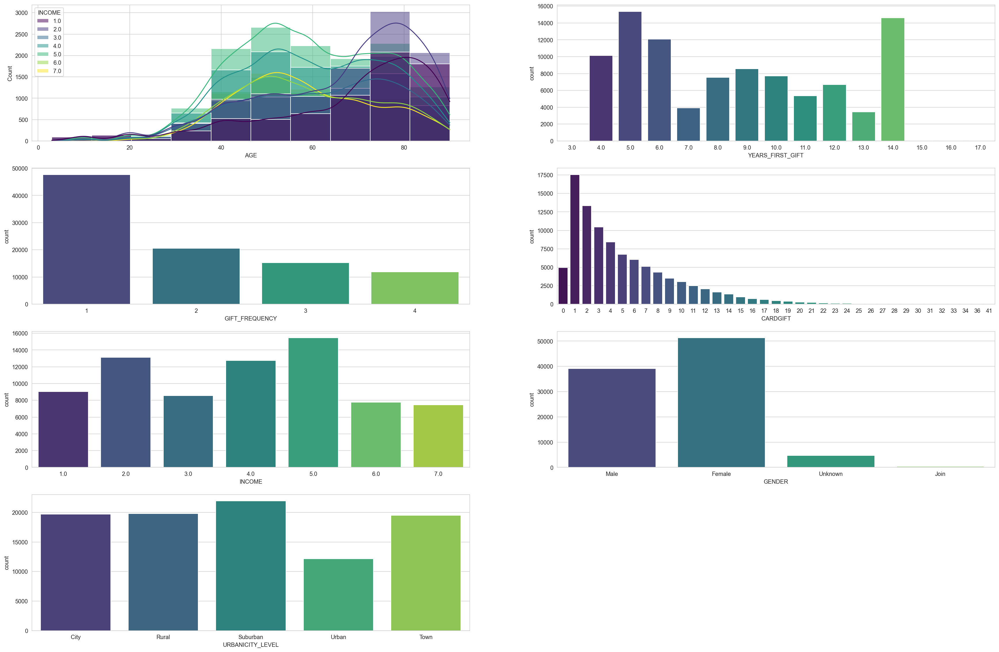

In [23]:
#Create a grid to visualize Age, Years_first_gift, Gift_frecuency, Cardgift, Income, Gender and Urbanicity level
f = plt.figure(figsize = (30,20))
gs = f.add_gridspec(4, 2)

with sns.axes_style("whitegrid"):
    
    ax = f.add_subplot(gs[0, 0])
    sns.histplot(x = 'AGE', data = pva, bins = 10, ax = ax, kde = True, hue = 'INCOME', palette = 'viridis')

    ax = f.add_subplot(gs[0, 1])
    sns.countplot(x = 'YEARS_FIRST_GIFT', data = pva, ax = ax, palette = 'viridis')
    
    ax = f.add_subplot(gs[1, 0])
    sns.countplot(x = 'GIFT_FREQUENCY', data = pva, ax = ax, palette = 'viridis')

    ax = f.add_subplot(gs[1, 1])
    sns.countplot(x = 'CARDGIFT', data = pva, ax = ax, palette = 'viridis')
    
    ax = f.add_subplot(gs[2, 0])
    sns.countplot(x = 'INCOME', data = pva, ax = ax, palette = 'viridis')  
    
    ax = f.add_subplot(gs[2, 1])
    sns.countplot(x = 'GENDER', data = pva, ax = ax, palette = 'viridis') 
    
    ax = f.add_subplot(gs[3, 0])
    sns.countplot(x = 'URBANICITY_LEVEL', data = pva, ax = ax, palette = 'viridis') 


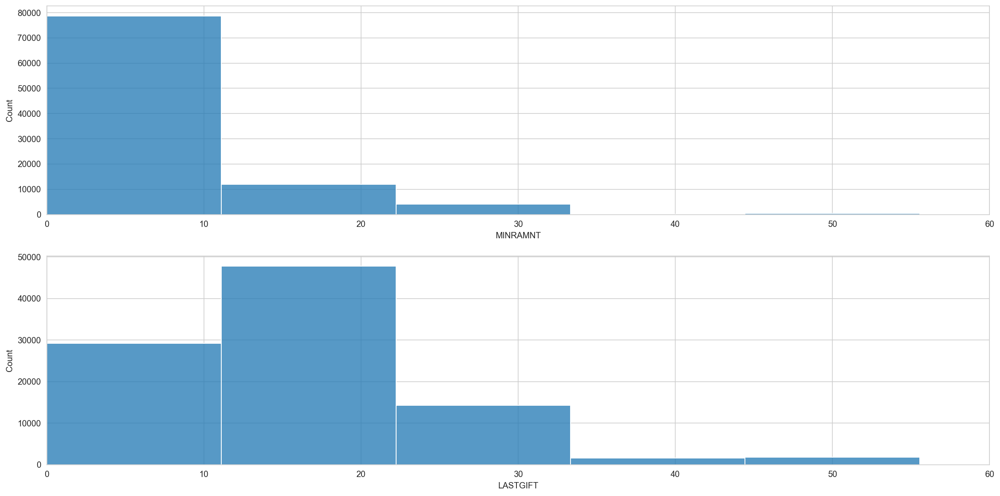

In [24]:
#create a grid to plot Minramnt and Lastgift
f = plt.figure(figsize = (20,10))
gs = f.add_gridspec(2, 1)

with sns.axes_style("whitegrid"):
    
    ax = f.add_subplot(gs[0, 0])
    sns.histplot(x = 'MINRAMNT', bins = 90, data = pva, ax = ax, palette = 'viridis')
    plt.xlim([0, 60])
        
    ax = f.add_subplot(gs[1, 0])
    sns.histplot(x = 'LASTGIFT', bins = 90, data = pva, ax = ax, palette = 'viridis') 
    plt.xlim([0, 60])

(0.0, 10.0)

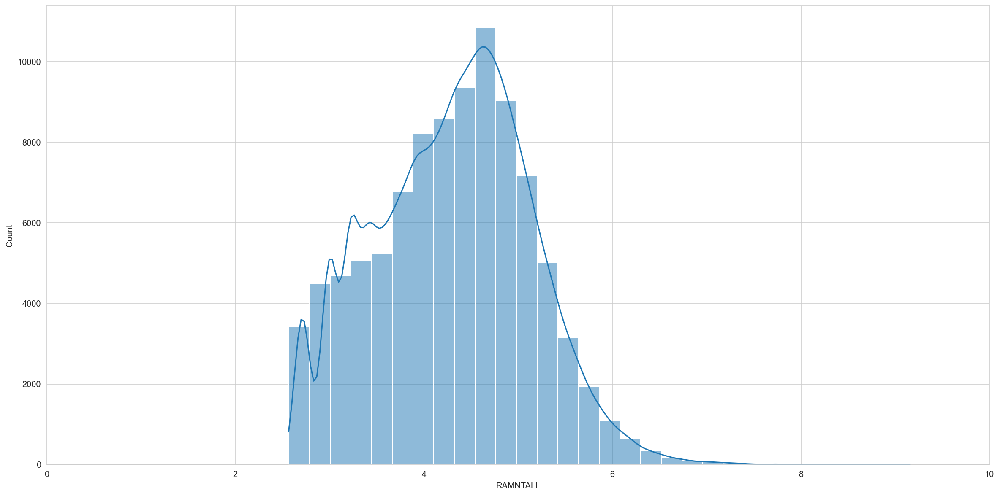

In [25]:
#visualize log_ramntall
a4_dims = (20, 10)
fig, ax = pyplot.subplots(figsize = a4_dims)

sns.histplot(x = np.log(pva['RAMNTALL']), bins = 30,  ax = ax, palette = 'viridis', kde=True) ## data = pva,
plt.xlim([0, 10])

(0.0, 10.0)

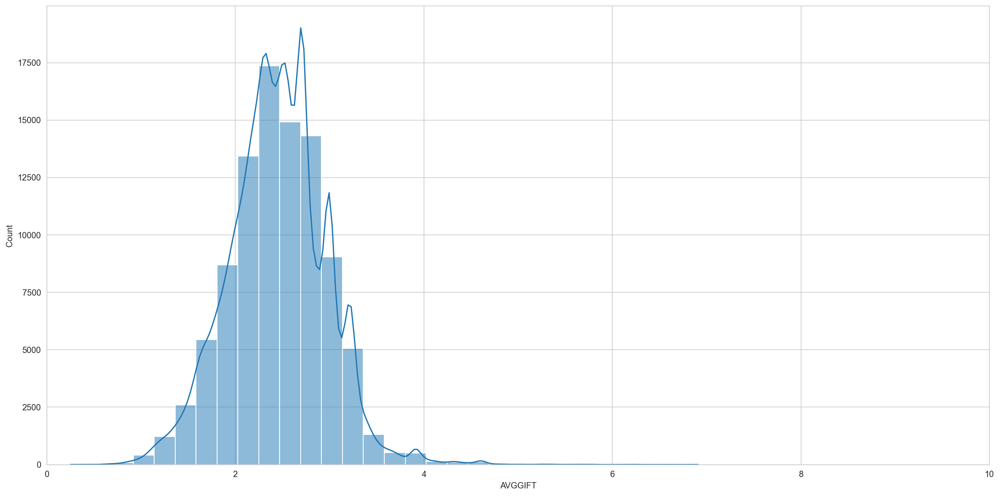

In [26]:
#visualize Log_avggift
a4_dims = (20, 10)
fig, ax = pyplot.subplots(figsize = a4_dims)

sns.histplot(x = np.log(pva['AVGGIFT']), bins = 30,  ax = ax, palette = 'viridis', kde=True) ## data = pva,
plt.xlim([0, 10])

(0.0, 10.0)

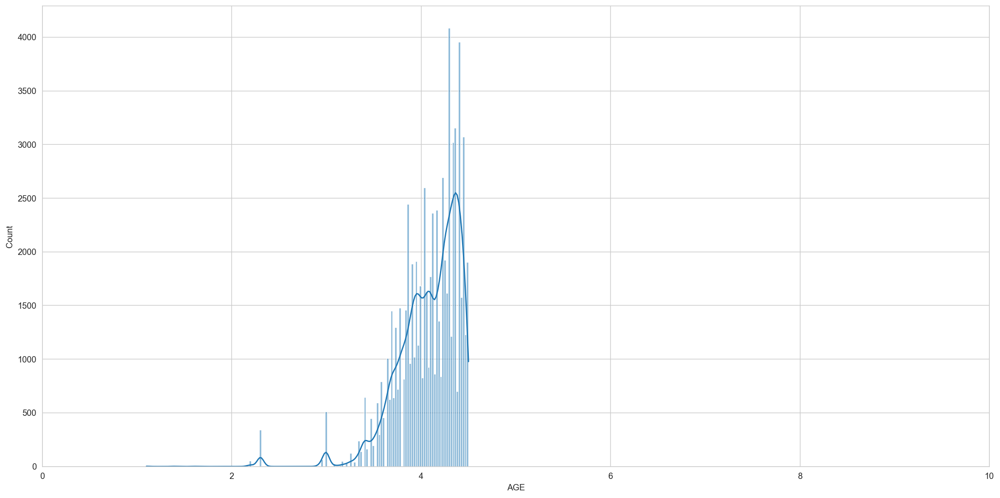

In [27]:
#visualize Log_age
a4_dims = (20, 10)
fig, ax = pyplot.subplots(figsize = a4_dims)

sns.histplot(x = np.log(pva['AGE']),  ax = ax, palette = 'viridis', kde=True) ## data = pva,
plt.xlim([0, 10])

(0.0, 50.0)

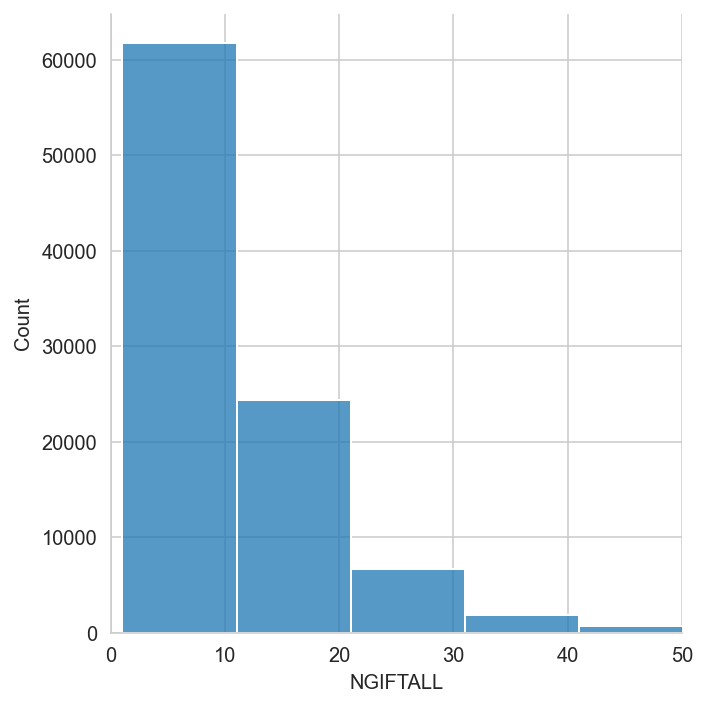

In [28]:
#visualize Nigiftall
sns.displot(x = 'NGIFTALL', data = pva, binwidth= 10, palette='viridis')
plt.xlim([0, 50])

(0.0, 40.0)

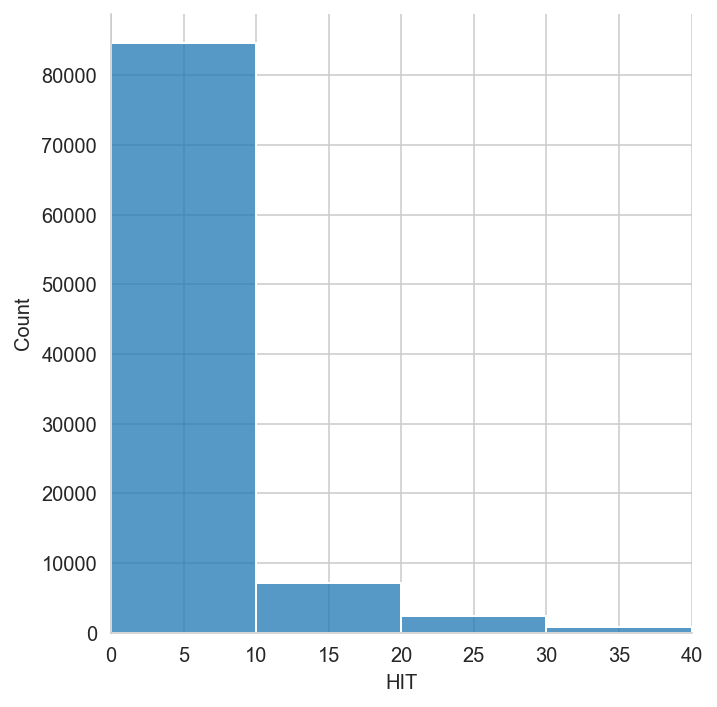

In [29]:
#visualize Hit
sns.displot(x = 'HIT', data = pva, palette = 'viridis', binwidth= 10)
plt.xlim([0, 40])

<AxesSubplot:xlabel='STATE', ylabel='count'>

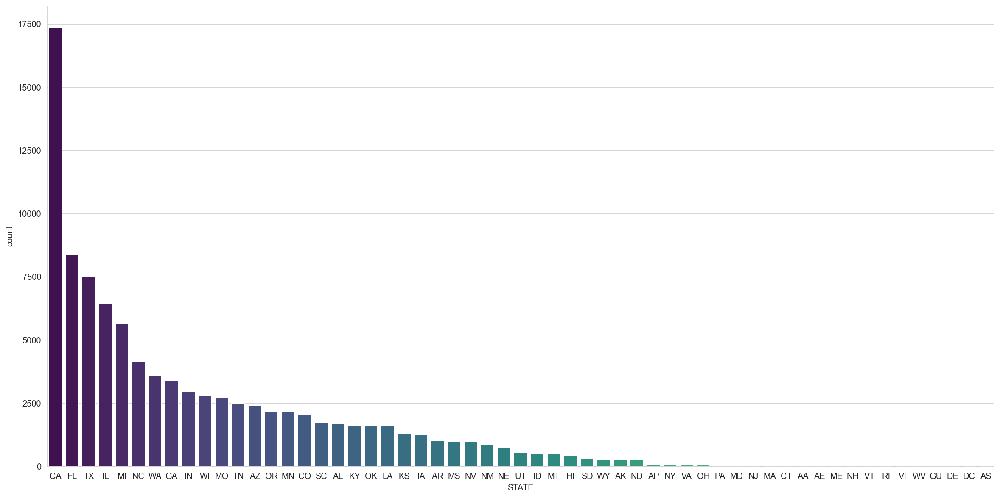

In [30]:
#visualice donnor by state ordered in descending manner
a4_dims = (20, 10)
fig, ax = pyplot.subplots(figsize = a4_dims)
sns.countplot(x = 'STATE', data = pva, ax = ax, palette = 'viridis', 
                 order = pva['STATE'].value_counts().index)

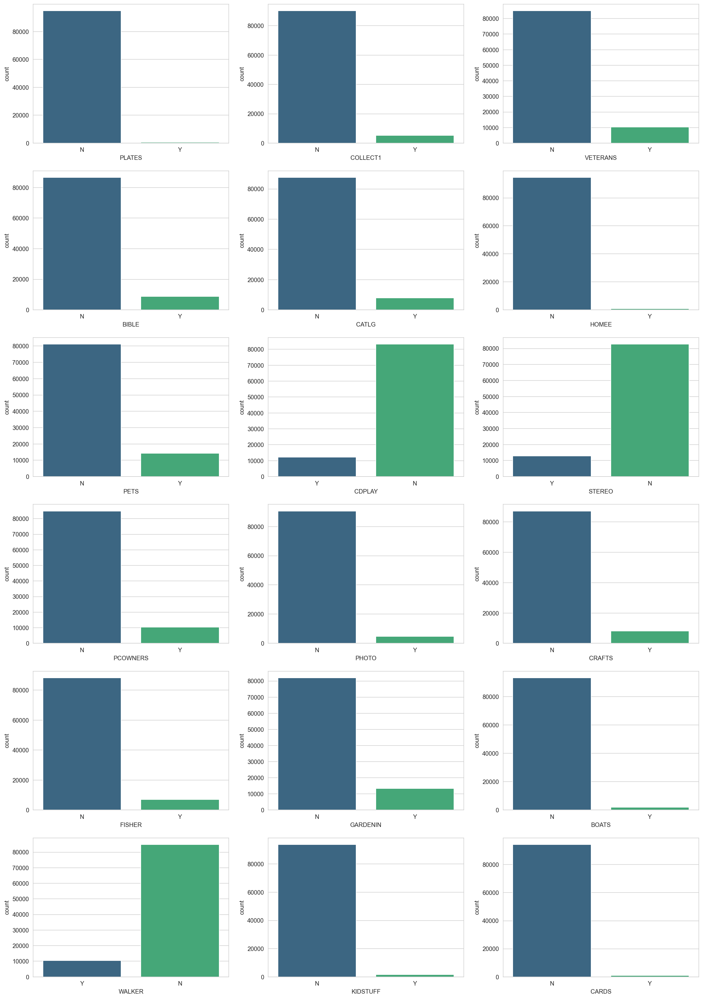

In [31]:
#visualize nterests
f = plt.figure(figsize = (20,30))
gs = f.add_gridspec(6, 3)

with sns.axes_style("whitegrid"):
    
    ax = f.add_subplot(gs[0, 0])
    sns.countplot(x = 'PLATES', data = pva, ax = ax, palette = 'viridis')
    
    ax = f.add_subplot(gs[0, 1])
    sns.countplot(x = 'COLLECT1', data = pva, ax = ax, palette = 'viridis')
    
    ax = f.add_subplot(gs[0, 2])
    sns.countplot(x = 'VETERANS', data = pva, ax = ax, palette = 'viridis')
    
    ax = f.add_subplot(gs[1, 0])
    sns.countplot(x = 'BIBLE', data = pva, ax = ax, palette = 'viridis')
    
    ax = f.add_subplot(gs[1, 1])
    sns.countplot(x = 'CATLG', data = pva, ax = ax, palette = 'viridis')
    
    ax = f.add_subplot(gs[1, 2])
    sns.countplot(x = 'HOMEE', data = pva, ax = ax, palette = 'viridis')
    
    ax = f.add_subplot(gs[2, 0])
    sns.countplot(x = 'PETS', data = pva, ax = ax, palette = 'viridis')
    
    ax = f.add_subplot(gs[2, 1])
    sns.countplot(x = 'CDPLAY', data = pva, ax = ax, palette = 'viridis')
    
    ax = f.add_subplot(gs[2, 2])
    sns.countplot(x = 'STEREO', data = pva, ax = ax, palette = 'viridis')
    
    ax = f.add_subplot(gs[3, 0])
    sns.countplot(x = 'PCOWNERS', data = pva, ax = ax, palette = 'viridis')
    
    ax = f.add_subplot(gs[3, 1])
    sns.countplot(x = 'PHOTO', data = pva, ax = ax, palette = 'viridis')
    
    ax = f.add_subplot(gs[3, 2])
    sns.countplot(x = 'CRAFTS', data = pva, ax = ax, palette = 'viridis')
    
    ax = f.add_subplot(gs[4, 0])
    sns.countplot(x = 'FISHER', data = pva, ax = ax, palette = 'viridis')
    
    ax = f.add_subplot(gs[4, 1])
    sns.countplot(x = 'GARDENIN', data = pva, ax = ax, palette = 'viridis')
    
    ax = f.add_subplot(gs[4, 2])
    sns.countplot(x = 'BOATS', data = pva, ax = ax, palette = 'viridis')
    
    ax = f.add_subplot(gs[5, 0])
    sns.countplot(x = 'WALKER', data = pva, ax = ax, palette = 'viridis')
    
    ax = f.add_subplot(gs[5, 1])
    sns.countplot(x = 'KIDSTUFF', data = pva, ax = ax, palette = 'viridis')
    
    ax = f.add_subplot(gs[5, 2])
    sns.countplot(x = 'CARDS', data = pva, ax = ax, palette = 'viridis')
    
    

# Filling Missing Values

In [32]:
# Use KNNImputer to fill missing values on numeric features
imputer = KNNImputer(n_neighbors=5, weights = 'uniform')
pva_metric[['LOG_AGE', 'INCOME']] = imputer.fit_transform(pva_metric[['LOG_AGE', 'INCOME']])

<ipython-input-32-9ecdfb240aca>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pva_metric[['LOG_AGE', 'INCOME']] = imputer.fit_transform(pva_metric[['LOG_AGE', 'INCOME']])
C:\Users\Natalia\anaconda3\lib\site-packages\pandas\core\indexing.py:1736: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value[:, i].tolist())


In [33]:
#create a list with categorical features with missing values
mode_as_missing_value = ['URBANICITY_LEVEL']

In [34]:
#fill missing values in non metric features with mode
for missing_feature in mode_as_missing_value:
    pva_non_metric[missing_feature].fillna(pva_non_metric[missing_feature].mode()[0], inplace = True)

C:\Users\Natalia\anaconda3\lib\site-packages\pandas\core\series.py:4517: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().fillna(


In [35]:
#fill nan values of Timelag with 0
pva_metric['TIMELAG'].fillna(0, inplace=True)

In [36]:
#check is missing values of categorical features were correctly filled
pva_non_metric.isna().any()

STATE               False
GENDER              False
URBANICITY_LEVEL    False
COLLECT1            False
VETERANS            False
BIBLE               False
CATLG               False
HOMEE               False
PETS                False
CDPLAY              False
STEREO              False
PCOWNERS            False
PHOTO               False
CRAFTS              False
FISHER              False
GARDENIN            False
BOATS               False
WALKER              False
KIDSTUFF            False
CARDS               False
PLATES              False
dtype: bool

In [37]:
#check is missing values of metric features were correctly filled
pva_metric.isna().any()

INCOME              False
LASTGIFT            False
MINRAMNT            False
LOG_RAMNTALL        False
LOG_AGE             False
LOG_AVGGIFT         False
YEARS_FIRST_GIFT    False
NGIFTALL            False
GIFT_FREQUENCY      False
TIMELAG             False
HIT                 False
CARDGIFT            False
dtype: bool

# Outlier Removal

In [39]:
#create an IQR with the 10th and 90th quantiles
q10 = pva_metric.quantile(.10)
q90 = pva_metric.quantile(.90)
iqr = (q90 - q10)

upper_lim = q90 + 1.5*iqr
lower_lim = q10 - 1.5*iqr

In [40]:
#create a filter with the observations out of the IQR
filters = []
for metric in pva_metric_list:
    llim = lower_lim[metric]
    ulim = upper_lim[metric]
    filters.append(pva_metric[metric].between(llim, ulim, inclusive=True))

filters = pd.Series(np.all(filters, 0), index = pva_metric.index.tolist())   

#print the percentage of data kept after applying the filter created above
print('Percentage of data kept after removing outliers:', np.round(pva_metric[filters].shape[0]/pva_metric.shape[0], 2))

#replace the metric data base for the filtered one
pva_metric = pva_metric[filters]

Percentage of data kept after removing outliers: 0.96


In [41]:
#replace the categorical data base for the filtered one
pva_non_metric = pva_non_metric[filters]

# Data Normalization

In [42]:
#create a copy of data base with missing values filled and outlier removed
pva_standard = pva_metric.copy()

In [43]:
#scaling data using standarscaler to get a mean of 0 and variance of 1
scaler = StandardScaler()
scaled_feat = scaler.fit_transform(pva_standard)

In [44]:
#create a data base with standarized metric features
pva_standard[pva_metric_list] = scaled_feat

In [45]:
pva_standard

,INCOME,LASTGIFT,MINRAMNT,LOG_RAMNTALL,LOG_AGE,LOG_AVGGIFT,YEARS_FIRST_GIFT,NGIFTALL,GIFT_FREQUENCY,TIMELAG,HIT,CARDGIFT
CONTROLN,,,,,,,,,,,,
1,0.069260,1.676161,0.386501,1.651315,1.328217,1.433649,0.421636,0.321841,1.013709,-0.674237,3.275810,0.227561
2,1.881316,-0.787055,-0.422930,0.964538,0.802444,-0.306995,0.421636,0.821045,-0.851019,-0.510904,-0.122272,-0.453325
4,0.673279,0.075071,-0.422930,1.319689,-1.346368,0.561600,0.421636,0.571443,-0.851019,-0.674237,1.876600,0.000599
5,-1.138777,-0.171251,-0.422930,1.755916,1.545067,-0.607704,0.713903,3.192265,-0.851019,-1.164236,-0.522046,0.454523
8,0.000552,-0.171251,-0.746702,0.063883,-0.055427,-0.835887,0.713903,0.072239,-0.851019,-1.164236,-0.522046,0.227561
...,...,...,...,...,...,...,...,...,...,...,...,...
191760,0.673279,-0.787055,-0.422930,1.181613,1.459809,0.484768,1.006170,0.446642,1.013709,2.755758,-0.522046,0.000599
191762,0.673279,-0.171251,-0.422930,1.106354,0.310467,0.705073,0.129369,0.197040,0.081345,0.959094,-0.522046,0.227561
191775,1.277297,1.060357,-0.422930,2.243841,1.145346,0.986861,1.590704,1.819454,-0.851019,-0.020904,-0.522046,1.362371


# Correlation Matrix

locator: <matplotlib.colorbar._ColorbarAutoLocator object at 0x00000221C4C97A60>
Using auto colorbar locator <matplotlib.colorbar._ColorbarAutoLocator object at 0x00000221C4C97A60> on colorbar
Setting pcolormesh
top of axes not in the figure, so title not moved
top of axes not in the figure, so title not moved
findfont: Matching sans\-serif:style=normal:variant=normal:weight=normal:stretch=normal:size=20.0.
findfont: score(<Font 'DejaVu Sans Display' (DejaVuSansDisplay.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'DejaVu Serif' (DejaVuSerif.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'cmtt10' (cmtt10.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'DejaVu Sans' (DejaVuSans-Bold.ttf) normal normal 700 normal>) = 2.335
findfont: score(<Font 'STIXSizeOneSym' (STIXSizOneSymBol.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'DejaVu Serif' (DejaVuSerif-Italic.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'DejaVu

findfont: score(<Font 'Eras Demi ITC' (ERASDEMI.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Segoe UI' (segoeuisl.ttf) normal normal 350 normal>) = 10.0975
findfont: score(<Font 'Perpetua' (PER_____.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Poor Richard' (POORICH.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Microsoft YaHei' (msyhl.ttc) normal normal 290 normal>) = 10.1545
findfont: score(<Font 'Gadugi' (gadugib.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Lucida Sans Typewriter' (LTYPEBO.TTF) oblique normal 600 normal>) = 11.24
findfont: score(<Font 'Bauhaus 93' (BAUHS93.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font '72' (72-Italic.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Comic Sans MS' (comicbd.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Georgia' (georgiab.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Eras Light ITC' (ERASLGHT.TTF) nor

findfont: score(<Font 'Engravers MT' (ENGR.TTF) normal normal 500 normal>) = 10.145
findfont: score(<Font 'Tempus Sans ITC' (TEMPSITC.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Bell MT' (BELLI.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Bodoni MT' (BOD_BLAR.TTF) normal normal 900 normal>) = 10.525
findfont: score(<Font 'Bodoni MT' (BOD_BLAI.TTF) italic normal 900 normal>) = 11.525
findfont: score(<Font 'Bodoni MT' (BOD_B.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Garamond' (GARABD.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Gill Sans MT Condensed' (GILC____.TTF) normal normal 400 condensed>) = 10.25
findfont: score(<Font 'Castellar' (CASTELAR.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Calibri' (calibrii.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Segoe UI' (segoeuib.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Trebuchet MS' (trebucbd.ttf) normal norm

findfont: score(<Font 'Lucida Sans' (LSANSDI.TTF) italic normal 600 normal>) = 11.24
findfont: score(<Font 'Book Antiqua' (ANTQUABI.TTF) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Lucida Sans Unicode' (l_10646.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Verdana' (verdanai.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Eras Medium ITC' (ERASMD.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Leelawadee UI' (LeelUIsl.ttf) normal normal 350 normal>) = 10.0975
findfont: score(<Font 'Perpetua' (PERB____.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'SimSun' (simsun.ttc) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Gill Sans MT Condensed' (GILC____.TTF) normal normal 400 condensed>) = 10.25
findfont: score(<Font 'Verdana' (verdana.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Perpetua' (PERB____.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font '72' (72-BoldItalic.ttf)

findfont: score(<Font 'Bodoni MT' (BOD_BI.TTF) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Cambria' (cambriab.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Elephant' (ELEPHNTI.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Arial' (ariali.ttf) italic normal 400 normal>) = 1.05
findfont: score(<Font 'MS Outlook' (OUTLOOK.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Candara' (Candarai.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Palatino Linotype' (palai.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Papyrus' (PAPYRUS.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Lucida Bright' (LBRITED.TTF) normal normal 600 normal>) = 10.24
findfont: score(<Font 'Vladimir Script' (VLADIMIR.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Dubai' (DUBAI-BOLD.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Constantia' (constan.ttf) normal normal 400 normal>) = 

findfont: score(<Font 'Corbel' (corbel.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'High Tower Text' (HTOWERTI.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Century Gothic' (GOTHICB.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Malgun Gothic' (malgunbd.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Berlin Sans FB' (BRLNSB.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Gill Sans MT' (GILBI___.TTF) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Lucida Fax' (LFAXD.TTF) normal normal 600 normal>) = 10.24
findfont: score(<Font 'Harlow Solid Italic' (HARLOWSI.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Microsoft YaHei' (msyh.ttc) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Constantia' (constani.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Microsoft Tai Le' (taile.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font '72' (72-Condensed.t

findfont: score(<Font 'Calibri' (calibrib.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Perpetua' (PERBI___.TTF) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Perpetua' (PERBI___.TTF) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Elephant' (ELEPHNT.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Rockwell' (ROCKB.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'MingLiU-ExtB' (mingliub.ttc) normal normal 400 normal>) = 10.05
findfont: score(<Font 'MV Boli' (mvboli.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Book Antiqua' (ANTQUAI.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Microsoft YaHei' (msyh.ttc) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Pristina' (PRISTINA.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Impact' (impact.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font '72' (72-CondensedBold.ttf) normal normal 700 condensed>) = 10.

findfont: score(<Font 'Times New Roman' (timesbd.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'MS Reference Specialty' (REFSPCL.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Gill Sans MT' (GILI____.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Segoe UI' (seguibli.ttf) italic normal 900 normal>) = 11.525
findfont: score(<Font 'Corbel' (corbeli.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Trebuchet MS' (trebuc.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Lucida Bright' (LBRITE.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Gill Sans MT' (GIL_____.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Nirmala UI' (NirmalaB.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Centaur' (CENTAUR.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Courier New' (cour.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Bodoni MT' (BOD_I.TTF) italic nor

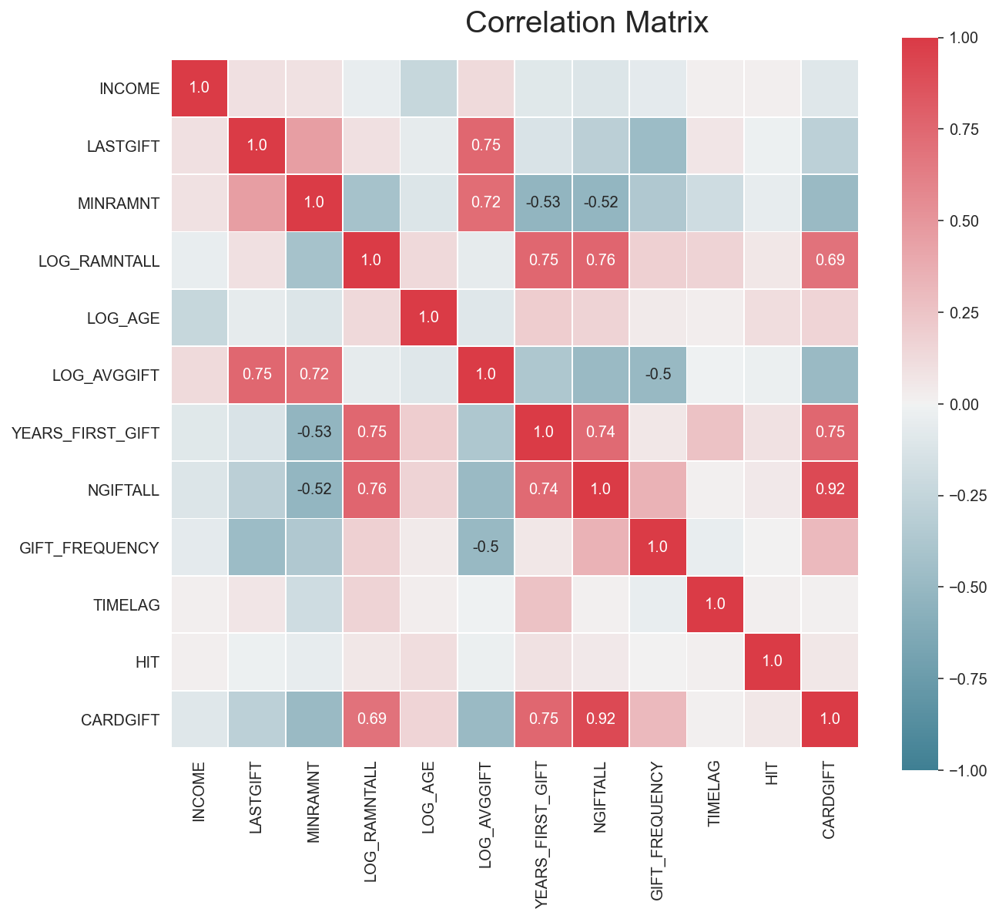

In [48]:
fig = plt.figure(figsize=(10, 8))

#obtain correlation matrix. Round the values to 2 decimal cases.
corr_matrix = np.round(pva_metric[pva_metric_list].corr(method='pearson'), decimals=2)

#build annotation matrix (values above |0.5| will appear annotated in the plot)
mask_annot = np.absolute(corr_matrix.values) >= 0.5
annot = np.where(mask_annot, corr_matrix.values, np.full(corr_matrix.shape,''))

#plot heatmap of the correlation matrix
sns.heatmap(data=corr_matrix, annot=annot, cmap=sns.diverging_palette(220, 10, as_cmap=True), 
            fmt='s', vmin=-1, vmax=1, center=0, square=True, linewidths=.5)

fig.subplots_adjust(top=0.95)
fig.suptitle("Correlation Matrix", fontsize=20)

plt.show()

# Assessing Clustering Tendency

## Visual Assesment Tendency

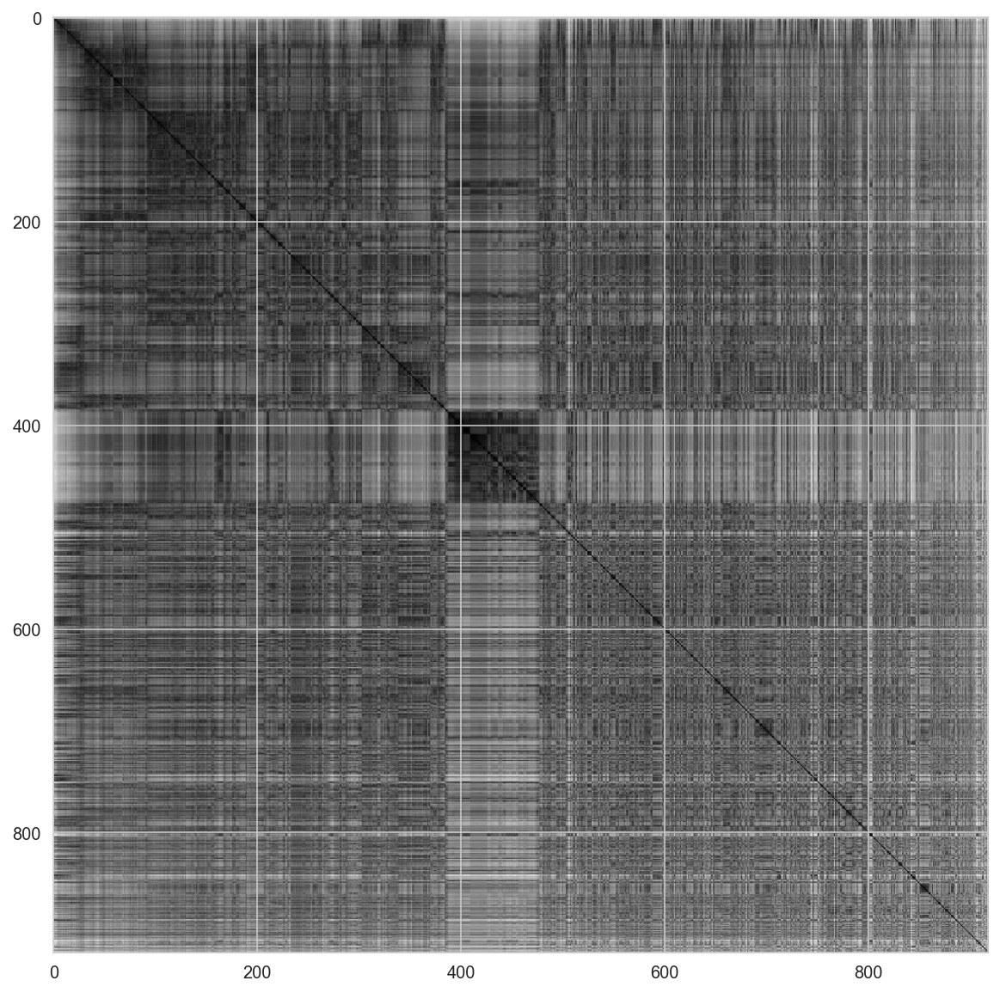

In [49]:
#apply vat algorithm to dataset 
vat(pva_standard.sample(frac = 0.01))

## Hopkins statistic

In [50]:
#apply Hopkins Statistic to data set
hopkins(pva_standard, len(pva_standard))

0.12120083208432345

# One Hot Encoding

In [51]:
#create a copy to encode categorial features
pva_non_metric_ohc = pva_non_metric.copy()

In [52]:
#apply the method OneHotEncoding
ohc = OneHotEncoder(sparse=False, drop= 'if_binary')
ohc_feat = ohc.fit_transform(pva_non_metric_ohc)
ohc_feat_names = ohc.get_feature_names(pva_non_metric_list)
ohc_pva = pd.DataFrame(ohc_feat, index = pva_non_metric_ohc.index, columns = ohc_feat_names)  
ohc_pva

,STATE_AA,STATE_AE,STATE_AK,STATE_AL,STATE_AP,STATE_AR,STATE_AS,STATE_AZ,STATE_CA,STATE_CO,...,PCOWNERS_Y,PHOTO_Y,CRAFTS_Y,FISHER_Y,GARDENIN_Y,BOATS_Y,WALKER_Y,KIDSTUFF_Y,CARDS_Y,PLATES_Y
CONTROLN,,,,,,,,,,,,,,,,,,,,,
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
191760,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
191762,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
191775,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


# Dimensionality Reduction

In [54]:
#create a copy to do PCA
pva_pca = pva_standard.copy()

In [55]:
#apply PCA to all metric features 
pca = PCA(n_components = pva_pca.shape[1], whiten = True)
pca_reduced = pca.fit_transform(pva_pca)

In [56]:
#The following table show the cumulative variance explained by the PC
pd.DataFrame(
    {"Eigenvalue": pca.explained_variance_,
     "Difference": np.insert(np.diff(pca.explained_variance_), 0, 0),
     "Proportion": pca.explained_variance_ratio_,
     "Cumulative": np.cumsum(pca.explained_variance_ratio_)},
    index=range(1, pca.n_components_ + 1)
)

,Eigenvalue,Difference,Proportion,Cumulative
1,4.401952,0.000000,0.366825,0.366825
2,1.922438,-2.479514,0.160201,0.527027
3,1.190286,-0.732152,0.099189,0.626216
4,1.079135,-0.111151,0.089927,0.716143
5,0.999403,-0.079732,0.083283,0.799426
6,0.727296,-0.272107,0.060607,0.860033
7,0.686793,-0.040503,0.057232,0.917265
8,0.441272,-0.245522,0.036772,0.954038
9,0.237855,-0.203416,0.019821,0.973859
10,0.182175,-0.055680,0.015181,0.989040


In [57]:
#check the number of components have a acumulated variance bigger that 90%
np.argmax(np.cumsum(pca.explained_variance_ratio_) >= 0.9)

6

findfont: Matching sans\-serif:style=normal:variant=normal:weight=normal:stretch=normal:size=14.0.
findfont: score(<Font 'DejaVu Sans Display' (DejaVuSansDisplay.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'DejaVu Serif' (DejaVuSerif.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'cmtt10' (cmtt10.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'DejaVu Sans' (DejaVuSans-Bold.ttf) normal normal 700 normal>) = 2.335
findfont: score(<Font 'STIXSizeOneSym' (STIXSizOneSymBol.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'DejaVu Serif' (DejaVuSerif-Italic.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'DejaVu Sans' (DejaVuSans-Oblique.ttf) oblique normal 400 normal>) = 3.05
findfont: score(<Font 'STIXNonUnicode' (STIXNonUniBolIta.ttf) italic normal 700 normal>) = 11.335
findfont: score(<Font 'STIXGeneral' (STIXGeneral.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'STIXSizeThreeSym' (STIXSizThreeSymB

findfont: score(<Font 'Microsoft YaHei' (msyhl.ttc) normal normal 290 normal>) = 10.1545
findfont: score(<Font 'Gadugi' (gadugib.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Lucida Sans Typewriter' (LTYPEBO.TTF) oblique normal 600 normal>) = 11.24
findfont: score(<Font 'Bauhaus 93' (BAUHS93.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font '72' (72-Italic.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Comic Sans MS' (comicbd.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Georgia' (georgiab.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Eras Light ITC' (ERASLGHT.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Constantia' (constanz.ttf) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Curlz MT' (CURLZ___.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Courier New' (courbd.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Bookman Old Style' (BOOKOSBI.TTF) 

findfont: score(<Font 'Bodoni MT' (BOD_BLAI.TTF) italic normal 900 normal>) = 11.525
findfont: score(<Font 'Bodoni MT' (BOD_B.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Garamond' (GARABD.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Gill Sans MT Condensed' (GILC____.TTF) normal normal 400 condensed>) = 10.25
findfont: score(<Font 'Castellar' (CASTELAR.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Calibri' (calibrii.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Segoe UI' (segoeuib.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Trebuchet MS' (trebucbd.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Bodoni MT' (BOD_BI.TTF) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Yu Gothic' (YuGothM.ttc) normal normal 500 normal>) = 10.145
findfont: score(<Font 'Imprint MT Shadow' (IMPRISHA.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Algerian' (ALGER.TTF) normal no

findfont: score(<Font 'Eras Medium ITC' (ERASMD.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Leelawadee UI' (LeelUIsl.ttf) normal normal 350 normal>) = 10.0975
findfont: score(<Font 'Perpetua' (PERB____.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'SimSun' (simsun.ttc) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Gill Sans MT Condensed' (GILC____.TTF) normal normal 400 condensed>) = 10.25
findfont: score(<Font 'Verdana' (verdana.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Perpetua' (PERB____.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font '72' (72-BoldItalic.ttf) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Perpetua Titling MT' (PERTIBD.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Curlz MT' (CURLZ___.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Microsoft Tai Le' (taileb.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Verdana' (verdanab.tt

findfont: score(<Font 'MS Outlook' (OUTLOOK.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Candara' (Candarai.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Palatino Linotype' (palai.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Papyrus' (PAPYRUS.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Lucida Bright' (LBRITED.TTF) normal normal 600 normal>) = 10.24
findfont: score(<Font 'Vladimir Script' (VLADIMIR.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Dubai' (DUBAI-BOLD.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Constantia' (constan.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Calibri' (calibrib.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Arial' (ARIALNI.TTF) italic normal 400 condensed>) = 1.25
findfont: score(<Font 'Book Antiqua' (ANTQUAI.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Webdings' (webdings.ttf) normal normal 400 norm

findfont: score(<Font 'Berlin Sans FB' (BRLNSB.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Gill Sans MT' (GILBI___.TTF) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Lucida Fax' (LFAXD.TTF) normal normal 600 normal>) = 10.24
findfont: score(<Font 'Harlow Solid Italic' (HARLOWSI.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Microsoft YaHei' (msyh.ttc) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Constantia' (constani.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Microsoft Tai Le' (taile.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font '72' (72-Condensed.ttf) normal normal 400 condensed>) = 10.25
findfont: score(<Font 'Franklin Gothic Book' (FRABKIT.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Franklin Gothic Demi' (FRADM.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Calisto MT' (CALISTB.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Playbill' (

findfont: score(<Font 'Rockwell' (ROCKB.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'MingLiU-ExtB' (mingliub.ttc) normal normal 400 normal>) = 10.05
findfont: score(<Font 'MV Boli' (mvboli.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Book Antiqua' (ANTQUAI.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Microsoft YaHei' (msyh.ttc) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Pristina' (PRISTINA.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Impact' (impact.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font '72' (72-CondensedBold.ttf) normal normal 700 condensed>) = 10.535
findfont: score(<Font 'Eras Bold ITC' (ERASBD.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Calisto MT' (CALIST.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Eras Demi ITC' (ERASDEMI.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Lucida Fax' (LFAXI.TTF) italic normal 400 normal>

findfont: score(<Font 'Corbel' (corbeli.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Trebuchet MS' (trebuc.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Lucida Bright' (LBRITE.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Gill Sans MT' (GIL_____.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Nirmala UI' (NirmalaB.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Centaur' (CENTAUR.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Courier New' (cour.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Bodoni MT' (BOD_I.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Lucida Handwriting' (LHANDW.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font '72' (72-Bold.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Arial' (ARIALNBI.TTF) italic normal 700 condensed>) = 1.535
findfont: score(<Font 'Candara' (Candarali.ttf) italic normal 400 normal>) = 11.0

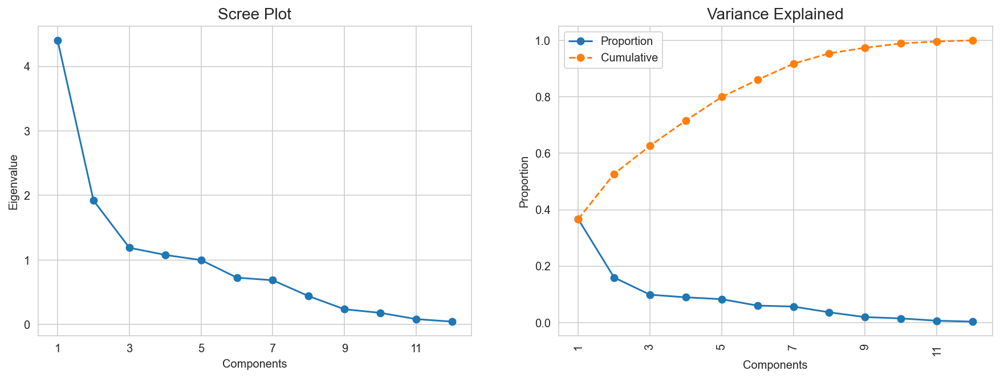

In [58]:

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

# draw plots
ax1.plot(pca.explained_variance_, marker=".", markersize=12)
ax2.plot(pca.explained_variance_ratio_, marker=".", markersize=12, label="Proportion")
ax2.plot(np.cumsum(pca.explained_variance_ratio_), marker=".", markersize=12, linestyle="--", label="Cumulative")

# customizations
ax2.legend()
ax1.set_title("Scree Plot", fontsize=14)
ax2.set_title("Variance Explained", fontsize=14)
ax1.set_ylabel("Eigenvalue")
ax2.set_ylabel("Proportion")
ax1.set_xlabel("Components")
ax2.set_xlabel("Components")
ax1.set_xticks(range(0, pca.n_components_, 2))
ax1.set_xticklabels(range(1, pca.n_components_ + 1, 2))
ax2.set_xticks(range(0, pca.n_components_, 2))
ax2.set_xticklabels(range(1, pca.n_components_ + 1, 2))
plt.xticks(rotation = 90)

plt.show()

In [59]:
#create a list with the PC that explain 90% of the variance
pca_feat_names = [f"PC{i}" for i in range(np.argmax(np.cumsum(pca.explained_variance_ratio_) >= 0.9))]

In [60]:
#create a dataframe with the PC that explain 90% of the variance
pca_90_pct = pd.DataFrame(pca_reduced[:,0:6], index= pva_pca.index, columns = pca_feat_names) 

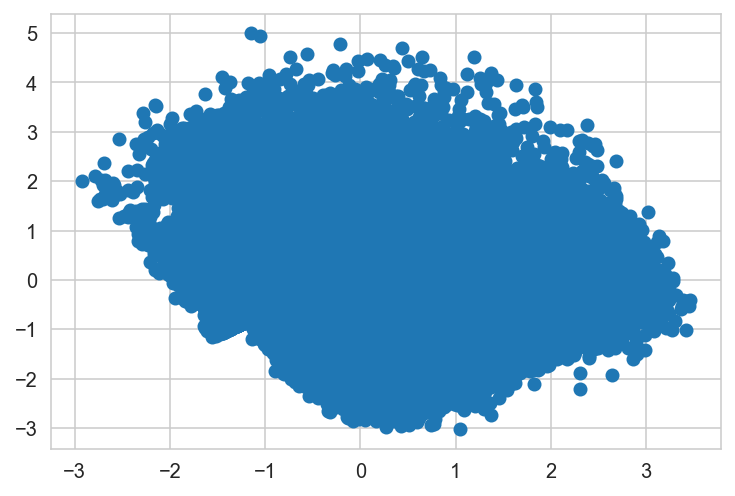

In [61]:
#plot data with the PC
plt.scatter(pca_90_pct['PC0'], pca_90_pct['PC1'])

# K-Means Clustering

## Define Number of Clusters

### Elbow Method

In [64]:
range_clusters = range(2,11)

In [65]:
#iterate over a desired ncluster range and save the inertia of the given cluster solution
inertia = []
for k in range_clusters: 
    kmclust = KMeans(n_clusters = k, init = 'k-means++', n_init = 15, random_state = 42)
    kmclust.fit(pva_standard)
    inertia.append(kmclust.inertia_)  

findfont: Matching sans\-serif:style=normal:variant=normal:weight=normal:stretch=normal:size=15.0.
findfont: score(<Font 'DejaVu Sans Display' (DejaVuSansDisplay.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'DejaVu Serif' (DejaVuSerif.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'cmtt10' (cmtt10.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'DejaVu Sans' (DejaVuSans-Bold.ttf) normal normal 700 normal>) = 2.335
findfont: score(<Font 'STIXSizeOneSym' (STIXSizOneSymBol.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'DejaVu Serif' (DejaVuSerif-Italic.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'DejaVu Sans' (DejaVuSans-Oblique.ttf) oblique normal 400 normal>) = 3.05
findfont: score(<Font 'STIXNonUnicode' (STIXNonUniBolIta.ttf) italic normal 700 normal>) = 11.335
findfont: score(<Font 'STIXGeneral' (STIXGeneral.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'STIXSizeThreeSym' (STIXSizThreeSymB

findfont: score(<Font 'Microsoft YaHei' (msyhl.ttc) normal normal 290 normal>) = 10.1545
findfont: score(<Font 'Gadugi' (gadugib.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Lucida Sans Typewriter' (LTYPEBO.TTF) oblique normal 600 normal>) = 11.24
findfont: score(<Font 'Bauhaus 93' (BAUHS93.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font '72' (72-Italic.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Comic Sans MS' (comicbd.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Georgia' (georgiab.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Eras Light ITC' (ERASLGHT.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Constantia' (constanz.ttf) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Curlz MT' (CURLZ___.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Courier New' (courbd.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Bookman Old Style' (BOOKOSBI.TTF) 

findfont: score(<Font 'Bodoni MT' (BOD_BLAI.TTF) italic normal 900 normal>) = 11.525
findfont: score(<Font 'Bodoni MT' (BOD_B.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Garamond' (GARABD.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Gill Sans MT Condensed' (GILC____.TTF) normal normal 400 condensed>) = 10.25
findfont: score(<Font 'Castellar' (CASTELAR.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Calibri' (calibrii.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Segoe UI' (segoeuib.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Trebuchet MS' (trebucbd.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Bodoni MT' (BOD_BI.TTF) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Yu Gothic' (YuGothM.ttc) normal normal 500 normal>) = 10.145
findfont: score(<Font 'Imprint MT Shadow' (IMPRISHA.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Algerian' (ALGER.TTF) normal no

findfont: score(<Font 'Eras Medium ITC' (ERASMD.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Leelawadee UI' (LeelUIsl.ttf) normal normal 350 normal>) = 10.0975
findfont: score(<Font 'Perpetua' (PERB____.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'SimSun' (simsun.ttc) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Gill Sans MT Condensed' (GILC____.TTF) normal normal 400 condensed>) = 10.25
findfont: score(<Font 'Verdana' (verdana.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Perpetua' (PERB____.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font '72' (72-BoldItalic.ttf) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Perpetua Titling MT' (PERTIBD.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Curlz MT' (CURLZ___.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Microsoft Tai Le' (taileb.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Verdana' (verdanab.tt

findfont: score(<Font 'MS Outlook' (OUTLOOK.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Candara' (Candarai.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Palatino Linotype' (palai.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Papyrus' (PAPYRUS.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Lucida Bright' (LBRITED.TTF) normal normal 600 normal>) = 10.24
findfont: score(<Font 'Vladimir Script' (VLADIMIR.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Dubai' (DUBAI-BOLD.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Constantia' (constan.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Calibri' (calibrib.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Arial' (ARIALNI.TTF) italic normal 400 condensed>) = 1.25
findfont: score(<Font 'Book Antiqua' (ANTQUAI.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Webdings' (webdings.ttf) normal normal 400 norm

findfont: score(<Font 'Berlin Sans FB' (BRLNSB.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Gill Sans MT' (GILBI___.TTF) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Lucida Fax' (LFAXD.TTF) normal normal 600 normal>) = 10.24
findfont: score(<Font 'Harlow Solid Italic' (HARLOWSI.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Microsoft YaHei' (msyh.ttc) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Constantia' (constani.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Microsoft Tai Le' (taile.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font '72' (72-Condensed.ttf) normal normal 400 condensed>) = 10.25
findfont: score(<Font 'Franklin Gothic Book' (FRABKIT.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Franklin Gothic Demi' (FRADM.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Calisto MT' (CALISTB.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Playbill' (

findfont: score(<Font 'Rockwell' (ROCKB.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'MingLiU-ExtB' (mingliub.ttc) normal normal 400 normal>) = 10.05
findfont: score(<Font 'MV Boli' (mvboli.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Book Antiqua' (ANTQUAI.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Microsoft YaHei' (msyh.ttc) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Pristina' (PRISTINA.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Impact' (impact.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font '72' (72-CondensedBold.ttf) normal normal 700 condensed>) = 10.535
findfont: score(<Font 'Eras Bold ITC' (ERASBD.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Calisto MT' (CALIST.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Eras Demi ITC' (ERASDEMI.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Lucida Fax' (LFAXI.TTF) italic normal 400 normal>

findfont: score(<Font 'Corbel' (corbeli.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Trebuchet MS' (trebuc.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Lucida Bright' (LBRITE.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Gill Sans MT' (GIL_____.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Nirmala UI' (NirmalaB.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Centaur' (CENTAUR.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Courier New' (cour.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Bodoni MT' (BOD_I.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Lucida Handwriting' (LHANDW.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font '72' (72-Bold.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Arial' (ARIALNBI.TTF) italic normal 700 condensed>) = 1.535
findfont: score(<Font 'Candara' (Candarali.ttf) italic normal 400 normal>) = 11.0

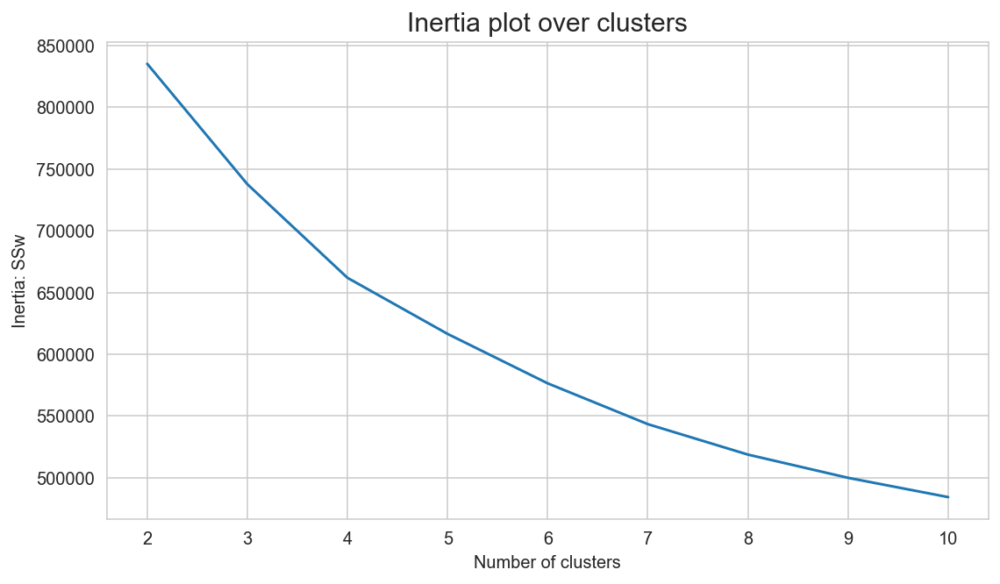

In [66]:
#plot inertia vs number of clusters
plt.figure(figsize=(9,5))
plt.plot(range_clusters , inertia) # range_clusters ,
plt.ylabel("Inertia: SSw")
plt.xlabel("Number of clusters")
plt.title("Inertia plot over clusters", size=15)
plt.show()

### Calinski-Harabasz Index

In [67]:
Calinski_Harabasz = []
for k in range_clusters:
    kmeans_model = KMeans(n_clusters = k, init = 'k-means++', n_init = 15,random_state = 42).fit(pva_standard)
    labels = kmeans_model.labels_
    labels = kmeans_model.labels_ 
    Calinski_Harabasz.append(metrics.calinski_harabasz_score(pva_standard, labels))

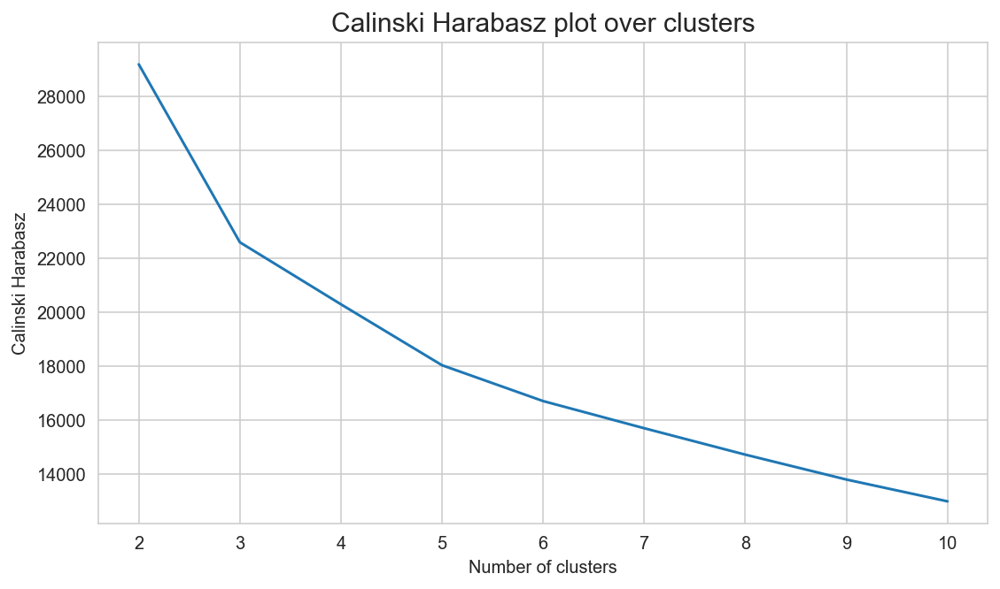

In [68]:
# The Calinski_Harabasz plot
plt.figure(figsize=(9,5))
plt.plot(range_clusters , Calinski_Harabasz) 
plt.ylabel("Calinski Harabasz")
plt.xlabel("Number of clusters")
plt.title("Calinski Harabasz plot over clusters", size=15)
plt.show()

## K-Means Clustering Solution

In [69]:
km_clust = KMeans(n_clusters = 4, init = 'k-means++', n_init = 15, random_state = 42)
km_labels = km_clust.fit_predict(pva_standard)

## Characterizing K-Means

### Metric Features

In [70]:
pva_standard_km_labeled = pd.concat((pva_standard, pd.Series(km_labels, name='labels', index=pva_standard.index.tolist())), axis=1)
km_standard = pva_standard_km_labeled.groupby('labels').mean()
km_standard['label'] = km_standard.index
km_standard

,INCOME,LASTGIFT,MINRAMNT,LOG_RAMNTALL,LOG_AGE,LOG_AVGGIFT,YEARS_FIRST_GIFT,NGIFTALL,GIFT_FREQUENCY,TIMELAG,HIT,CARDGIFT,label
labels,,,,,,,,,,,,,
0,0.123501,0.538566,-0.164005,0.171383,-0.034514,0.360128,0.111267,-0.300362,-0.534021,0.513492,0.030904,-0.320385,0
1,0.143334,0.548936,1.644927,-1.136015,-0.254418,1.050828,-1.134136,-0.953697,-0.666889,-0.636586,-0.129964,-0.889586,1
2,-0.055077,-0.787752,-0.469566,-0.356206,-0.123276,-0.711681,-0.564769,-0.225530,1.167787,-0.239105,-0.076710,-0.274336,2
3,-0.242224,-0.550353,-0.649066,0.920944,0.346130,-0.743780,1.175915,1.348975,0.324288,-0.049206,0.118563,1.368107,3


(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11]),
 [Text(0, 0, 'INCOME'),
  Text(1, 0, 'LASTGIFT'),
  Text(2, 0, 'MINRAMNT'),
  Text(3, 0, 'LOG_RAMNTALL'),
  Text(4, 0, 'LOG_AGE'),
  Text(5, 0, 'LOG_AVGGIFT'),
  Text(6, 0, 'YEARS_FIRST_GIFT'),
  Text(7, 0, 'NGIFTALL'),
  Text(8, 0, 'GIFT_FREQUENCY'),
  Text(9, 0, 'TIMELAG'),
  Text(10, 0, 'HIT'),
  Text(11, 0, 'CARDGIFT')])

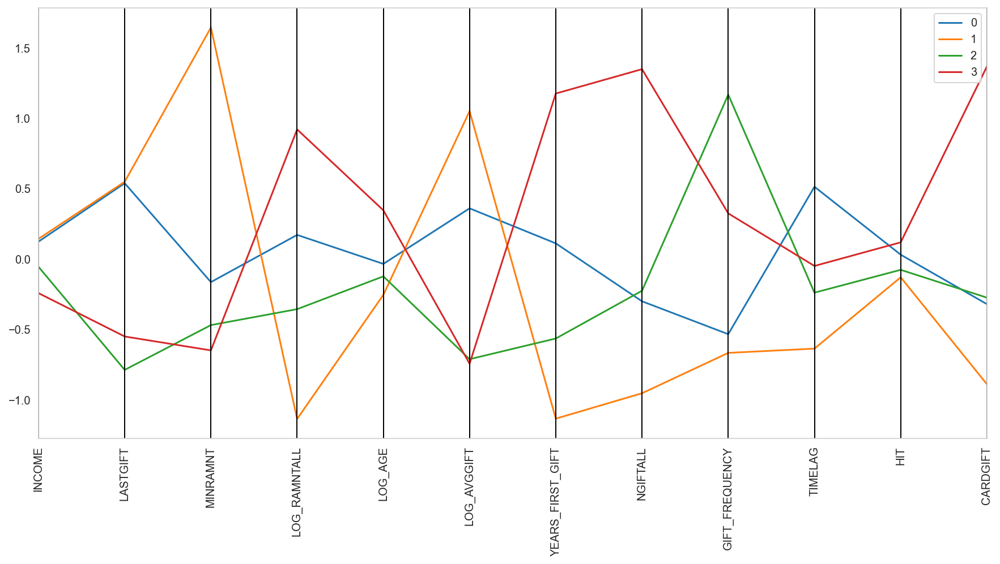

In [71]:
plt.figure(figsize=(15, 7))
pd.plotting.parallel_coordinates(km_standard, class_column = 'label', color=sns.color_palette())
plt.xticks(fontsize=10, rotation=90)

In [72]:
pva_metric_km_labeled = pd.concat((pva_metric, pd.Series(km_labels, name='labels', index=pva_standard.index.tolist())), axis=1)
km_metric = pva_metric_km_labeled.groupby('labels').mean()
km_metric['label'] = km_metric.index
km_metric 

,INCOME,LASTGIFT,MINRAMNT,LOG_RAMNTALL,LOG_AGE,LOG_AVGGIFT,YEARS_FIRST_GIFT,NGIFTALL,GIFT_FREQUENCY,TIMELAG,HIT,CARDGIFT,label
labels,,,,,,,,,,,,,
0,4.089800,20.763339,6.599425,4.417329,4.083455,2.605945,8.938066,7.014443,1.339994,10.271818,2.766310,3.585741,0
1,4.122636,20.847539,17.773524,3.364168,4.025492,2.939624,4.676880,1.779433,1.197487,3.230516,1.961514,1.077824,1
2,3.794150,9.994339,4.711920,3.992335,4.060059,2.088153,6.624987,7.614048,3.165255,5.664075,2.227936,3.788633,2
3,3.484314,11.921893,3.603115,5.021129,4.183787,2.072645,12.580789,20.230170,2.260567,6.826727,3.204853,11.025273,3


(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11]),
 [Text(0, 0, 'INCOME'),
  Text(1, 0, 'LASTGIFT'),
  Text(2, 0, 'MINRAMNT'),
  Text(3, 0, 'LOG_RAMNTALL'),
  Text(4, 0, 'LOG_AGE'),
  Text(5, 0, 'LOG_AVGGIFT'),
  Text(6, 0, 'YEARS_FIRST_GIFT'),
  Text(7, 0, 'NGIFTALL'),
  Text(8, 0, 'GIFT_FREQUENCY'),
  Text(9, 0, 'TIMELAG'),
  Text(10, 0, 'HIT'),
  Text(11, 0, 'CARDGIFT')])

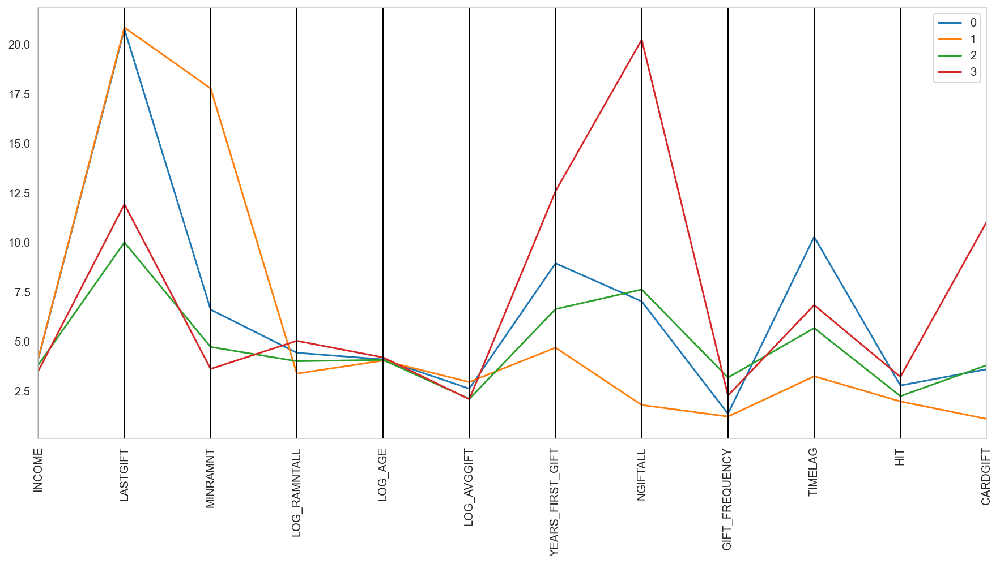

In [73]:
plt.figure(figsize=(15, 7))
pd.plotting.parallel_coordinates(km_metric, class_column = 'label', color=sns.color_palette())
plt.xticks(fontsize=10, rotation=90)

### Categorical Features

In [74]:
pva_non_metric_km_labeled = pd.concat((ohc_pva, pd.Series(km_labels, name='labels', index=pva_standard.index.tolist())), axis=1)

#### State

In [75]:
km_state = pva_non_metric_km_labeled.groupby('labels').mean().iloc[:,:57]
km_state['label'] = km_state.index
km_state 

,STATE_AA,STATE_AE,STATE_AK,STATE_AL,STATE_AP,STATE_AR,STATE_AS,STATE_AZ,STATE_CA,STATE_CO,...,STATE_TX,STATE_UT,STATE_VA,STATE_VI,STATE_VT,STATE_WA,STATE_WI,STATE_WV,STATE_WY,label
labels,,,,,,,,,,,,,,,,,,,,,
0,0.000184,0.000153,0.003366,0.017166,0.000979,0.009211,0.000000,0.025428,0.191922,0.021206,...,0.079621,0.005906,0.000367,0.000061,0.000031,0.039504,0.028397,0.000031,0.003060,0
1,0.000227,0.000284,0.005742,0.017338,0.000966,0.010403,0.000057,0.023819,0.207379,0.022284,...,0.086692,0.006424,0.000966,0.000000,0.000171,0.037064,0.022682,0.000000,0.003013,1
2,0.000161,0.000268,0.002681,0.020375,0.001340,0.011957,0.000000,0.025630,0.166434,0.020643,...,0.083003,0.006917,0.000751,0.000161,0.000107,0.034531,0.029651,0.000000,0.002252,2
3,0.000175,0.000000,0.000482,0.018089,0.000307,0.012089,0.000000,0.025360,0.156016,0.020586,...,0.068854,0.005256,0.000394,0.000000,0.000044,0.037142,0.035390,0.000131,0.003460,3


(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
        51, 52, 53, 54, 55, 56]),
 [Text(0, 0, 'STATE_AA'),
  Text(1, 0, 'STATE_AE'),
  Text(2, 0, 'STATE_AK'),
  Text(3, 0, 'STATE_AL'),
  Text(4, 0, 'STATE_AP'),
  Text(5, 0, 'STATE_AR'),
  Text(6, 0, 'STATE_AS'),
  Text(7, 0, 'STATE_AZ'),
  Text(8, 0, 'STATE_CA'),
  Text(9, 0, 'STATE_CO'),
  Text(10, 0, 'STATE_CT'),
  Text(11, 0, 'STATE_DC'),
  Text(12, 0, 'STATE_DE'),
  Text(13, 0, 'STATE_FL'),
  Text(14, 0, 'STATE_GA'),
  Text(15, 0, 'STATE_GU'),
  Text(16, 0, 'STATE_HI'),
  Text(17, 0, 'STATE_IA'),
  Text(18, 0, 'STATE_ID'),
  Text(19, 0, 'STATE_IL'),
  Text(20, 0, 'STATE_IN'),
  Text(21, 0, 'STATE_KS'),
  Text(22, 0, 'STATE_KY'),
  Text(23, 0, 'STATE_LA'),
  Text(24, 0, 'STATE_MA'),
  Text(25, 0, 'STATE_MD'),
  Text(26, 0, 'STATE_ME'),
  Text(27, 0, 'STAT

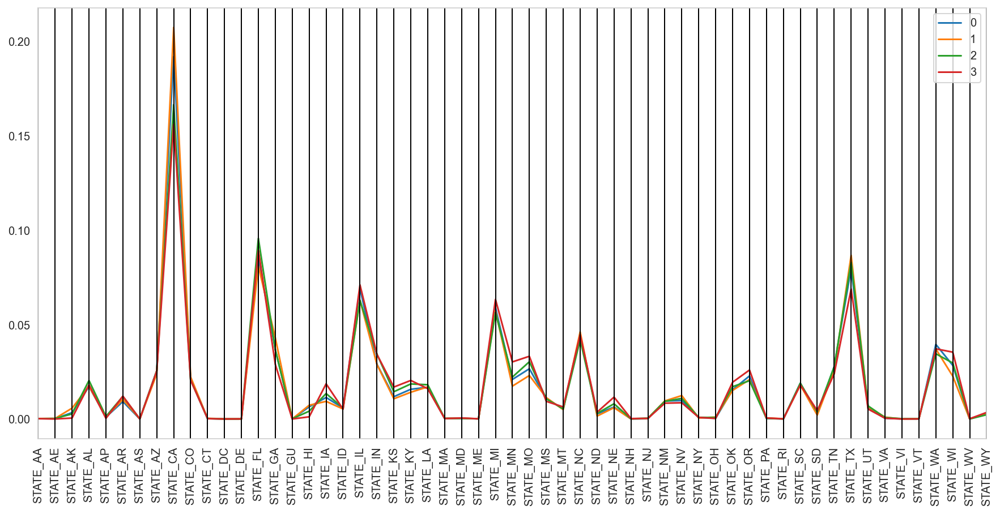

In [76]:
plt.figure(figsize=(15, 7))
pd.plotting.parallel_coordinates(km_state, class_column = 'label', color=sns.color_palette())
plt.xticks(fontsize=10, rotation=90)

#### Gender

In [77]:
km_gender = pva_non_metric_km_labeled.groupby('labels').mean().iloc[:,57:61]
km_gender['label'] = km_gender.index
km_gender

,GENDER_Female,GENDER_Join,GENDER_Male,GENDER_Unknown,label
labels,,,,,
0,0.521665,0.003519,0.425949,0.048868,0
1,0.522938,0.001421,0.432778,0.042863,1
2,0.567239,0.004558,0.383968,0.044236,2
3,0.556174,0.005212,0.378608,0.060006,3


(array([0, 1, 2, 3]),
 [Text(0, 0, 'GENDER_Female'),
  Text(1, 0, 'GENDER_Join'),
  Text(2, 0, 'GENDER_Male'),
  Text(3, 0, 'GENDER_Unknown')])

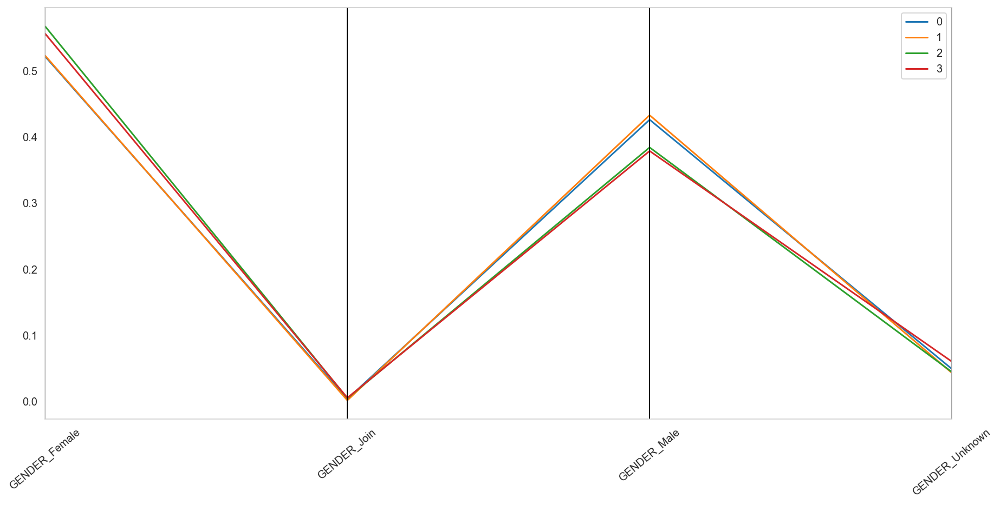

In [78]:
plt.figure(figsize=(15, 7))
pd.plotting.parallel_coordinates(km_gender, class_column = 'label', color=sns.color_palette())
plt.xticks(fontsize=10, rotation=40)

#### Urbanicity Level

In [79]:
km_urbancity = pva_non_metric_km_labeled.groupby('labels').mean().iloc[:,61:66]
km_urbancity['label'] = km_urbancity.index
km_urbancity

,URBANICITY_LEVEL_City,URBANICITY_LEVEL_Rural,URBANICITY_LEVEL_Suburban,URBANICITY_LEVEL_Town,URBANICITY_LEVEL_Urban,label
labels,,,,,,
0,0.203611,0.199510,0.263617,0.203488,0.129774,0
1,0.199363,0.182821,0.275084,0.194247,0.148485,1
2,0.201233,0.213995,0.246059,0.217105,0.121609,2
3,0.213657,0.241996,0.224826,0.208795,0.110727,3


(array([0, 1, 2, 3, 4]),
 [Text(0, 0, 'URBANICITY_LEVEL_City'),
  Text(1, 0, 'URBANICITY_LEVEL_Rural'),
  Text(2, 0, 'URBANICITY_LEVEL_Suburban'),
  Text(3, 0, 'URBANICITY_LEVEL_Town'),
  Text(4, 0, 'URBANICITY_LEVEL_Urban')])

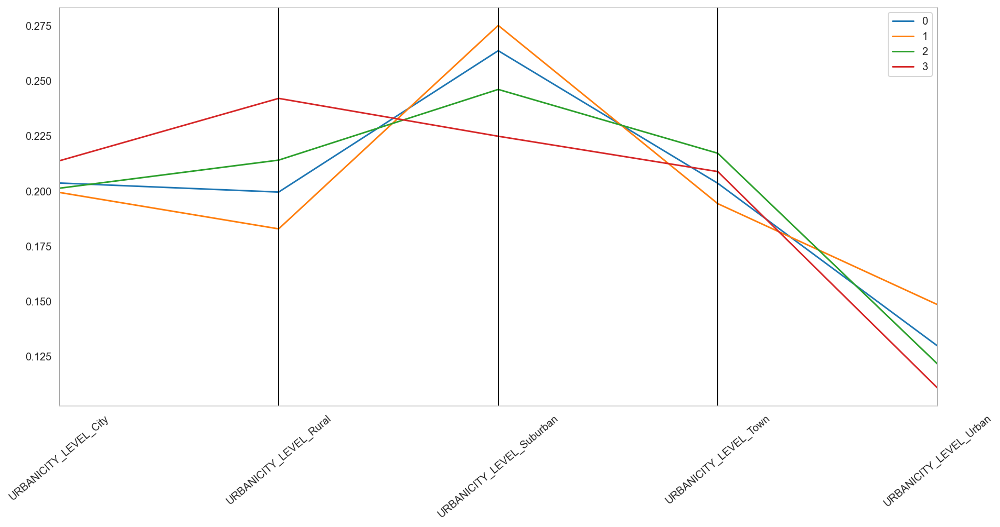

In [80]:
plt.figure(figsize=(15, 7))
pd.plotting.parallel_coordinates(km_urbancity, class_column = 'label', color=sns.color_palette())
plt.xticks(fontsize=10, rotation=40)

#### Interests

In [81]:
km_interests = pva_non_metric_km_labeled.groupby('labels').mean().iloc[:,66:]
km_interests['label'] = km_interests.index
km_interests

,COLLECT1_Y,VETERANS_Y,BIBLE_Y,CATLG_Y,HOMEE_Y,PETS_Y,CDPLAY_Y,STEREO_Y,PCOWNERS_Y,PHOTO_Y,CRAFTS_Y,FISHER_Y,GARDENIN_Y,BOATS_Y,WALKER_Y,KIDSTUFF_Y,CARDS_Y,PLATES_Y,label
labels,,,,,,,,,,,,,,,,,,,
0,0.052142,0.104559,0.088831,0.081579,0.009364,0.150796,0.132589,0.133109,0.121420,0.051071,0.080722,0.072215,0.137301,0.022705,0.105845,0.016187,0.009547,0.004896,0
1,0.054801,0.096072,0.086067,0.079131,0.011597,0.155932,0.146211,0.141720,0.128418,0.051219,0.078790,0.075095,0.132681,0.024331,0.102041,0.016543,0.008868,0.006196,1
2,0.066702,0.113137,0.103164,0.091314,0.009705,0.166434,0.139357,0.150563,0.109973,0.054745,0.103432,0.092279,0.152172,0.023217,0.121019,0.019410,0.013941,0.007614,2
3,0.046384,0.117910,0.092418,0.075774,0.006920,0.131137,0.098287,0.114450,0.076256,0.043493,0.083877,0.066357,0.136569,0.015330,0.109544,0.012395,0.011300,0.005344,3


(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17]),
 [Text(0, 0, 'COLLECT1_Y'),
  Text(1, 0, 'VETERANS_Y'),
  Text(2, 0, 'BIBLE_Y'),
  Text(3, 0, 'CATLG_Y'),
  Text(4, 0, 'HOMEE_Y'),
  Text(5, 0, 'PETS_Y'),
  Text(6, 0, 'CDPLAY_Y'),
  Text(7, 0, 'STEREO_Y'),
  Text(8, 0, 'PCOWNERS_Y'),
  Text(9, 0, 'PHOTO_Y'),
  Text(10, 0, 'CRAFTS_Y'),
  Text(11, 0, 'FISHER_Y'),
  Text(12, 0, 'GARDENIN_Y'),
  Text(13, 0, 'BOATS_Y'),
  Text(14, 0, 'WALKER_Y'),
  Text(15, 0, 'KIDSTUFF_Y'),
  Text(16, 0, 'CARDS_Y'),
  Text(17, 0, 'PLATES_Y')])

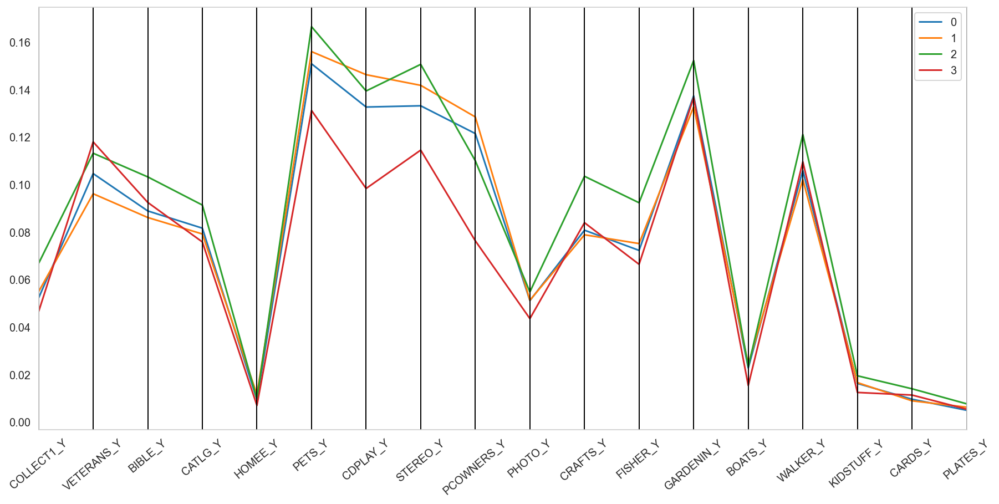

In [82]:
plt.figure(figsize=(15, 7))
pd.plotting.parallel_coordinates(km_interests, class_column = 'label', color=sns.color_palette())
plt.xticks(fontsize=10, rotation=40)

## Visualization K-means

In [83]:
two_dim_km = TSNE(random_state=42).fit_transform(pva_standard_km_labeled)

locator: <matplotlib.colorbar._ColorbarAutoLocator object at 0x00000221BF8B4AF0>
Using auto colorbar locator <matplotlib.colorbar._ColorbarAutoLocator object at 0x00000221BF8B4AF0> on colorbar
Setting pcolormesh
top of axes not in the figure, so title not moved
top of axes not in the figure, so title not moved
top of axes not in the figure, so title not moved
top of axes not in the figure, so title not moved
top of axes not in the figure, so title not moved
top of axes not in the figure, so title not moved
top of axes not in the figure, so title not moved
top of axes not in the figure, so title not moved


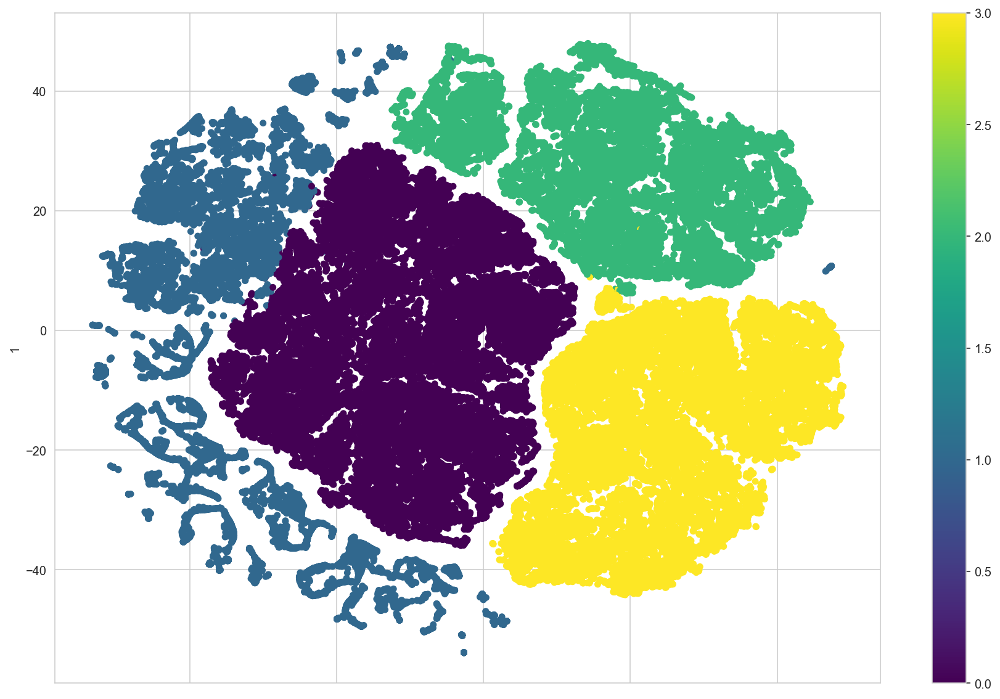

In [84]:
pd.DataFrame(two_dim_km).plot.scatter(x=0, y=1, c = pva_standard_km_labeled['labels'], colormap='viridis', figsize=(15,10))
plt.show()

# Hierarchical and K-means Clustering

### Define large number of K-means clusters

In [85]:
km = KMeans(n_clusters = 30, init = 'k-means++', n_init = 10, random_state = 0)
km.fit(pva_standard)

KMeans(n_clusters=30, random_state=0)

In [86]:
km_labels_2 = km.predict(pva_standard)

In [87]:
km_labeled_2 = pd.concat((pva_standard, pd.Series(km_labels_2, name='Labels_km', index=pva_standard.index.tolist())), axis=1)
km_centroids_2 = km_labeled_2.groupby('Labels_km').mean()

In [88]:
km_labeled_metric_2 = pd.concat((pva_metric, pd.Series(km_labels_2, name='Labels_km', index=pva_metric.index.tolist())), axis=1)
km_centroids_metric_2 = km_labeled_metric_2.groupby('Labels_km').mean()

In [89]:
km_labeled_non_metric_2 = pd.concat((ohc_pva, pd.Series(km_labels_2, name='Labels_km', index=pva_standard.index.tolist())), axis=1)
km_centriods_non_metric_2  = km_labeled_non_metric_2.groupby('Labels_km').mean()

### Defining number of hierarquical clusters:

In [90]:
# setting distance_threshold=0 and n_clusters=None ensures we compute the full tree
linkage = 'ward'
distance = 'euclidean'
hclust_1 = AgglomerativeClustering(linkage=linkage, affinity=distance, n_clusters=None, distance_threshold=0.000001)
hclust_1.fit_predict(km_centroids_2)

array([17, 28, 27, 22, 21, 23, 24, 16, 29, 11, 25, 19, 26, 18, 12,  5, 10,
        8, 14, 20, 13,  9, 15,  7,  6,  4,  2,  3,  1,  0], dtype=int64)

findfont: Matching sans\-serif:style=normal:variant=normal:weight=normal:stretch=normal:size=12.0.
findfont: score(<Font 'DejaVu Sans Display' (DejaVuSansDisplay.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'DejaVu Serif' (DejaVuSerif.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'cmtt10' (cmtt10.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'DejaVu Sans' (DejaVuSans-Bold.ttf) normal normal 700 normal>) = 2.335
findfont: score(<Font 'STIXSizeOneSym' (STIXSizOneSymBol.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'DejaVu Serif' (DejaVuSerif-Italic.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'DejaVu Sans' (DejaVuSans-Oblique.ttf) oblique normal 400 normal>) = 3.05
findfont: score(<Font 'STIXNonUnicode' (STIXNonUniBolIta.ttf) italic normal 700 normal>) = 11.335
findfont: score(<Font 'STIXGeneral' (STIXGeneral.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'STIXSizeThreeSym' (STIXSizThreeSymB

findfont: score(<Font 'Microsoft YaHei' (msyhl.ttc) normal normal 290 normal>) = 10.1545
findfont: score(<Font 'Gadugi' (gadugib.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Lucida Sans Typewriter' (LTYPEBO.TTF) oblique normal 600 normal>) = 11.24
findfont: score(<Font 'Bauhaus 93' (BAUHS93.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font '72' (72-Italic.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Comic Sans MS' (comicbd.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Georgia' (georgiab.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Eras Light ITC' (ERASLGHT.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Constantia' (constanz.ttf) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Curlz MT' (CURLZ___.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Courier New' (courbd.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Bookman Old Style' (BOOKOSBI.TTF) 

findfont: score(<Font 'Bodoni MT' (BOD_BLAI.TTF) italic normal 900 normal>) = 11.525
findfont: score(<Font 'Bodoni MT' (BOD_B.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Garamond' (GARABD.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Gill Sans MT Condensed' (GILC____.TTF) normal normal 400 condensed>) = 10.25
findfont: score(<Font 'Castellar' (CASTELAR.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Calibri' (calibrii.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Segoe UI' (segoeuib.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Trebuchet MS' (trebucbd.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Bodoni MT' (BOD_BI.TTF) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Yu Gothic' (YuGothM.ttc) normal normal 500 normal>) = 10.145
findfont: score(<Font 'Imprint MT Shadow' (IMPRISHA.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Algerian' (ALGER.TTF) normal no

findfont: score(<Font 'Eras Medium ITC' (ERASMD.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Leelawadee UI' (LeelUIsl.ttf) normal normal 350 normal>) = 10.0975
findfont: score(<Font 'Perpetua' (PERB____.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'SimSun' (simsun.ttc) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Gill Sans MT Condensed' (GILC____.TTF) normal normal 400 condensed>) = 10.25
findfont: score(<Font 'Verdana' (verdana.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Perpetua' (PERB____.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font '72' (72-BoldItalic.ttf) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Perpetua Titling MT' (PERTIBD.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Curlz MT' (CURLZ___.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Microsoft Tai Le' (taileb.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Verdana' (verdanab.tt

findfont: score(<Font 'MS Outlook' (OUTLOOK.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Candara' (Candarai.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Palatino Linotype' (palai.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Papyrus' (PAPYRUS.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Lucida Bright' (LBRITED.TTF) normal normal 600 normal>) = 10.24
findfont: score(<Font 'Vladimir Script' (VLADIMIR.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Dubai' (DUBAI-BOLD.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Constantia' (constan.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Calibri' (calibrib.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Arial' (ARIALNI.TTF) italic normal 400 condensed>) = 1.25
findfont: score(<Font 'Book Antiqua' (ANTQUAI.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Webdings' (webdings.ttf) normal normal 400 norm

findfont: score(<Font 'Berlin Sans FB' (BRLNSB.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Gill Sans MT' (GILBI___.TTF) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Lucida Fax' (LFAXD.TTF) normal normal 600 normal>) = 10.24
findfont: score(<Font 'Harlow Solid Italic' (HARLOWSI.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Microsoft YaHei' (msyh.ttc) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Constantia' (constani.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Microsoft Tai Le' (taile.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font '72' (72-Condensed.ttf) normal normal 400 condensed>) = 10.25
findfont: score(<Font 'Franklin Gothic Book' (FRABKIT.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Franklin Gothic Demi' (FRADM.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Calisto MT' (CALISTB.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Playbill' (

findfont: score(<Font 'Rockwell' (ROCKB.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'MingLiU-ExtB' (mingliub.ttc) normal normal 400 normal>) = 10.05
findfont: score(<Font 'MV Boli' (mvboli.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Book Antiqua' (ANTQUAI.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Microsoft YaHei' (msyh.ttc) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Pristina' (PRISTINA.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Impact' (impact.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font '72' (72-CondensedBold.ttf) normal normal 700 condensed>) = 10.535
findfont: score(<Font 'Eras Bold ITC' (ERASBD.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Calisto MT' (CALIST.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Eras Demi ITC' (ERASDEMI.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Lucida Fax' (LFAXI.TTF) italic normal 400 normal>

findfont: score(<Font 'Corbel' (corbeli.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Trebuchet MS' (trebuc.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Lucida Bright' (LBRITE.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Gill Sans MT' (GIL_____.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Nirmala UI' (NirmalaB.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Centaur' (CENTAUR.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Courier New' (cour.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Bodoni MT' (BOD_I.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Lucida Handwriting' (LHANDW.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font '72' (72-Bold.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Arial' (ARIALNBI.TTF) italic normal 700 condensed>) = 1.535
findfont: score(<Font 'Candara' (Candarali.ttf) italic normal 400 normal>) = 11.0

findfont: score(<Font 'STIXSizeFiveSym' (STIXSizFiveSymReg.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'DejaVu Sans' (DejaVuSans.ttf) normal normal 400 normal>) = 2.05
findfont: score(<Font 'DejaVu Sans Mono' (DejaVuSansMono-BoldOblique.ttf) oblique normal 700 normal>) = 11.335
findfont: score(<Font 'STIXSizeFourSym' (STIXSizFourSymBol.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'cmmi10' (cmmi10.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'STIXSizeOneSym' (STIXSizOneSymReg.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'DejaVu Sans Mono' (DejaVuSansMono-Bold.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'cmss10' (cmss10.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'DejaVu Sans Mono' (DejaVuSansMono-Oblique.ttf) oblique normal 400 normal>) = 11.05
findfont: score(<Font 'STIXGeneral' (STIXGeneralBol.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'STIXSizeFourSym' (STIXS

findfont: score(<Font 'Niagara Engraved' (NIAGENG.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Ravie' (RAVIE.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Cambria' (cambria.ttc) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Californian FB' (CALIFR.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Bodoni MT' (BOD_CR.TTF) normal normal 400 condensed>) = 10.25
findfont: score(<Font 'Lucida Fax' (LFAXI.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Papyrus' (PAPYRUS.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Kristen ITC' (ITCKRIST.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Sitka Small' (SitkaZ.ttc) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Onyx' (ONYX.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Centaur' (CENTAUR.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Microsoft PhagsPa' (phagspab.ttf) normal normal 700 normal>) = 10.3

findfont: score(<Font 'HoloLens MDL2 Assets' (holomdl2.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Brush Script MT' (BRUSHSCI.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Nirmala UI' (Nirmala.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Constantia' (constan.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Arial' (ARIALN.TTF) normal normal 400 condensed>) = 0.25
findfont: score(<Font 'SAPDings' (sapdn.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Corbel' (corbell.ttf) normal normal 300 normal>) = 10.145
findfont: score(<Font 'Gloucester MT Extra Condensed' (GLECB.TTF) normal normal 400 condensed>) = 10.25
findfont: score(<Font 'Stencil' (STENCIL.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Lucida Bright' (LBRITEI.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Ebrima' (ebrimabd.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Ink Free' (Inkfree.ttf) norma

findfont: score(<Font 'Book Antiqua' (ANTQUABI.TTF) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Perpetua' (PERI____.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Californian FB' (CALIFB.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Cooper Black' (COOPBL.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Dubai' (DUBAI-BOLD.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Forte' (FORTE.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Bookman Old Style' (BOOKOS.TTF) normal normal 300 normal>) = 10.145
findfont: score(<Font 'Franklin Gothic Heavy' (FRAHVIT.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Lucida Bright' (LBRITEI.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Myanmar Text' (mmrtext.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font '72' (72-CondensedBold.ttf) normal normal 700 condensed>) = 10.535
findfont: score(<Font 'Magneto' (MAGNETOB.TTF) n

findfont: score(<Font 'Century Schoolbook' (CENSCBK.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Bodoni MT' (BOD_CI.TTF) italic normal 400 condensed>) = 11.25
findfont: score(<Font 'Copperplate Gothic Light' (COPRGTL.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Baskerville Old Face' (BASKVILL.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Blackadder ITC' (ITCBLKAD.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Candara' (Candaral.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Tw Cen MT' (TCMI____.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Segoe UI Emoji' (seguiemj.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Trebuchet MS' (trebucbi.ttf) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Franklin Gothic Heavy' (FRAHV.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Calibri' (calibriz.ttf) italic normal 700 normal>) = 11.335
findfont: score(<Font 

findfont: score(<Font 'Lucida Handwriting' (LHANDW.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Franklin Gothic Book' (FRABKIT.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Haettenschweiler' (HATTEN.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Yu Gothic' (YuGothL.ttc) normal normal 300 normal>) = 10.145
findfont: score(<Font 'Segoe UI' (segoeuil.ttf) normal normal 300 normal>) = 10.145
findfont: score(<Font 'Courier New' (courbi.ttf) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Ravie' (RAVIE.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Showcard Gothic' (SHOWG.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Tw Cen MT' (TCBI____.TTF) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Sitka Small' (SitkaB.ttc) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Arial' (ARIALNB.TTF) normal normal 700 condensed>) = 0.5349999999999999
findfont: score(<Font 'Dubai' (DUBAI-MEDIUM.

findfont: score(<Font 'Agency FB' (AGENCYB.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Goudy Stout' (GOUDYSTO.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Lucida Sans Typewriter' (LTYPEBO.TTF) oblique normal 600 normal>) = 11.24
findfont: score(<Font 'Sylfaen' (sylfaen.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'MT Extra' (MTEXTRA.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Comic Sans MS' (comicbd.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Corbel' (corbelz.ttf) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Segoe Script' (segoescb.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Segoe UI Symbol' (seguisym.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Segoe UI' (seguibli.ttf) italic normal 900 normal>) = 11.525
findfont: score(<Font 'Arial' (ARIALN.TTF) normal normal 400 condensed>) = 0.25
findfont: score(<Font 'French Script MT' (FRSCRIPT.TTF) nor

findfont: score(<Font 'Georgia' (georgia.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Britannic Bold' (BRITANIC.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Matura MT Script Capitals' (MATURASC.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Wide Latin' (LATINWD.TTF) normal normal 400 expanded>) = 10.25
findfont: score(<Font 'Tahoma' (tahoma.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Javanese Text' (javatext.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Lucida Fax' (LFAXDI.TTF) italic normal 600 normal>) = 11.24
findfont: score(<Font 'Rockwell' (ROCK.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'OCR A Extended' (OCRAEXT.TTF) normal normal 400 expanded>) = 10.25
findfont: score(<Font 'MingLiU-ExtB' (mingliub.ttc) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Cambria' (cambriai.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Tw Cen MT Condensed Extra Bold' (

findfont: score(<Font 'STIXNonUnicode' (STIXNonUniIta.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'DejaVu Serif' (DejaVuSerif-Bold.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Rockwell Condensed' (ROCC____.TTF) normal normal 400 condensed>) = 10.25
findfont: score(<Font 'Candara' (Candara.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Comic Sans MS' (comic.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Gill Sans MT' (GILB____.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Corbel' (corbelz.ttf) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Palatino Linotype' (palab.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Garamond' (GARAIT.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Nirmala UI' (Nirmala.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Century' (CENTURY.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Verdana' (verdanai.t

findfont: score(<Font 'Monotype Corsiva' (MTCORSVA.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Consolas' (consola.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Forte' (FORTE.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Bodoni MT' (BOD_CBI.TTF) italic normal 700 condensed>) = 11.535
findfont: score(<Font 'Microsoft JhengHei' (msjh.ttc) normal normal 400 normal>) = 10.05
findfont: score(<Font 'SAPGUI-Belize-Icons' (SAPGUI-Belize-Icons.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Consolas' (consolai.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Gill Sans MT Ext Condensed Bold' (GLSNECB.TTF) normal normal 400 condensed>) = 10.25
findfont: score(<Font 'Calibri' (calibrii.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'SAPDings' (sapdn.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Pristina' (PRISTINA.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Bodoni MT'

findfont: score(<Font 'Franklin Gothic Medium Cond' (FRAMDCN.TTF) normal normal 400 condensed>) = 10.25
findfont: score(<Font 'Goudy Old Style' (GOUDOSB.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Sitka Small' (SitkaZ.ttc) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Gill Sans Ultra Bold' (GILSANUB.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Arial' (arial.ttf) normal normal 400 normal>) = 0.05
findfont: score(<Font 'Comic Sans MS' (comici.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Lucida Console' (lucon.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Wingdings' (wingding.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Bahnschrift' (bahnschrift.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Century Gothic' (GOTHICI.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'SAPIcons' (sapin.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Rage Italic' (

findfont: score(<Font 'Ebrima' (ebrima.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Bookshelf Symbol 7' (BSSYM7.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Microsoft New Tai Lue' (ntailu.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Myanmar Text' (mmrtext.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Harlow Solid Italic' (HARLOWSI.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Snap ITC' (SNAP____.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Harrington' (HARNGTON.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Gigi' (GIGI.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Kunstler Script' (KUNSTLER.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Agency FB' (AGENCYB.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Stencil' (STENCIL.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'High Tower Text' (HTOWERT.TTF) norm

findfont: score(<Font 'Garamond' (GARA.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Gill Sans MT' (GILB____.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Copperplate Gothic Light' (COPRGTL.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Gill Sans MT Ext Condensed Bold' (GLSNECB.TTF) normal normal 400 condensed>) = 10.25
findfont: score(<Font 'Cambria' (cambriaz.ttf) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Segoe Script' (segoesc.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Lucida Sans Typewriter' (LTYPEB.TTF) normal normal 600 normal>) = 10.24
findfont: score(<Font 'Candara' (Candarali.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Juice ITC' (JUICE___.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Bodoni MT' (BOD_CR.TTF) normal normal 400 condensed>) = 10.25
findfont: score(<Font 'Arial' (ariali.ttf) italic normal 400 normal>) = 1.05
findfont: score(<Font 'Monotype Co

findfont: score(<Font 'Calisto MT' (CALIST.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Century Schoolbook' (SCHLBKB.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Segoe UI' (seguisb.ttf) normal normal 600 normal>) = 10.24
findfont: score(<Font 'Corbel' (corbeli.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Old English Text MT' (OLDENGL.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Palace Script MT' (PALSCRI.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Yu Gothic' (YuGothB.ttc) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Arial Rounded MT Bold' (ARLRDBD.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Leelawadee UI' (LeelaUIb.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Rockwell' (ROCKI.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Tw Cen MT Condensed' (TCCB____.TTF) normal normal 700 condensed>) = 10.535
findfont: score(<Font 'TeamViewer

findfont: score(<Font 'Palatino Linotype' (pala.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Segoe UI Symbol' (seguisym.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Broadway' (BROADW.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Century Gothic' (GOTHIC.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Constantia' (constani.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Viner Hand ITC' (VINERITC.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Bodoni MT' (BOD_CB.TTF) normal normal 700 condensed>) = 10.535
findfont: score(<Font 'Bradley Hand ITC' (BRADHITC.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Microsoft Sans Serif' (micross.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Bernard MT Condensed' (BERNHC.TTF) normal normal 400 condensed>) = 10.25
findfont: score(<Font 'Times New Roman' (timesi.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Lu

findfont: score(<Font 'Yu Gothic' (YuGothR.ttc) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Bodoni MT' (BOD_I.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Segoe UI Emoji' (seguiemj.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Candara' (Candaraz.ttf) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Tw Cen MT' (TCM_____.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Candara' (Candaraz.ttf) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Segoe UI' (segoeui.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Lucida Bright' (LBRITED.TTF) normal normal 600 normal>) = 10.24
findfont: score(<Font 'TeamViewer15' (teamviewer15.otf) normal normal 500 normal>) = 10.145
findfont: score(<Font 'Bodoni MT' (BOD_CI.TTF) italic normal 400 condensed>) = 11.25
findfont: score(<Font 'Leelawadee UI' (LeelawUI.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Yu Gothic' (YuGothR.ttc) normal normal 4

findfont: score(<Font 'Lucida Bright' (LBRITEDI.TTF) italic normal 600 normal>) = 11.24
findfont: score(<Font 'Arial' (ariblk.ttf) normal normal 900 normal>) = 0.525
findfont: score(<Font 'Verdana' (verdana.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Bodoni MT' (BOD_CBI.TTF) italic normal 700 condensed>) = 11.535
findfont: score(<Font 'Microsoft Himalaya' (himalaya.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Lucida Bright' (LBRITE.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Century Gothic' (GOTHICB.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Microsoft Tai Le' (taile.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Corbel' (corbelli.ttf) italic normal 300 normal>) = 11.145
findfont: score(<Font 'Baskerville Old Face' (BASKVILL.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Modern No. 20' (MOD20.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Segoe UI' (seguili.ttf) i

findfont: score(<Font 'Lucida Fax' (LFAXD.TTF) normal normal 600 normal>) = 10.24
findfont: score(<Font 'Gabriola' (Gabriola.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Bell MT' (BELLB.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Franklin Gothic Medium' (framdit.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Bookman Old Style' (BOOKOSI.TTF) italic normal 300 normal>) = 11.145
findfont: score(<Font 'Consolas' (consolab.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Nirmala UI' (NirmalaS.ttf) normal normal 350 normal>) = 10.0975
findfont: score(<Font 'Comic Sans MS' (comicz.ttf) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Gill Sans MT' (GILI____.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Goudy Old Style' (GOUDOSI.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Informal Roman' (INFROMAN.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Mongolian Baiti' (mon

findfont: score(<Font 'Garamond' (GARAIT.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Malgun Gothic' (malgunsl.ttf) normal normal 300 normal>) = 10.145
findfont: score(<Font 'Lucida Blackletter' (LBLACK.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Impact' (impact.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Arial' (ARIALNB.TTF) normal normal 700 condensed>) = 0.5349999999999999
findfont: score(<Font 'Segoe UI' (seguibl.ttf) normal normal 900 normal>) = 10.525
findfont: score(<Font 'Candara' (Candarab.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Rockwell Extra Bold' (ROCKEB.TTF) normal normal 800 normal>) = 10.43
findfont: score(<Font 'Tw Cen MT' (TCB_____.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Eras Bold ITC' (ERASBD.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Californian FB' (CALIFB.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Bell MT' (BELL.TTF) norma

findfont: score(<Font 'Tahoma' (tahomabd.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Franklin Gothic Medium' (framdit.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Georgia' (georgia.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'MS Reference Sans Serif' (REFSAN.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Century Gothic' (GOTHICBI.TTF) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Felix Titling' (FELIXTI.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Parchment' (PARCHM.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Century Schoolbook' (SCHLBKBI.TTF) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Bauhaus 93' (BAUHS93.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Century Schoolbook' (SCHLBKB.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Cambria' (cambriai.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Comic Sans

findfont: score(<Font 'Arial' (arialbi.ttf) italic normal 700 normal>) = 1.335
findfont: score(<Font 'Onyx' (ONYX.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Matura MT Script Capitals' (MATURASC.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Times New Roman' (times.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Felix Titling' (FELIXTI.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Bodoni MT' (BOD_CB.TTF) normal normal 700 condensed>) = 10.535
findfont: score(<Font 'Gill Sans MT' (GILBI___.TTF) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Segoe Print' (segoeprb.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Bookman Old Style' (BOOKOSB.TTF) normal normal 600 normal>) = 10.24
findfont: score(<Font 'Microsoft JhengHei' (msjhl.ttc) normal normal 290 normal>) = 10.1545
findfont: score(<Font 'Calibri' (calibriz.ttf) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Perpetua Titling MT' (

findfont: score(<Font 'Myanmar Text' (mmrtextb.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Wingdings' (wingding.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Bernard MT Condensed' (BERNHC.TTF) normal normal 400 condensed>) = 10.25
findfont: score(<Font 'SAPGUI-Icons' (SAPGUI-icons.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Times New Roman' (timesi.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Corbel' (corbelb.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Lucida Sans Typewriter' (LTYPEO.TTF) oblique normal 400 normal>) = 11.05
findfont: score(<Font 'Harrington' (HARNGTON.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Microsoft Yi Baiti' (msyi.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Cambria' (cambria.ttc) normal normal 400 normal>) = 10.05
findfont: score(<Font 'MS Gothic' (msgothic.ttc) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Agency FB' (AG

findfont: score(<Font 'Nirmala UI' (NirmalaB.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Rockwell' (ROCK.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Yu Gothic' (YuGothB.ttc) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Lucida Blackletter' (LBLACK.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Georgia' (georgiab.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Rockwell Condensed' (ROCCB___.TTF) normal normal 700 condensed>) = 10.535
findfont: score(<Font 'Webdings' (webdings.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Corbel' (corbel.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Trebuchet MS' (trebucbi.ttf) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Calibri' (calibri.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Wingdings 3' (WINGDNG3.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Berlin Sans FB Demi' (BRLNSDB.TTF) norma

findfont: score(<Font 'Microsoft New Tai Lue' (ntailub.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'High Tower Text' (HTOWERTI.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Tw Cen MT Condensed Extra Bold' (TCCEB.TTF) normal normal 400 condensed>) = 10.25
findfont: score(<Font 'Franklin Gothic Medium' (framd.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Century' (CENTURY.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font '72' (72-Black.ttf) normal normal 900 normal>) = 10.525
findfont: score(<Font 'Constantia' (constanb.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Engravers MT' (ENGR.TTF) normal normal 500 normal>) = 10.145
findfont: score(<Font 'Times New Roman' (timesbi.ttf) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Segoe UI' (segoeuiz.ttf) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Ebrima' (ebrimabd.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Poor Ri

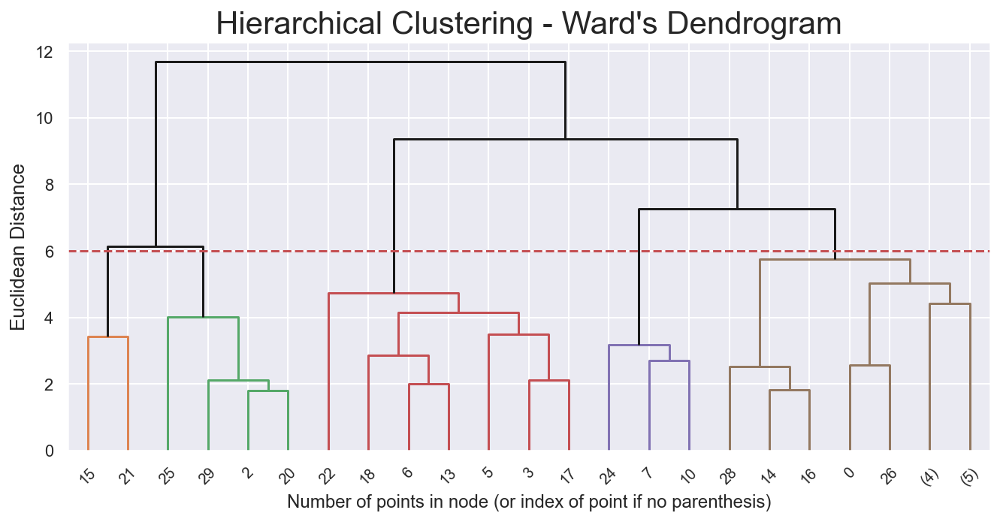

In [91]:
# Adapted from:
# create the counts of samples under each node (number of points being merged)
counts = np.zeros(hclust_1.children_.shape[0])
n_samples = len(hclust_1.labels_)

# hclust.children_ contains the observation ids that are being merged together
# At the i-th iteration, children[i][0] and children[i][1] are merged to form node n_samples + i
for i, merge in enumerate(hclust_1.children_):
    # track the number of observations in the current cluster being formed
    current_count = 0
    for child_idx in merge:
        if child_idx < n_samples:
            # If this is True, then we are merging an observation
            current_count += 1  # leaf node
        else:
            # Otherwise, we are merging a previously formed cluster
            current_count += counts[child_idx - n_samples]
    counts[i] = current_count

# the hclust.children_ is used to indicate the two points/clusters being merged (dendrogram's u-joins)
# the hclust.distances_ indicates the distance between the two points/clusters (height of the u-joins)
# the counts indicate the number of points being merged (dendrogram's x-axis)
linkage_matrix = np.column_stack(
    [hclust_1.children_, hclust_1.distances_, counts]
).astype(float)

# Plot the corresponding dendrogram
sns.set()
fig = plt.figure(figsize=(11,5))
# The Dendrogram parameters need to be tuned
y_threshold = 6
dendrogram(linkage_matrix, truncate_mode='level', p=5, color_threshold=y_threshold, above_threshold_color='k')
plt.hlines(y_threshold, 0, 1000, colors="r", linestyles="dashed")
plt.title(f'Hierarchical Clustering - {linkage.title()}\'s Dendrogram', fontsize=21)
plt.xlabel('Number of points in node (or index of point if no parenthesis)')
plt.ylabel(f'{distance.title()} Distance', fontsize=13)
plt.show()

## Hierarchical on top of K-means

In [92]:
# # Performing Hierarchical Clustering
hc_km_cluster = AgglomerativeClustering(linkage='ward', affinity = 'euclidean', n_clusters = 5)
hc_km_labels = hc_km_cluster.fit_predict(km_centroids_2)

## Characterizing Hierarchical on top of K-means

### Metric Features

In [93]:
hc_km_labeled_standard = pd.concat((km_centroids_2, pd.Series(hc_km_labels, name='Labels_hc')), axis=1)
hc_km_standard = hc_km_labeled_standard.groupby('Labels_hc').mean()
hc_km_standard['Label_hc'] = hc_km_standard.index
hc_km_standard 

,INCOME,LASTGIFT,MINRAMNT,LOG_RAMNTALL,LOG_AGE,LOG_AVGGIFT,YEARS_FIRST_GIFT,NGIFTALL,GIFT_FREQUENCY,TIMELAG,HIT,CARDGIFT,Label_hc
Labels_hc,,,,,,,,,,,,,
0,0.061696,-0.054722,-0.247542,-0.053894,-0.121869,-0.041062,-0.121454,-0.265442,0.096395,0.371732,-0.234966,-0.286695,0
1,0.214538,0.363993,1.721012,-1.465565,-0.201161,0.997016,-1.219073,-1.010906,-0.764525,-0.953919,0.462259,-0.934005,1
2,-0.252608,-0.501182,-0.639384,0.969800,-0.133439,-0.734894,1.093224,1.460135,0.498401,-0.143147,-0.157573,1.443856,2
3,-0.065309,-0.316590,-0.457025,0.304630,0.431689,-0.384356,0.375391,0.277252,0.274228,0.052970,2.762752,0.278387,3
4,0.252054,2.603028,1.347816,0.679441,-0.090328,1.701705,-0.208829,-0.420464,-0.439914,0.357398,-0.173149,-0.427464,4


(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11]),
 [Text(0, 0, 'INCOME'),
  Text(1, 0, 'LASTGIFT'),
  Text(2, 0, 'MINRAMNT'),
  Text(3, 0, 'LOG_RAMNTALL'),
  Text(4, 0, 'LOG_AGE'),
  Text(5, 0, 'LOG_AVGGIFT'),
  Text(6, 0, 'YEARS_FIRST_GIFT'),
  Text(7, 0, 'NGIFTALL'),
  Text(8, 0, 'GIFT_FREQUENCY'),
  Text(9, 0, 'TIMELAG'),
  Text(10, 0, 'HIT'),
  Text(11, 0, 'CARDGIFT')])

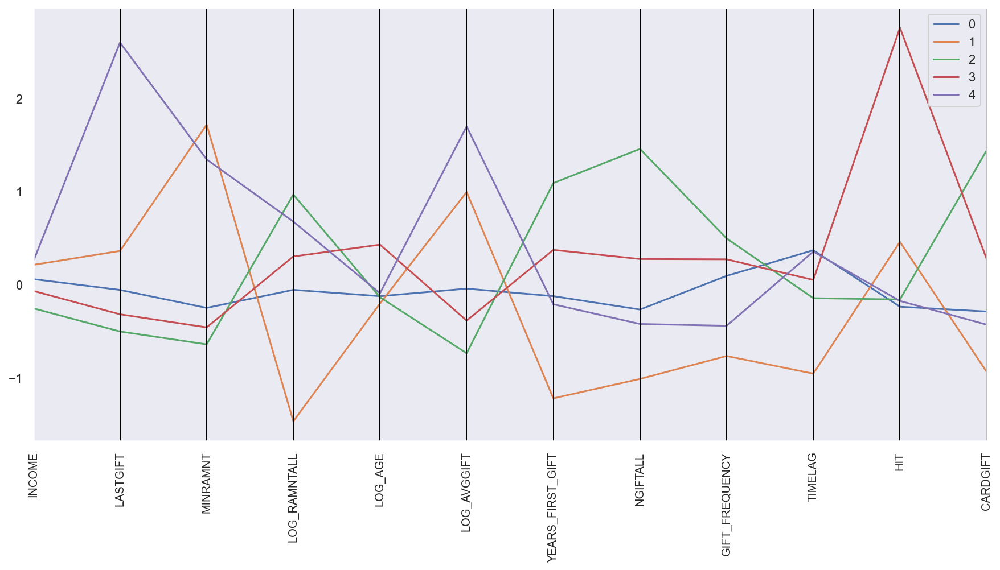

In [94]:
plt.figure(figsize=(15, 7))
pd.plotting.parallel_coordinates(hc_km_standard, class_column = 'Label_hc', color=sns.color_palette())
plt.xticks(fontsize=10, rotation=90)

In [95]:
hc_km_labeled_metric = pd.concat((km_centroids_metric_2, pd.Series(hc_km_labels, name='Labels_hc')), axis=1)
hc_km_metric = hc_km_labeled_metric.groupby('Labels_hc').mean()
hc_km_metric['Label_hc'] = hc_km_metric.index
hc_km_metric

,INCOME,LASTGIFT,MINRAMNT,LOG_RAMNTALL,LOG_AGE,LOG_AVGGIFT,YEARS_FIRST_GIFT,NGIFTALL,GIFT_FREQUENCY,TIMELAG,HIT,CARDGIFT,Label_hc
Labels_hc,,,,,,,,,,,,,
0,3.987476,15.946151,6.083403,4.235859,4.060430,2.412130,8.141803,7.294245,2.016142,9.403901,1.436212,3.734179,0
1,4.240520,19.345892,18.243513,3.098702,4.039530,2.913627,4.386266,1.321030,1.092769,1.287655,4.924302,0.882115,1
2,3.467122,12.321138,3.662925,5.060485,4.057380,2.076938,12.297860,21.120866,2.447310,6.251575,1.823396,11.359024,2
3,3.777211,13.819926,4.789387,4.524664,4.206340,2.246284,9.841771,11.642723,2.206875,7.452295,16.433266,6.223941,3
4,4.302630,37.525668,15.938217,4.826589,4.068744,3.254063,7.842846,6.052092,1.440927,9.316143,1.745469,3.113948,4


(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11]),
 [Text(0, 0, 'INCOME'),
  Text(1, 0, 'LASTGIFT'),
  Text(2, 0, 'MINRAMNT'),
  Text(3, 0, 'LOG_RAMNTALL'),
  Text(4, 0, 'LOG_AGE'),
  Text(5, 0, 'LOG_AVGGIFT'),
  Text(6, 0, 'YEARS_FIRST_GIFT'),
  Text(7, 0, 'NGIFTALL'),
  Text(8, 0, 'GIFT_FREQUENCY'),
  Text(9, 0, 'TIMELAG'),
  Text(10, 0, 'HIT'),
  Text(11, 0, 'CARDGIFT')])

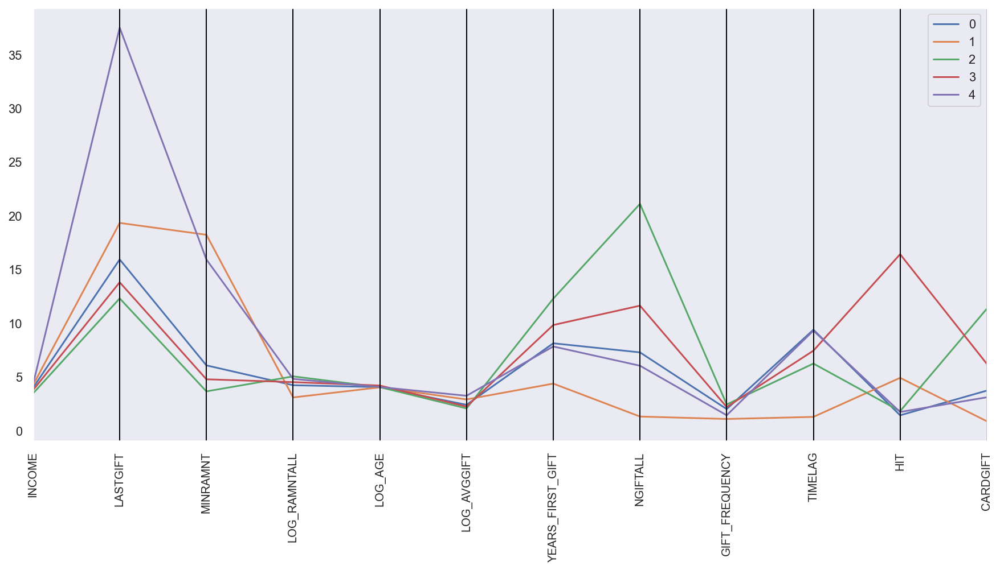

In [96]:
plt.figure(figsize=(15, 7))
pd.plotting.parallel_coordinates(hc_km_metric, class_column = 'Label_hc', color=sns.color_palette())
plt.xticks(fontsize=10, rotation=90)

### Categorical Features

In [97]:
hc_km_labeled_non_metric = pd.concat((km_centriods_non_metric_2, pd.Series(hc_km_labels, name='Labels_hc')), axis=1)

#### State

In [98]:
hc_km_state = hc_km_labeled_non_metric.groupby('Labels_hc', as_index=False).mean().iloc[:,1:57]
hc_km_state['label'] = hc_km_state.index
hc_km_state

,STATE_AA,STATE_AE,STATE_AK,STATE_AL,STATE_AP,STATE_AR,STATE_AS,STATE_AZ,STATE_CA,STATE_CO,...,STATE_TN,STATE_TX,STATE_UT,STATE_VA,STATE_VI,STATE_VT,STATE_WA,STATE_WI,STATE_WV,label
0,0.000146,0.000213,0.002913,0.018997,0.001116,0.010506,0.000000,0.024590,0.183076,0.021428,...,0.028166,0.081531,0.006111,0.000511,0.000087,0.000072,0.038168,0.028963,0.000016,0
1,0.000239,0.000340,0.005494,0.016018,0.000607,0.010272,0.000057,0.023774,0.198018,0.023983,...,0.024567,0.088549,0.006034,0.000641,0.000000,0.000092,0.035106,0.024395,0.000000,1
2,0.000250,0.000040,0.000804,0.016891,0.000357,0.011382,0.000000,0.026794,0.157966,0.019796,...,0.023952,0.069679,0.005891,0.000594,0.000000,0.000060,0.035579,0.036125,0.000141,2
3,0.000000,0.000000,0.001140,0.014297,0.000000,0.008585,0.000000,0.023874,0.154765,0.025888,...,0.020006,0.082217,0.005632,0.000000,0.000000,0.000000,0.037625,0.034624,0.000000,3
4,0.000303,0.000191,0.006768,0.012973,0.000763,0.009316,0.000000,0.029860,0.254396,0.019350,...,0.021717,0.081899,0.003883,0.001257,0.000000,0.000606,0.040191,0.021204,0.000000,4


(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
        51, 52, 53, 54, 55]),
 [Text(0, 0, 'STATE_AA'),
  Text(1, 0, 'STATE_AE'),
  Text(2, 0, 'STATE_AK'),
  Text(3, 0, 'STATE_AL'),
  Text(4, 0, 'STATE_AP'),
  Text(5, 0, 'STATE_AR'),
  Text(6, 0, 'STATE_AS'),
  Text(7, 0, 'STATE_AZ'),
  Text(8, 0, 'STATE_CA'),
  Text(9, 0, 'STATE_CO'),
  Text(10, 0, 'STATE_CT'),
  Text(11, 0, 'STATE_DC'),
  Text(12, 0, 'STATE_DE'),
  Text(13, 0, 'STATE_FL'),
  Text(14, 0, 'STATE_GA'),
  Text(15, 0, 'STATE_GU'),
  Text(16, 0, 'STATE_HI'),
  Text(17, 0, 'STATE_IA'),
  Text(18, 0, 'STATE_ID'),
  Text(19, 0, 'STATE_IL'),
  Text(20, 0, 'STATE_IN'),
  Text(21, 0, 'STATE_KS'),
  Text(22, 0, 'STATE_KY'),
  Text(23, 0, 'STATE_LA'),
  Text(24, 0, 'STATE_MA'),
  Text(25, 0, 'STATE_MD'),
  Text(26, 0, 'STATE_ME'),
  Text(27, 0, 'STATE_MI

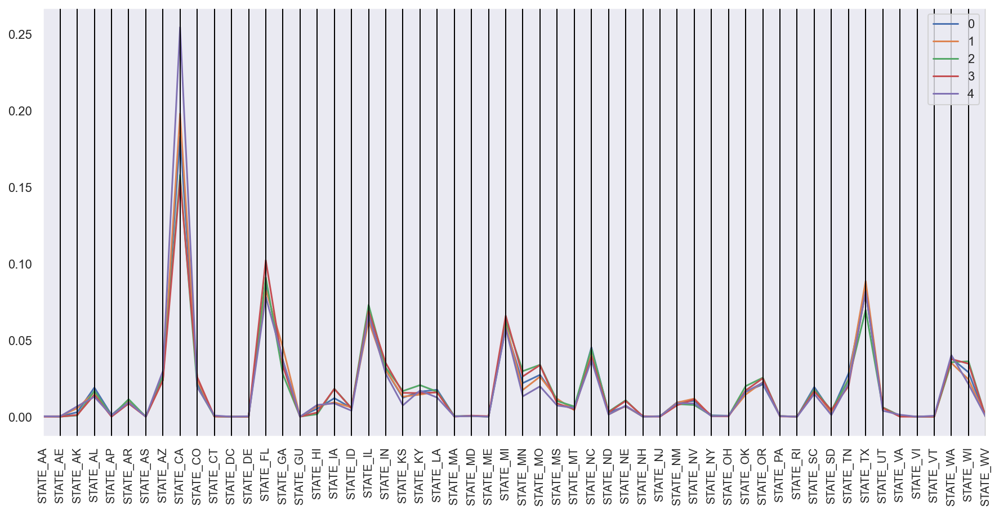

In [99]:
plt.figure(figsize=(15, 7))
pd.plotting.parallel_coordinates(hc_km_state, class_column = 'label', color=sns.color_palette())
plt.xticks(fontsize=10, rotation=90)

#### Gender

In [100]:
hc_km_gender = hc_km_labeled_non_metric.groupby('Labels_hc', as_index=False).mean().iloc[:,57:61]
hc_km_gender['label'] = hc_km_gender.index
hc_km_gender

,STATE_WY,GENDER_Female,GENDER_Join,GENDER_Male,label
0,0.002656,0.540555,0.003598,0.407935,0
1,0.002640,0.517541,0.001110,0.443892,1
2,0.003229,0.565904,0.006172,0.366175,2
3,0.002901,0.536448,0.005087,0.442854,3
4,0.003951,0.494753,0.003492,0.448516,4


(array([0, 1, 2, 3]),
 [Text(0, 0, 'STATE_WY'),
  Text(1, 0, 'GENDER_Female'),
  Text(2, 0, 'GENDER_Join'),
  Text(3, 0, 'GENDER_Male')])

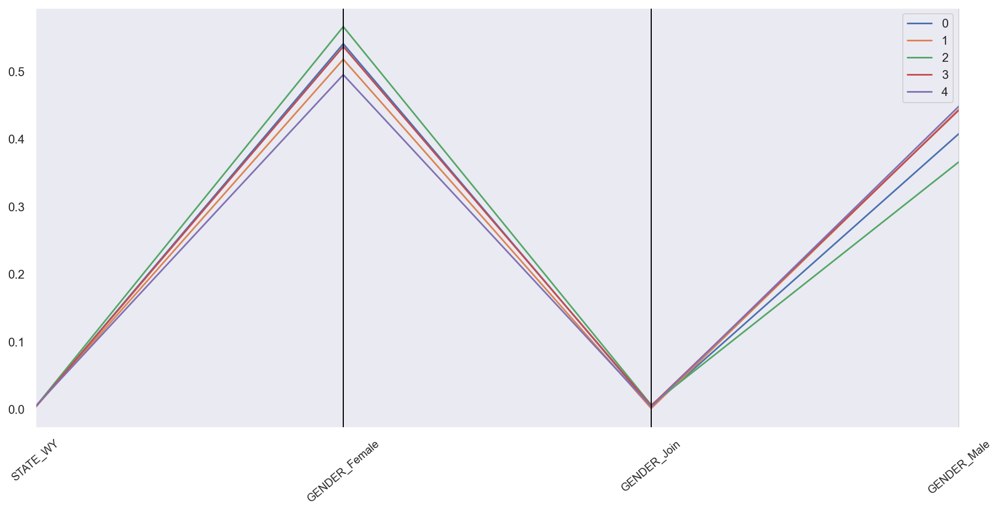

In [101]:
#plt.plot(hc_km_labeled_non_metric.iloc[:,61:66])
plt.figure(figsize=(15, 7))
pd.plotting.parallel_coordinates(hc_km_gender, class_column = 'label', color=sns.color_palette())
plt.xticks(fontsize=10, rotation=40)

#### Urbanicity Level

In [102]:
hc_km_urbanicity = hc_km_labeled_non_metric.groupby('Labels_hc', as_index=False).mean().iloc[:,61:66]
hc_km_urbanicity['label'] = hc_km_urbanicity.index
hc_km_urbanicity

,GENDER_Unknown,URBANICITY_LEVEL_City,URBANICITY_LEVEL_Rural,URBANICITY_LEVEL_Suburban,URBANICITY_LEVEL_Town,label
0,0.047913,0.198478,0.211068,0.256176,0.206777,0
1,0.037456,0.201466,0.166512,0.284370,0.200558,1
2,0.061749,0.213133,0.244286,0.221801,0.207745,2
3,0.015611,0.267207,0.141177,0.265793,0.214087,3
4,0.053239,0.193020,0.170068,0.295072,0.193007,4


(array([0, 1, 2, 3, 4]),
 [Text(0, 0, 'GENDER_Unknown'),
  Text(1, 0, 'URBANICITY_LEVEL_City'),
  Text(2, 0, 'URBANICITY_LEVEL_Rural'),
  Text(3, 0, 'URBANICITY_LEVEL_Suburban'),
  Text(4, 0, 'URBANICITY_LEVEL_Town')])

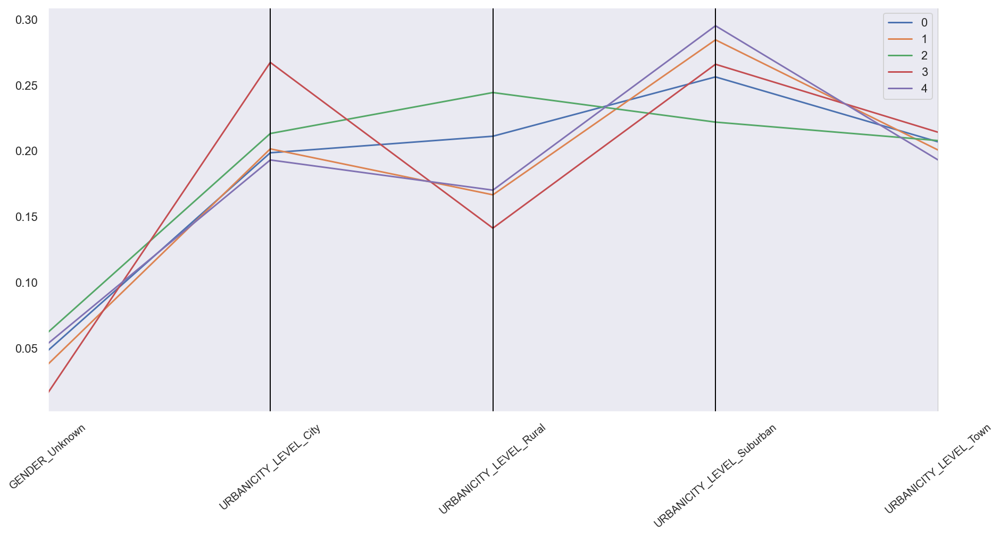

In [103]:
#plt.plot(hc_km_labeled_non_metric.iloc[:,61:66])
plt.figure(figsize=(15, 7))
pd.plotting.parallel_coordinates(hc_km_urbanicity, class_column = 'label', color=sns.color_palette())
plt.xticks(fontsize=10, rotation=40)

#### Interests

In [104]:
hc_km_interests = hc_km_labeled_non_metric.groupby('Labels_hc', as_index=False).mean().iloc[:,66:]
hc_km_interests['label'] = hc_km_interests.index
hc_km_interests

,URBANICITY_LEVEL_Urban,COLLECT1_Y,VETERANS_Y,BIBLE_Y,CATLG_Y,HOMEE_Y,PETS_Y,CDPLAY_Y,STEREO_Y,PCOWNERS_Y,PHOTO_Y,CRAFTS_Y,FISHER_Y,GARDENIN_Y,BOATS_Y,WALKER_Y,KIDSTUFF_Y,CARDS_Y,PLATES_Y,label
0,0.127501,0.057378,0.103287,0.093218,0.083407,0.009318,0.157445,0.135176,0.138551,0.116198,0.051220,0.087176,0.078772,0.139671,0.022727,0.107056,0.017779,0.010804,0.005683,0
1,0.147095,0.057532,0.109533,0.096345,0.092305,0.013258,0.166896,0.160957,0.154315,0.146263,0.059498,0.090663,0.082130,0.151429,0.027242,0.118727,0.020733,0.011485,0.007164,1
2,0.113035,0.045161,0.103792,0.085447,0.070376,0.006186,0.124899,0.095060,0.108093,0.073976,0.040632,0.079187,0.063003,0.123990,0.014056,0.096082,0.012203,0.010984,0.005135,2
3,0.111736,0.087181,0.186954,0.138083,0.124370,0.013686,0.202427,0.168619,0.191464,0.144435,0.081121,0.137132,0.110807,0.221042,0.025478,0.182901,0.022197,0.022599,0.010625,3
4,0.148833,0.039516,0.084012,0.070373,0.068632,0.008865,0.132403,0.122647,0.115038,0.115072,0.042073,0.057253,0.059498,0.109752,0.024827,0.080617,0.012773,0.006499,0.005668,4


(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18]),
 [Text(0, 0, 'URBANICITY_LEVEL_Urban'),
  Text(1, 0, 'COLLECT1_Y'),
  Text(2, 0, 'VETERANS_Y'),
  Text(3, 0, 'BIBLE_Y'),
  Text(4, 0, 'CATLG_Y'),
  Text(5, 0, 'HOMEE_Y'),
  Text(6, 0, 'PETS_Y'),
  Text(7, 0, 'CDPLAY_Y'),
  Text(8, 0, 'STEREO_Y'),
  Text(9, 0, 'PCOWNERS_Y'),
  Text(10, 0, 'PHOTO_Y'),
  Text(11, 0, 'CRAFTS_Y'),
  Text(12, 0, 'FISHER_Y'),
  Text(13, 0, 'GARDENIN_Y'),
  Text(14, 0, 'BOATS_Y'),
  Text(15, 0, 'WALKER_Y'),
  Text(16, 0, 'KIDSTUFF_Y'),
  Text(17, 0, 'CARDS_Y'),
  Text(18, 0, 'PLATES_Y')])

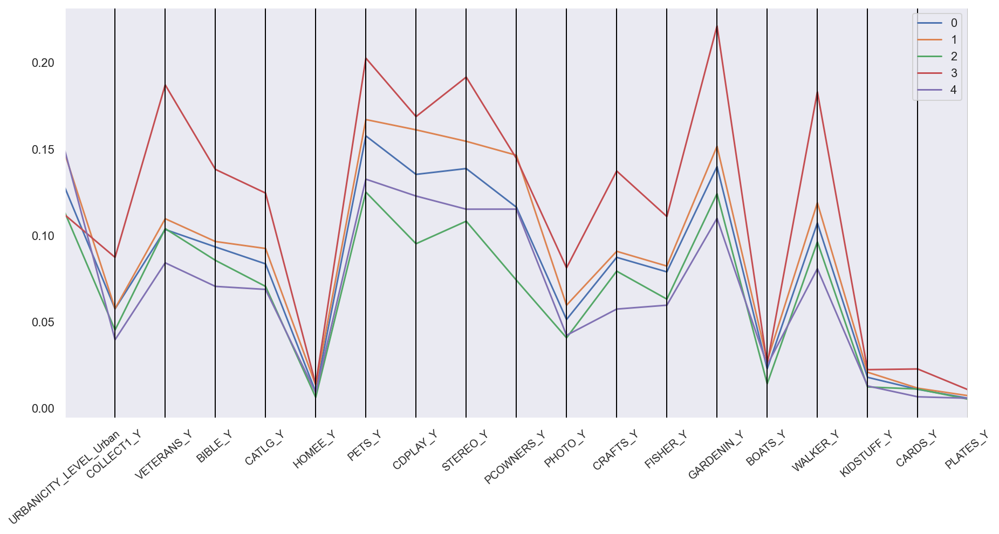

In [105]:
plt.figure(figsize=(15, 7))
pd.plotting.parallel_coordinates(hc_km_interests, class_column = 'label', color=sns.color_palette())
plt.xticks(fontsize=10, rotation=40)

## Visualization K-means on top of Hierarchical

In [106]:
km_hc_tsne = km_labeled_2.copy()

In [107]:
km_hc_tsne['Labels_km'].replace({0: 4, 1: 2, 2: 0, 3: 1, 4: 2, 5: 2, 6: 0, 7: 0, 8: 0, 9: 2, 10: 0, 11: 3, 12: 2, 13: 1, 14: 0, 15: 0, 16: 3, 17: 0, 18: 1, 19: 0, 20: 3, 21: 1, 22: 0, 23: 3, 24: 4, 25: 2, 26: 2, 27: 0, 28: 1, 29: 4}, inplace=True)

In [108]:
km_hc_tsne.rename(columns={'Labels_km':'Labels_km_hc'}, inplace=True)

In [109]:
two_dim_km_hc = TSNE(random_state=42).fit_transform(km_hc_tsne)

locator: <matplotlib.colorbar._ColorbarAutoLocator object at 0x00000221BFA4ABE0>
Using auto colorbar locator <matplotlib.colorbar._ColorbarAutoLocator object at 0x00000221BFA4ABE0> on colorbar
Setting pcolormesh
top of axes not in the figure, so title not moved
top of axes not in the figure, so title not moved
top of axes not in the figure, so title not moved
top of axes not in the figure, so title not moved
top of axes not in the figure, so title not moved
top of axes not in the figure, so title not moved
top of axes not in the figure, so title not moved
top of axes not in the figure, so title not moved


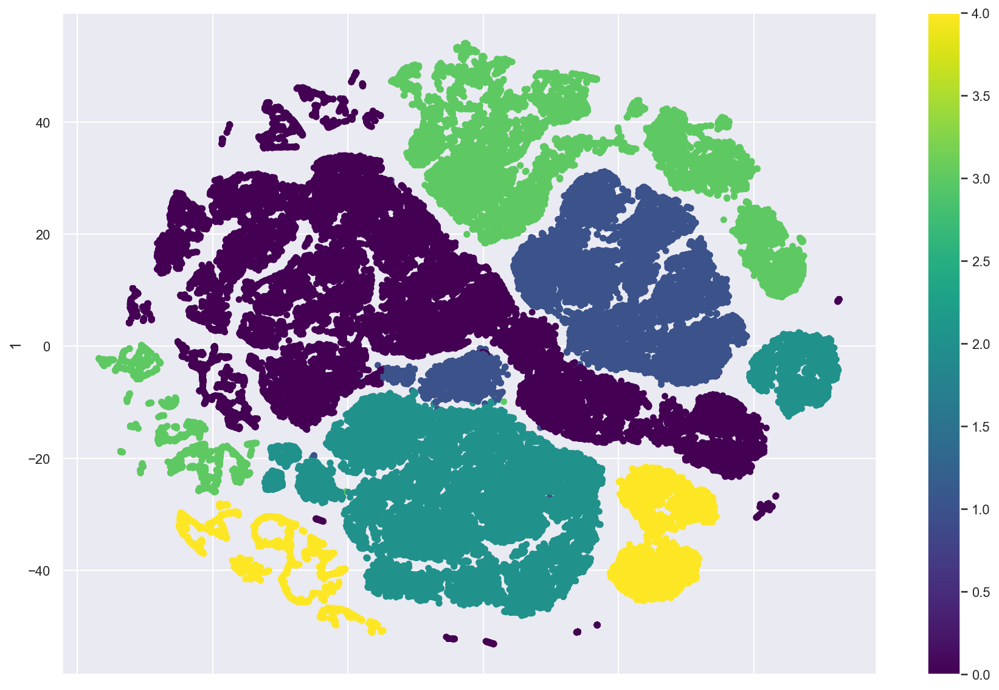

In [110]:
pd.DataFrame(two_dim_km_hc).plot.scatter(x=0, y=1, c = km_hc_tsne['Labels_km_hc'], colormap='viridis', figsize=(15,10))
plt.show()

# Clustering by Perspectives

## K-means Clustering by Perspective

In [111]:
Demographic = pva_standard[['INCOME', 'LOG_AGE', 'LOG_AVGGIFT', 'LASTGIFT', 'MINRAMNT', 'LOG_RAMNTALL']]
Engagement =  pva_standard[['YEARS_FIRST_GIFT', 'NGIFTALL', 'GIFT_FREQUENCY', 'TIMELAG', 'HIT', 'CARDGIFT']]

In [112]:
Demographic_metric = pva_metric[['INCOME', 'LOG_AGE', 'LOG_AVGGIFT', 'LASTGIFT', 'MINRAMNT', 'LOG_RAMNTALL']]
Engagement_metric =  pva_metric[['YEARS_FIRST_GIFT', 'NGIFTALL', 'GIFT_FREQUENCY', 'TIMELAG', 'HIT', 'CARDGIFT']]

In [113]:
def get_ss(df):
    """Computes the sum of squares for all variables given a dataset
    """
    ss = np.sum(df.var() * (df.count() - 1))
    return ss  # return sum of sum of squares of each df variable

def r2(df, labels):
    sst = get_ss(df)
    ssw = np.sum(df.groupby(labels).apply(get_ss))
    return 1 - ssw/sst
    
def get_r2_scores(df, clusterer, min_k=2, max_k=10):
    """
    Loop over different values of k. To be used with sklearn clusterers.
    """
    r2_clust = {}
    for n in range(min_k, max_k):
        clust = clone(clusterer).set_params(n_clusters=n)
        labels = clust.fit_predict(df)
        r2_clust[n] = r2(df, labels)
    return r2_clust

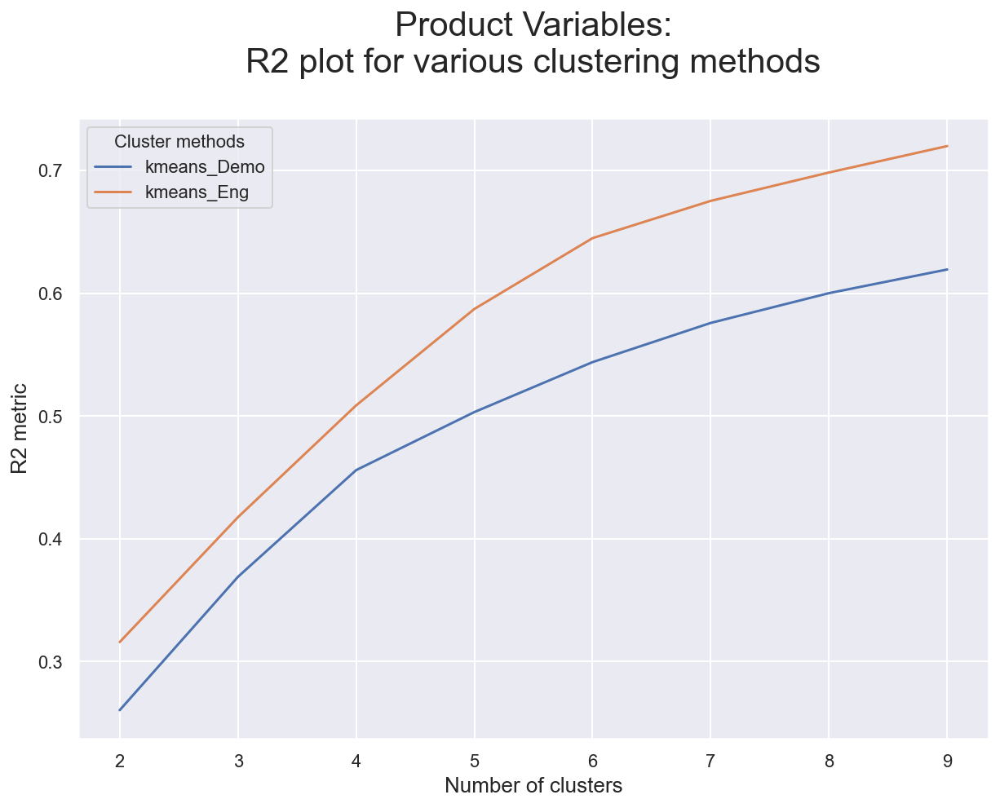

In [114]:
# Set up the clusterers
kmeans = KMeans(init='k-means++', n_init=15, random_state=42)


# Obtaining the R² scores for each cluster solution on product variables
r2_scores = {}
r2_scores['kmeans_Demo'] = get_r2_scores(Demographic, kmeans)
r2_scores['kmeans_Eng'] = get_r2_scores(Engagement, kmeans)


# Visualizing the R² scores for each cluster solution on product variables
pd.DataFrame(r2_scores).plot.line(figsize=(10,7))

 
plt.title("Product Variables:\nR2 plot for various clustering methods\n", fontsize=21)
plt.legend(title = 'Cluster methods', title_fontsize=11)
plt.xlabel('Number of clusters', fontsize=13)
plt.ylabel('R2 metric', fontsize=13)
plt.show()

In [115]:
kmeans_Demo = KMeans(n_clusters = 6, init = 'k-means++', n_init = 15, random_state=42)
Demo_labels = kmeans_Demo.fit_predict(Demographic)

kmeans_Eng = KMeans(n_clusters = 7, init = 'k-means++', n_init = 15, random_state = 42)
Eng_labels = kmeans_Eng.fit_predict(Engagement)

km_metric_perspective = pva_standard.copy()

km_metric_perspective['Demo_labels'] = Demo_labels
km_metric_perspective['Eng_labels'] = Eng_labels

In [116]:
km_metric_perspective.groupby(['Demo_labels', 'Eng_labels'])\
    .size()\
    .to_frame()\
    .reset_index()\
    .pivot('Demo_labels', 'Eng_labels', 0)

Eng_labels,0,1,2,3,4,5,6
Demo_labels,,,,,,,
0,3074.0,3488.0,663.0,1456.0,2110.0,685.0,785.0
1,148.0,2207.0,NaN,10633.0,1.0,568.0,421.0
2,6415.0,318.0,4421.0,179.0,3569.0,1041.0,625.0
3,3288.0,7558.0,1257.0,2610.0,5120.0,2193.0,2018.0
4,2294.0,3714.0,1815.0,1249.0,5112.0,1727.0,1358.0
5,668.0,2325.0,491.0,560.0,2084.0,636.0,868.0


## Merging Using Hierarchical Clustering

In [117]:
perspective_centroids = km_metric_perspective.groupby(['Demo_labels', 'Eng_labels']).mean()

In [118]:
linkage = 'ward'
hclust = AgglomerativeClustering(linkage = linkage, affinity='euclidean', distance_threshold = 0, n_clusters= None) # distance_threshold = 0
hclust_labels = hclust.fit_predict(perspective_centroids)

findfont: Matching sans\-serif:style=normal:variant=normal:weight=normal:stretch=normal:size=8.0.
findfont: score(<Font 'DejaVu Sans Display' (DejaVuSansDisplay.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'DejaVu Serif' (DejaVuSerif.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'cmtt10' (cmtt10.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'DejaVu Sans' (DejaVuSans-Bold.ttf) normal normal 700 normal>) = 2.335
findfont: score(<Font 'STIXSizeOneSym' (STIXSizOneSymBol.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'DejaVu Serif' (DejaVuSerif-Italic.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'DejaVu Sans' (DejaVuSans-Oblique.ttf) oblique normal 400 normal>) = 3.05
findfont: score(<Font 'STIXNonUnicode' (STIXNonUniBolIta.ttf) italic normal 700 normal>) = 11.335
findfont: score(<Font 'STIXGeneral' (STIXGeneral.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'STIXSizeThreeSym' (STIXSizThreeSymBo

findfont: score(<Font 'Microsoft YaHei' (msyhl.ttc) normal normal 290 normal>) = 10.1545
findfont: score(<Font 'Gadugi' (gadugib.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Lucida Sans Typewriter' (LTYPEBO.TTF) oblique normal 600 normal>) = 11.24
findfont: score(<Font 'Bauhaus 93' (BAUHS93.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font '72' (72-Italic.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Comic Sans MS' (comicbd.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Georgia' (georgiab.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Eras Light ITC' (ERASLGHT.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Constantia' (constanz.ttf) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Curlz MT' (CURLZ___.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Courier New' (courbd.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Bookman Old Style' (BOOKOSBI.TTF) 

findfont: score(<Font 'Bodoni MT' (BOD_BLAI.TTF) italic normal 900 normal>) = 11.525
findfont: score(<Font 'Bodoni MT' (BOD_B.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Garamond' (GARABD.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Gill Sans MT Condensed' (GILC____.TTF) normal normal 400 condensed>) = 10.25
findfont: score(<Font 'Castellar' (CASTELAR.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Calibri' (calibrii.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Segoe UI' (segoeuib.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Trebuchet MS' (trebucbd.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Bodoni MT' (BOD_BI.TTF) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Yu Gothic' (YuGothM.ttc) normal normal 500 normal>) = 10.145
findfont: score(<Font 'Imprint MT Shadow' (IMPRISHA.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Algerian' (ALGER.TTF) normal no

findfont: score(<Font 'Eras Medium ITC' (ERASMD.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Leelawadee UI' (LeelUIsl.ttf) normal normal 350 normal>) = 10.0975
findfont: score(<Font 'Perpetua' (PERB____.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'SimSun' (simsun.ttc) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Gill Sans MT Condensed' (GILC____.TTF) normal normal 400 condensed>) = 10.25
findfont: score(<Font 'Verdana' (verdana.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Perpetua' (PERB____.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font '72' (72-BoldItalic.ttf) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Perpetua Titling MT' (PERTIBD.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Curlz MT' (CURLZ___.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Microsoft Tai Le' (taileb.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Verdana' (verdanab.tt

findfont: score(<Font 'MS Outlook' (OUTLOOK.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Candara' (Candarai.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Palatino Linotype' (palai.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Papyrus' (PAPYRUS.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Lucida Bright' (LBRITED.TTF) normal normal 600 normal>) = 10.24
findfont: score(<Font 'Vladimir Script' (VLADIMIR.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Dubai' (DUBAI-BOLD.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Constantia' (constan.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Calibri' (calibrib.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Arial' (ARIALNI.TTF) italic normal 400 condensed>) = 1.25
findfont: score(<Font 'Book Antiqua' (ANTQUAI.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Webdings' (webdings.ttf) normal normal 400 norm

findfont: score(<Font 'Berlin Sans FB' (BRLNSB.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Gill Sans MT' (GILBI___.TTF) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Lucida Fax' (LFAXD.TTF) normal normal 600 normal>) = 10.24
findfont: score(<Font 'Harlow Solid Italic' (HARLOWSI.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Microsoft YaHei' (msyh.ttc) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Constantia' (constani.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Microsoft Tai Le' (taile.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font '72' (72-Condensed.ttf) normal normal 400 condensed>) = 10.25
findfont: score(<Font 'Franklin Gothic Book' (FRABKIT.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Franklin Gothic Demi' (FRADM.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Calisto MT' (CALISTB.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Playbill' (

findfont: score(<Font 'Rockwell' (ROCKB.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'MingLiU-ExtB' (mingliub.ttc) normal normal 400 normal>) = 10.05
findfont: score(<Font 'MV Boli' (mvboli.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Book Antiqua' (ANTQUAI.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Microsoft YaHei' (msyh.ttc) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Pristina' (PRISTINA.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Impact' (impact.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font '72' (72-CondensedBold.ttf) normal normal 700 condensed>) = 10.535
findfont: score(<Font 'Eras Bold ITC' (ERASBD.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Calisto MT' (CALIST.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Eras Demi ITC' (ERASDEMI.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Lucida Fax' (LFAXI.TTF) italic normal 400 normal>

findfont: score(<Font 'Corbel' (corbeli.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Trebuchet MS' (trebuc.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Lucida Bright' (LBRITE.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Gill Sans MT' (GIL_____.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Nirmala UI' (NirmalaB.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Centaur' (CENTAUR.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Courier New' (cour.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Bodoni MT' (BOD_I.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Lucida Handwriting' (LHANDW.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font '72' (72-Bold.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Arial' (ARIALNBI.TTF) italic normal 700 condensed>) = 1.535
findfont: score(<Font 'Candara' (Candarali.ttf) italic normal 400 normal>) = 11.0

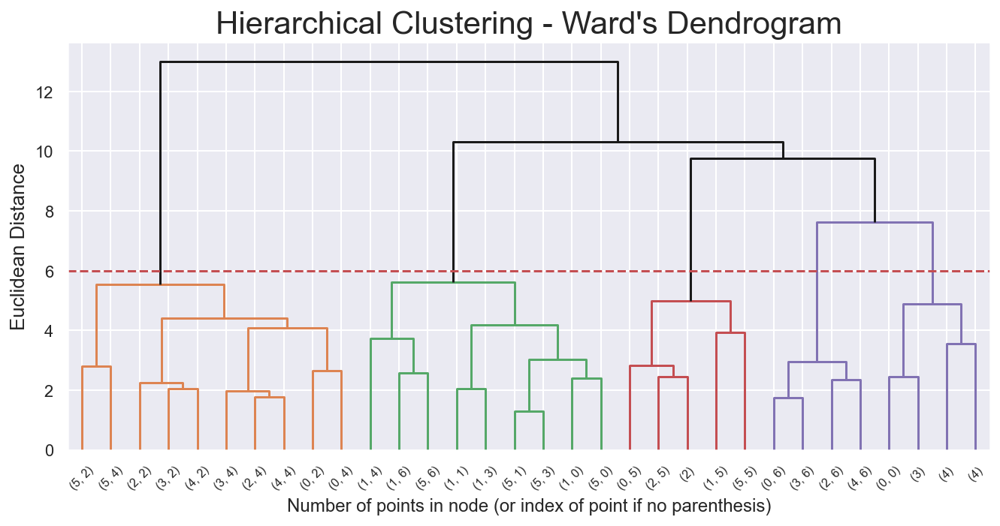

In [119]:
# Adapted from:
# https://scikit-learn.org/stable/auto_examples/cluster/plot_agglomerative_dendrogram.html#sphx-glr-auto-examples-cluster-plot-agglomerative-dendrogram-py

# create the counts of samples under each node (number of points being merged)
counts = np.zeros(hclust.children_.shape[0])
n_samples = len(hclust.labels_)

# hclust.children_ contains the observation ids that are being merged together
# At the i-th iteration, children[i][0] and children[i][1] are merged to form node n_samples + i
for i, merge in enumerate(hclust.children_):
    # track the number of observations in the current cluster being formed
    current_count = 0
    for child_idx in merge:
        if child_idx < n_samples:
            # If this is True, then we are merging an observation
            current_count += 1  # leaf node
        else:
            # Otherwise, we are merging a previously formed cluster
            current_count += counts[child_idx - n_samples]
    counts[i] = current_count

# the hclust.children_ is used to indicate the two points/clusters being merged (dendrogram's u-joins)
# the hclust.distances_ indicates the distance between the two points/clusters (height of the u-joins)
# the counts indicate the number of points being merged (dendrogram's x-axis)
linkage_matrix = np.column_stack(
    [hclust.children_, hclust.distances_, counts]
).astype(float)

 

# Plot the corresponding dendrogram
sns.set()
fig = plt.figure(figsize=(11,5))
# The Dendrogram parameters need to be tuned
y_threshold=6
dendrogram(linkage_matrix, truncate_mode='level', labels = perspective_centroids.index, p=5, above_threshold_color='k')
plt.hlines(y_threshold, 0, 1000, colors="r", linestyles="dashed")
plt.title(f'Hierarchical Clustering - {linkage.title()}\'s Dendrogram', fontsize=21)
plt.xlabel('Number of points in node (or index of point if no parenthesis)')
plt.ylabel(f'Euclidean Distance', fontsize=13)
plt.show()

In [120]:
# Re-running the Hierarchical clustering based on the correct number of clusters
hclust = AgglomerativeClustering(linkage='ward', affinity='euclidean', n_clusters = 5)
hclust_labels = hclust.fit_predict(perspective_centroids)
perspective_centroids['hclust_labels'] = hclust_labels

In [121]:
# Mapper between concatenated clusters and hierarchical clusters
cluster_mapper = perspective_centroids['hclust_labels'].to_dict()

#perspective_centroids_2 = perspective_centroids.copy()

# Mapping the hierarchical clusters on the centroids to the observations
km_metric_perspective['merged_labels'] = km_metric_perspective.apply(lambda row: cluster_mapper[(row['Demo_labels'], row['Eng_labels'])], axis=1)

# Merged cluster centroids
km_metric_perspective.groupby('merged_labels').mean()#[metric_features]

,INCOME,LASTGIFT,MINRAMNT,LOG_RAMNTALL,LOG_AGE,LOG_AVGGIFT,YEARS_FIRST_GIFT,NGIFTALL,GIFT_FREQUENCY,TIMELAG,HIT,CARDGIFT,Demo_labels,Eng_labels
merged_labels,,,,,,,,,,,,,,
0,0.152737,0.910412,1.565491,-0.760258,-0.195854,1.202387,-0.890722,-0.830275,-0.623824,-0.364407,-0.264662,-0.787372,1.991756,2.571308
1,-0.137141,-0.254761,-0.563860,0.914851,0.223729,-0.495034,1.112767,1.112160,0.081030,-0.121043,-0.163732,1.138135,2.841153,3.350875
2,0.018351,-0.260082,-0.291236,-0.347685,-0.134723,-0.221661,-0.502560,-0.394378,0.291737,-0.070216,-0.269247,-0.432853,2.334820,0.885447
3,0.040249,0.032545,-0.138519,0.158766,0.294404,0.001053,0.176003,-0.017035,-0.074230,0.028525,2.823481,-0.015338,2.820000,5.000000
4,0.000094,-0.083375,-0.326483,0.101900,0.066221,-0.074724,0.614974,-0.136241,-0.193338,2.513557,-0.138476,-0.156558,2.661095,6.000000


## Characterizing Clusters by Perspective

In [122]:
km_hc_metric_perspective = pva_metric.copy()

km_hc_metric_perspective['Demo_labels'], km_hc_metric_perspective['Eng_labels'], km_hc_metric_perspective['merged_labels'] = km_metric_perspective['Demo_labels'],km_metric_perspective['Eng_labels'], km_metric_perspective['merged_labels'] 

In [123]:
def cluster_profiles(df, label_columns, figsize, compar_titles=None):
    """
    Pass df with labels columns of one or multiple clustering labels. 
    Then specify this label columns to perform the cluster profile according to them.
    """
    if compar_titles == None:
        compar_titles = [""]*len(label_columns)
        
    sns.set()
    fig, axes = plt.subplots(nrows=len(label_columns), ncols=2, figsize=figsize, squeeze=False)
    for ax, label, titl in zip(axes, label_columns, compar_titles):
        # Filtering df
        drop_cols = [i for i in label_columns if i!=label]
        dfax = df.drop(drop_cols, axis=1)
        
        # Getting the cluster centroids and counts
        centroids = dfax.groupby(by=label, as_index=False).mean()
        counts = dfax.groupby(by=label, as_index=False).count().iloc[:,[0,1]]
        counts.columns = [label, "counts"]
        
        # Setting Data
        pd.plotting.parallel_coordinates(centroids, label, color=sns.color_palette(), ax=ax[0])
        sns.barplot(x=label, y="counts", data=counts, ax=ax[1])

 

        #Setting Layout
        handles, _ = ax[0].get_legend_handles_labels()
        cluster_labels = ["Cluster {}".format(i) for i in range(len(handles))]
        ax[0].annotate(text=titl, xy=(0.95,1.1), xycoords='axes fraction', fontsize=13, fontweight = 'heavy') 
        ax[0].legend(handles, cluster_labels) # Adaptable to number of clusters
        ax[0].axhline(color="black", linestyle="--")
        ax[0].set_title("Cluster Means - {} Clusters".format(len(handles)), fontsize=13)
        ax[0].set_xticklabels(ax[0].get_xticklabels(), rotation=-20)
        ax[1].set_xticklabels(cluster_labels)
        ax[1].set_xlabel("")
        ax[1].set_ylabel("Absolute Frequency")
        ax[1].set_title("Cluster Sizes - {} Clusters".format(len(handles)), fontsize=13)
    
    plt.subplots_adjust(hspace=0.4, top=0.90)
    plt.suptitle("Cluster Simple Profilling", fontsize=23)
    plt.show()

findfont: Matching sans\-serif:style=normal:variant=normal:weight=heavy:stretch=normal:size=13.0.
findfont: score(<Font 'DejaVu Sans Display' (DejaVuSansDisplay.ttf) normal normal 400 normal>) = 10.43
findfont: score(<Font 'DejaVu Serif' (DejaVuSerif.ttf) normal normal 400 normal>) = 10.43
findfont: score(<Font 'cmtt10' (cmtt10.ttf) normal normal 400 normal>) = 10.43
findfont: score(<Font 'DejaVu Sans' (DejaVuSans-Bold.ttf) normal normal 700 normal>) = 2.145
findfont: score(<Font 'STIXSizeOneSym' (STIXSizOneSymBol.ttf) normal normal 700 normal>) = 10.145
findfont: score(<Font 'DejaVu Serif' (DejaVuSerif-Italic.ttf) italic normal 400 normal>) = 11.43
findfont: score(<Font 'DejaVu Sans' (DejaVuSans-Oblique.ttf) oblique normal 400 normal>) = 3.43
findfont: score(<Font 'STIXNonUnicode' (STIXNonUniBolIta.ttf) italic normal 700 normal>) = 11.145
findfont: score(<Font 'STIXGeneral' (STIXGeneral.ttf) normal normal 400 normal>) = 10.43
findfont: score(<Font 'STIXSizeThreeSym' (STIXSizThreeSymBo

findfont: score(<Font 'Poor Richard' (POORICH.TTF) normal normal 400 normal>) = 10.43
findfont: score(<Font 'Microsoft YaHei' (msyhl.ttc) normal normal 290 normal>) = 10.5345
findfont: score(<Font 'Gadugi' (gadugib.ttf) normal normal 700 normal>) = 10.145
findfont: score(<Font 'Lucida Sans Typewriter' (LTYPEBO.TTF) oblique normal 600 normal>) = 11.24
findfont: score(<Font 'Bauhaus 93' (BAUHS93.TTF) normal normal 400 normal>) = 10.43
findfont: score(<Font '72' (72-Italic.ttf) italic normal 400 normal>) = 11.43
findfont: score(<Font 'Comic Sans MS' (comicbd.ttf) normal normal 700 normal>) = 10.145
findfont: score(<Font 'Georgia' (georgiab.ttf) normal normal 700 normal>) = 10.145
findfont: score(<Font 'Eras Light ITC' (ERASLGHT.TTF) normal normal 400 normal>) = 10.43
findfont: score(<Font 'Constantia' (constanz.ttf) italic normal 700 normal>) = 11.145
findfont: score(<Font 'Curlz MT' (CURLZ___.TTF) normal normal 400 normal>) = 10.43
findfont: score(<Font 'Courier New' (courbd.ttf) normal 

findfont: score(<Font 'Tempus Sans ITC' (TEMPSITC.TTF) normal normal 400 normal>) = 10.43
findfont: score(<Font 'Bell MT' (BELLI.TTF) italic normal 400 normal>) = 11.43
findfont: score(<Font 'Bodoni MT' (BOD_BLAR.TTF) normal normal 900 normal>) = 10.145
findfont: score(<Font 'Bodoni MT' (BOD_BLAI.TTF) italic normal 900 normal>) = 11.145
findfont: score(<Font 'Bodoni MT' (BOD_B.TTF) normal normal 700 normal>) = 10.145
findfont: score(<Font 'Garamond' (GARABD.TTF) normal normal 700 normal>) = 10.145
findfont: score(<Font 'Gill Sans MT Condensed' (GILC____.TTF) normal normal 400 condensed>) = 10.629999999999999
findfont: score(<Font 'Castellar' (CASTELAR.TTF) normal normal 400 normal>) = 10.43
findfont: score(<Font 'Calibri' (calibrii.ttf) italic normal 400 normal>) = 11.43
findfont: score(<Font 'Segoe UI' (segoeuib.ttf) normal normal 700 normal>) = 10.145
findfont: score(<Font 'Trebuchet MS' (trebucbd.ttf) normal normal 700 normal>) = 10.145
findfont: score(<Font 'Bodoni MT' (BOD_BI.TTF)

findfont: score(<Font 'Book Antiqua' (ANTQUABI.TTF) italic normal 700 normal>) = 11.145
findfont: score(<Font 'Lucida Sans Unicode' (l_10646.ttf) normal normal 400 normal>) = 10.43
findfont: score(<Font 'Verdana' (verdanai.ttf) italic normal 400 normal>) = 11.43
findfont: score(<Font 'Eras Medium ITC' (ERASMD.TTF) normal normal 400 normal>) = 10.43
findfont: score(<Font 'Leelawadee UI' (LeelUIsl.ttf) normal normal 350 normal>) = 10.4775
findfont: score(<Font 'Perpetua' (PERB____.TTF) normal normal 700 normal>) = 10.145
findfont: score(<Font 'SimSun' (simsun.ttc) normal normal 400 normal>) = 10.43
findfont: score(<Font 'Gill Sans MT Condensed' (GILC____.TTF) normal normal 400 condensed>) = 10.629999999999999
findfont: score(<Font 'Verdana' (verdana.ttf) normal normal 400 normal>) = 10.43
findfont: score(<Font 'Perpetua' (PERB____.TTF) normal normal 700 normal>) = 10.145
findfont: score(<Font '72' (72-BoldItalic.ttf) italic normal 700 normal>) = 11.145
findfont: score(<Font 'Perpetua Tit

findfont: score(<Font 'Bodoni MT' (BOD_BI.TTF) italic normal 700 normal>) = 11.145
findfont: score(<Font 'Cambria' (cambriab.ttf) normal normal 700 normal>) = 10.145
findfont: score(<Font 'Elephant' (ELEPHNTI.TTF) italic normal 400 normal>) = 11.43
findfont: score(<Font 'Arial' (ariali.ttf) italic normal 400 normal>) = 1.43
findfont: score(<Font 'MS Outlook' (OUTLOOK.TTF) normal normal 400 normal>) = 10.43
findfont: score(<Font 'Candara' (Candarai.ttf) italic normal 400 normal>) = 11.43
findfont: score(<Font 'Palatino Linotype' (palai.ttf) italic normal 400 normal>) = 11.43
findfont: score(<Font 'Papyrus' (PAPYRUS.TTF) normal normal 400 normal>) = 10.43
findfont: score(<Font 'Lucida Bright' (LBRITED.TTF) normal normal 600 normal>) = 10.24
findfont: score(<Font 'Vladimir Script' (VLADIMIR.TTF) normal normal 400 normal>) = 10.43
findfont: score(<Font 'Dubai' (DUBAI-BOLD.TTF) normal normal 700 normal>) = 10.145
findfont: score(<Font 'Constantia' (constan.ttf) normal normal 400 normal>) = 

findfont: score(<Font 'OCR A Extended' (OCRAEXT.TTF) normal normal 400 expanded>) = 10.629999999999999
findfont: score(<Font 'Corbel' (corbel.ttf) normal normal 400 normal>) = 10.43
findfont: score(<Font 'High Tower Text' (HTOWERTI.TTF) italic normal 400 normal>) = 11.43
findfont: score(<Font 'Century Gothic' (GOTHICB.TTF) normal normal 700 normal>) = 10.145
findfont: score(<Font 'Malgun Gothic' (malgunbd.ttf) normal normal 700 normal>) = 10.145
findfont: score(<Font 'Berlin Sans FB' (BRLNSB.TTF) normal normal 700 normal>) = 10.145
findfont: score(<Font 'Gill Sans MT' (GILBI___.TTF) italic normal 700 normal>) = 11.145
findfont: score(<Font 'Lucida Fax' (LFAXD.TTF) normal normal 600 normal>) = 10.24
findfont: score(<Font 'Harlow Solid Italic' (HARLOWSI.TTF) italic normal 400 normal>) = 11.43
findfont: score(<Font 'Microsoft YaHei' (msyh.ttc) normal normal 400 normal>) = 10.43
findfont: score(<Font 'Constantia' (constani.ttf) italic normal 400 normal>) = 11.43
findfont: score(<Font 'Micr

findfont: score(<Font 'French Script MT' (FRSCRIPT.TTF) normal normal 400 normal>) = 10.43
findfont: score(<Font 'Calibri' (calibrib.ttf) normal normal 700 normal>) = 10.145
findfont: score(<Font 'Perpetua' (PERBI___.TTF) italic normal 700 normal>) = 11.145
findfont: score(<Font 'Perpetua' (PERBI___.TTF) italic normal 700 normal>) = 11.145
findfont: score(<Font 'Elephant' (ELEPHNT.TTF) normal normal 400 normal>) = 10.43
findfont: score(<Font 'Rockwell' (ROCKB.TTF) normal normal 700 normal>) = 10.145
findfont: score(<Font 'MingLiU-ExtB' (mingliub.ttc) normal normal 400 normal>) = 10.43
findfont: score(<Font 'MV Boli' (mvboli.ttf) normal normal 400 normal>) = 10.43
findfont: score(<Font 'Book Antiqua' (ANTQUAI.TTF) italic normal 400 normal>) = 11.43
findfont: score(<Font 'Microsoft YaHei' (msyh.ttc) normal normal 400 normal>) = 10.43
findfont: score(<Font 'Pristina' (PRISTINA.TTF) normal normal 400 normal>) = 10.43
findfont: score(<Font 'Impact' (impact.ttf) normal normal 400 normal>) = 

findfont: score(<Font 'Vladimir Script' (VLADIMIR.TTF) normal normal 400 normal>) = 10.43
findfont: score(<Font 'Segoe Print' (segoepr.ttf) normal normal 400 normal>) = 10.43
findfont: score(<Font 'Times New Roman' (timesbd.ttf) normal normal 700 normal>) = 10.145
findfont: score(<Font 'MS Reference Specialty' (REFSPCL.TTF) normal normal 400 normal>) = 10.43
findfont: score(<Font 'Gill Sans MT' (GILI____.TTF) italic normal 400 normal>) = 11.43
findfont: score(<Font 'Segoe UI' (seguibli.ttf) italic normal 900 normal>) = 11.145
findfont: score(<Font 'Corbel' (corbeli.ttf) italic normal 400 normal>) = 11.43
findfont: score(<Font 'Trebuchet MS' (trebuc.ttf) normal normal 400 normal>) = 10.43
findfont: score(<Font 'Lucida Bright' (LBRITE.TTF) normal normal 400 normal>) = 10.43
findfont: score(<Font 'Gill Sans MT' (GIL_____.TTF) normal normal 400 normal>) = 10.43
findfont: score(<Font 'Nirmala UI' (NirmalaB.ttf) normal normal 700 normal>) = 10.145
findfont: score(<Font 'Centaur' (CENTAUR.TTF

findfont: score(<Font 'STIXSizeTwoSym' (STIXSizTwoSymBol.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'STIXGeneral' (STIXGeneralItalic.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'DejaVu Sans' (DejaVuSans-BoldOblique.ttf) oblique normal 700 normal>) = 3.335
findfont: score(<Font 'STIXGeneral' (STIXGeneralBolIta.ttf) italic normal 700 normal>) = 11.335
findfont: score(<Font 'cmsy10' (cmsy10.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'STIXSizeTwoSym' (STIXSizTwoSymReg.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'STIXNonUnicode' (STIXNonUni.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'STIXSizeFiveSym' (STIXSizFiveSymReg.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'DejaVu Sans' (DejaVuSans.ttf) normal normal 400 normal>) = 2.05
findfont: score(<Font 'DejaVu Sans Mono' (DejaVuSansMono-BoldOblique.ttf) oblique normal 700 normal>) = 11.335
findfont: score(<Font 'STIXSizeFourSym' (STIXS

findfont: score(<Font 'Trebuchet MS' (trebuc.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Segoe Script' (segoescb.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Tahoma' (tahoma.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Rockwell' (ROCKI.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Segoe UI' (segoeuii.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Bookman Old Style' (BOOKOS.TTF) normal normal 300 normal>) = 10.145
findfont: score(<Font 'Goudy Old Style' (GOUDOSI.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Footlight MT Light' (FTLTLT.TTF) normal normal 300 normal>) = 10.145
findfont: score(<Font 'Niagara Engraved' (NIAGENG.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Ravie' (RAVIE.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Cambria' (cambria.ttc) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Californian FB' (CALIFR.TTF) normal normal

findfont: score(<Font 'Trebuchet MS' (trebucbd.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font '72' (72-Black.ttf) normal normal 900 normal>) = 10.525
findfont: score(<Font 'Times New Roman' (times.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Century Schoolbook' (SCHLBKBI.TTF) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Lucida Sans' (LSANSI.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Microsoft Yi Baiti' (msyi.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Rockwell' (ROCKBI.TTF) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Vivaldi' (VIVALDII.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'HoloLens MDL2 Assets' (holomdl2.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Brush Script MT' (BRUSHSCI.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Nirmala UI' (Nirmala.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Constantia' (constan.ttf

findfont: score(<Font 'Wingdings 3' (WINGDNG3.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font '72' (72-Italic.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Marlett' (marlett.ttf) normal normal 500 normal>) = 10.145
findfont: score(<Font 'Colonna MT' (COLONNA.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Kristen ITC' (ITCKRIST.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Gill Sans Ultra Bold' (GILSANUB.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Playbill' (PLAYBILL.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Leelawadee UI' (LeelawUI.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Book Antiqua' (ANTQUABI.TTF) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Perpetua' (PERI____.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Californian FB' (CALIFB.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Cooper Black' (COOPBL.TTF) normal no

findfont: score(<Font 'Lucida Sans' (LSANS.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Symbol' (symbol.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Tw Cen MT Condensed' (TCCM____.TTF) normal normal 400 condensed>) = 10.25
findfont: score(<Font 'Malgun Gothic' (malgun.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'SimSun' (simsun.ttc) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Gill Sans Ultra Bold Condensed' (GILLUBCD.TTF) normal normal 400 condensed>) = 10.25
findfont: score(<Font 'Tw Cen MT Condensed' (TCCM____.TTF) normal normal 400 condensed>) = 10.25
findfont: score(<Font 'Century Schoolbook' (CENSCBK.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Bodoni MT' (BOD_CI.TTF) italic normal 400 condensed>) = 11.25
findfont: score(<Font 'Copperplate Gothic Light' (COPRGTL.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Baskerville Old Face' (BASKVILL.TTF) normal normal 400 normal>) = 10.05
f

findfont: score(<Font 'Courier New' (courbi.ttf) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Century Gothic' (GOTHICBI.TTF) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Mongolian Baiti' (monbaiti.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Bodoni MT' (BOD_R.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Arial Rounded MT Bold' (ARLRDBD.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Microsoft PhagsPa' (phagspa.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Copperplate Gothic Bold' (COPRGTB.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Lucida Handwriting' (LHANDW.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Franklin Gothic Book' (FRABKIT.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Haettenschweiler' (HATTEN.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Yu Gothic' (YuGothL.ttc) normal normal 300 normal>) = 10.145
findfont: sco

findfont: score(<Font 'Modern No. 20' (MOD20.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Arial' (arialbd.ttf) normal normal 700 normal>) = 0.33499999999999996
findfont: score(<Font 'Edwardian Script ITC' (ITCEDSCR.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font '72' (72-Bold.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Calibri' (calibrili.ttf) italic normal 300 normal>) = 11.145
findfont: score(<Font 'Sitka Small' (SitkaI.ttc) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Franklin Gothic Demi Cond' (FRADMCN.TTF) normal normal 400 condensed>) = 10.25
findfont: score(<Font 'Agency FB' (AGENCYB.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Goudy Stout' (GOUDYSTO.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Lucida Sans Typewriter' (LTYPEBO.TTF) oblique normal 600 normal>) = 11.24
findfont: score(<Font 'Sylfaen' (sylfaen.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'MT Extra'

findfont: score(<Font 'Rockwell' (ROCKB.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Agency FB' (AGENCYR.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Segoe UI' (segoeuib.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Gabriola' (Gabriola.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Gadugi' (gadugib.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Corbel' (corbelli.ttf) italic normal 300 normal>) = 11.145
findfont: score(<Font 'Elephant' (ELEPHNTI.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Georgia' (georgia.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Britannic Bold' (BRITANIC.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Matura MT Script Capitals' (MATURASC.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Wide Latin' (LATINWD.TTF) normal normal 400 expanded>) = 10.25
findfont: score(<Font 'Tahoma' (tahoma.ttf) normal normal 400 norma

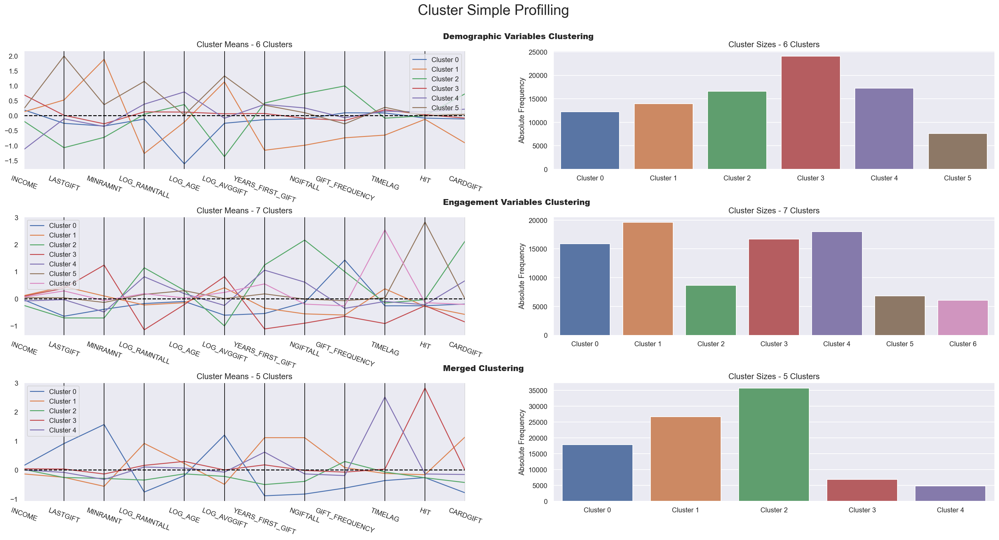

In [124]:
# Profilling each cluster (product, behavior, merged)
cluster_profiles(
    km_metric_perspective, 
    label_columns = ['Demo_labels', 'Eng_labels', 'merged_labels'],
    figsize = (28, 13),
    compar_titles = ["Demographic Variables Clustering", "Engagement Variables Clustering", "Merged Clustering"]
)

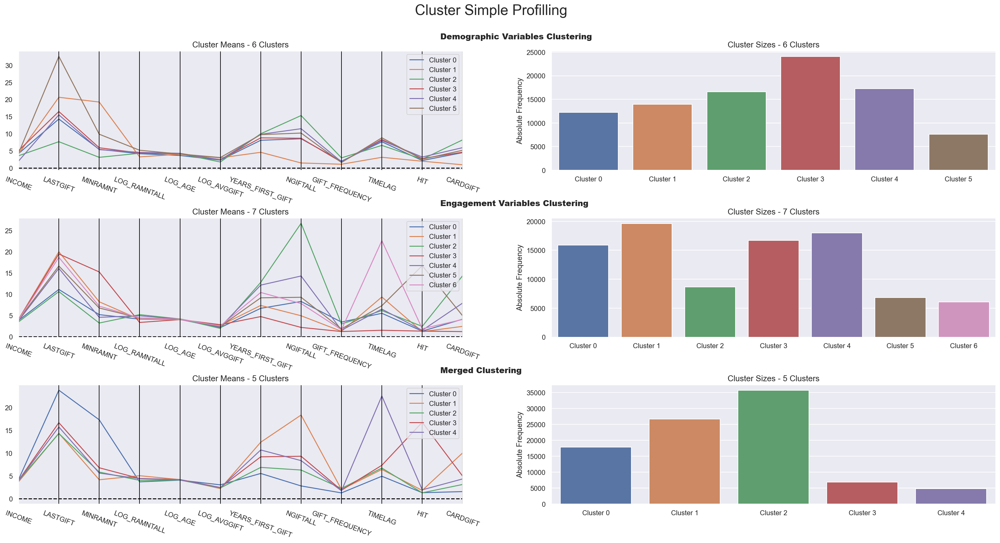

In [125]:
# Profilling each cluster (product, behavior, merged)
cluster_profiles(
    km_hc_metric_perspective, 
    label_columns = ['Demo_labels', 'Eng_labels', 'merged_labels'],
    figsize = (28, 13),
    compar_titles = ["Demographic Variables Clustering", "Engagement Variables Clustering", "Merged Clustering"]
)

## Cluster Visualization using TSNE

In [126]:
# This is step can be quite time consuming
two_dim = TSNE(random_state=42).fit_transform(km_metric_perspective)

locator: <matplotlib.colorbar._ColorbarAutoLocator object at 0x00000221C4A6FEB0>
Using auto colorbar locator <matplotlib.colorbar._ColorbarAutoLocator object at 0x00000221C4A6FEB0> on colorbar
Setting pcolormesh
top of axes not in the figure, so title not moved
top of axes not in the figure, so title not moved
top of axes not in the figure, so title not moved
top of axes not in the figure, so title not moved
top of axes not in the figure, so title not moved
top of axes not in the figure, so title not moved
top of axes not in the figure, so title not moved
top of axes not in the figure, so title not moved


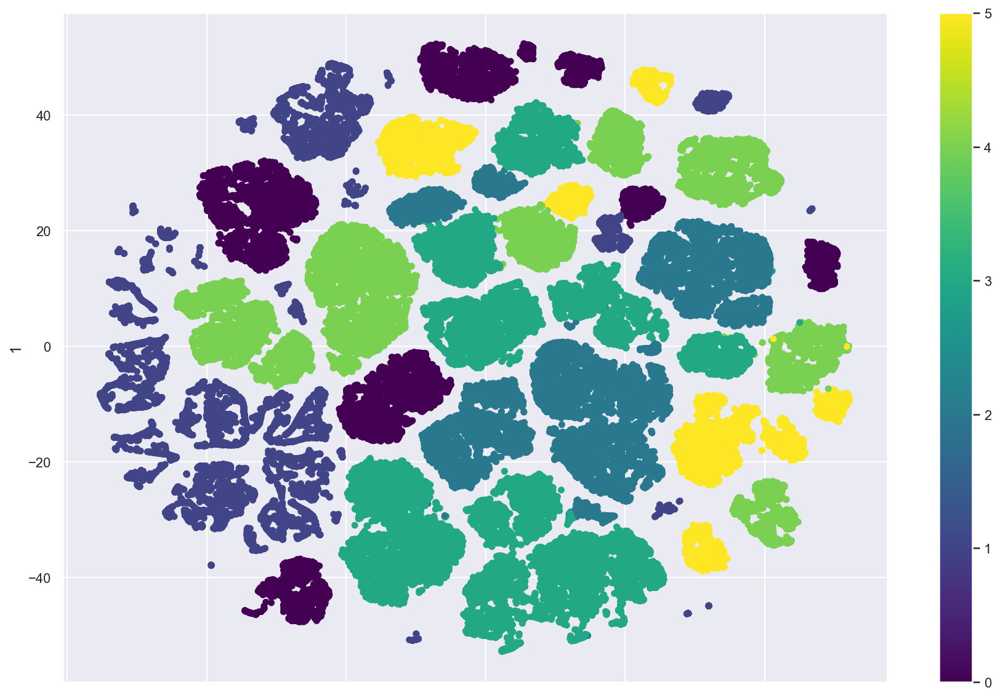

In [127]:
# # t-SNE visualization
pd.DataFrame(two_dim).plot.scatter(x=0, y=1, c = km_metric_perspective['Demo_labels'], colormap='viridis', figsize=(15,10))
plt.show()

locator: <matplotlib.colorbar._ColorbarAutoLocator object at 0x00000221C51B1D60>
Using auto colorbar locator <matplotlib.colorbar._ColorbarAutoLocator object at 0x00000221C51B1D60> on colorbar
Setting pcolormesh
top of axes not in the figure, so title not moved
top of axes not in the figure, so title not moved
top of axes not in the figure, so title not moved
top of axes not in the figure, so title not moved
top of axes not in the figure, so title not moved
top of axes not in the figure, so title not moved
top of axes not in the figure, so title not moved
top of axes not in the figure, so title not moved


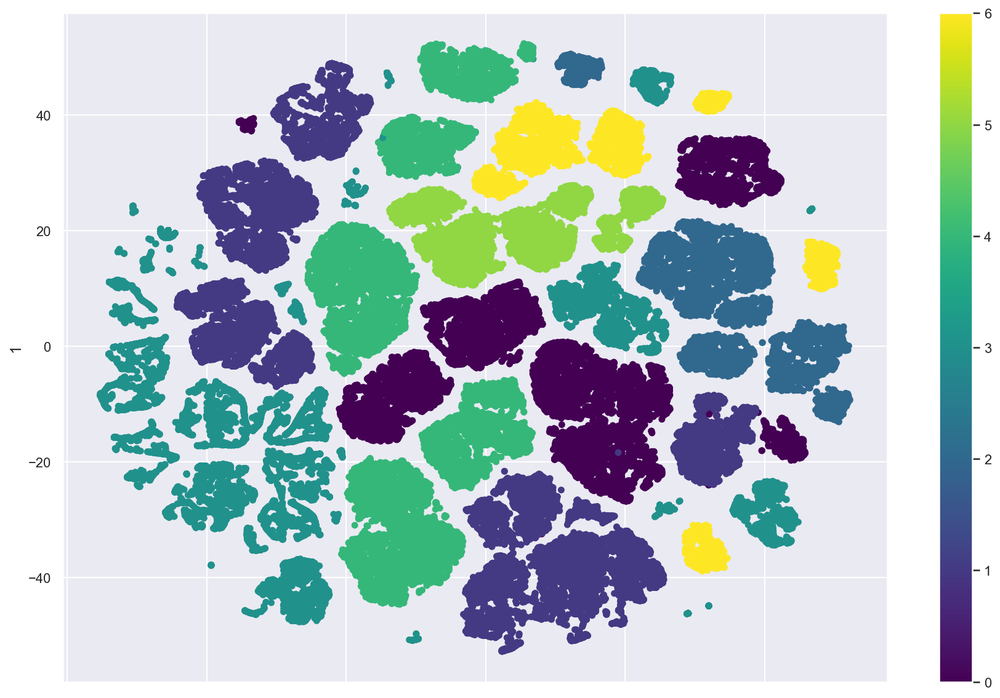

In [128]:
# # t-SNE visualization
pd.DataFrame(two_dim).plot.scatter(x=0, y=1, c = km_metric_perspective['Eng_labels'], colormap='viridis', figsize=(15,10))
plt.show()

locator: <matplotlib.colorbar._ColorbarAutoLocator object at 0x00000221C5838D00>
Using auto colorbar locator <matplotlib.colorbar._ColorbarAutoLocator object at 0x00000221C5838D00> on colorbar
Setting pcolormesh
top of axes not in the figure, so title not moved
top of axes not in the figure, so title not moved
top of axes not in the figure, so title not moved
top of axes not in the figure, so title not moved
top of axes not in the figure, so title not moved
top of axes not in the figure, so title not moved
top of axes not in the figure, so title not moved
top of axes not in the figure, so title not moved


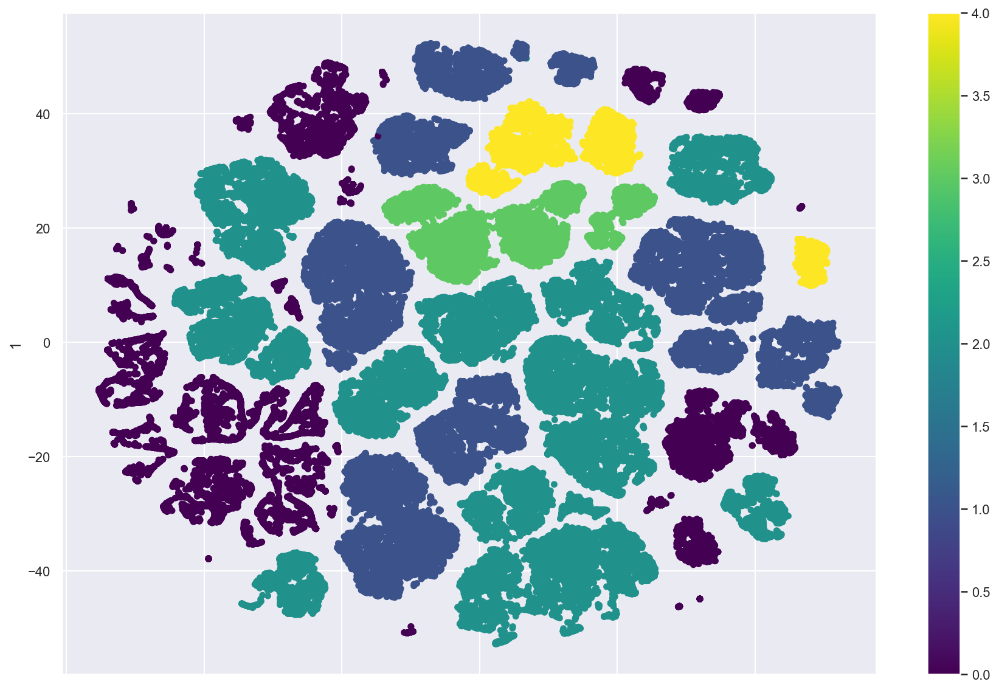

In [129]:
pd.DataFrame(two_dim).plot.scatter(x=0, y=1, c = km_metric_perspective['merged_labels'], colormap='viridis', figsize=(15,10))
plt.show()